Additional analyses and figures - cleanup in progress 03/15/25

In [2]:
import glob
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.lines as mlines
import matplotlib.pyplot as plt
from scipy import stats
from matplotlib import rcParams
from matplotlib.lines import Line2D
from matplotlib.patches import Patch
import textwrap


In [1177]:
path="/lab/solexa_gehring/elizabeth/ibarra_2012/ends_analysis/"
tab="\t"
plt.rcParams["font.family"] = "Arial"


In [1178]:
r7it="$\it{ros1}$"+"-"+"$\it{7}$"
r3it="$\it{ros1}$"+"-"+"$\it{3}$"
r1it="$\it{ros1}$"+"-"+"$\it{1}$"
dmeit="$\it{dme}$"
rddit="$\it{rdd}$"

In [1179]:
def methylends_format (df, plotselect, title, legend, ticklist, ticklabels, vlines, vlinescenter, ymin, ymax, yint, context='CG', sRNA=False):
    #special plot lists by context:
    if context=='CG':
        contextalt='CpG'
    else:
        contextalt=context
    print(context)

  
    matplot=['C24xCol_1_C24_pseudo_'+context+'_min5','C24xCol_2_C24_pseudo_'+context+'_min5','C24xCol_3_C24_pseudo_'+context+'_min5',
             'ColxC24_1_Col_spiked_'+context+'_min5','ColxC24_2_Col_spiked_'+context+'_min5','ColxC24_3_Col_spiked_'+context+'_min5',
             'r1xr3_1_C24_pseudo_'+context+'_min5','r1xr3_2_C24_pseudo_'+context+'_min5','r1xr3_3_C24_pseudo_'+context+'_min5',
             'r3xr1_1_Col_spiked_'+context+'_min5','r3xr1_2_Col_spiked_'+context+'_min5','r3xr1_3_Col_spiked_'+context+'_min5']
    patplot=['C24xCol_1_Col_spiked_'+context+'_min5','C24xCol_2_Col_spiked_'+context+'_min5','C24xCol_3_Col_spiked_'+context+'_min5',
             'ColxC24_1_C24_pseudo_'+context+'_min5','ColxC24_2_C24_pseudo_'+context+'_min5','ColxC24_3_C24_pseudo_'+context+'_min5',
             'r1xr3_1_Col_spiked_'+context+'_min5','r1xr3_2_Col_spiked_'+context+'_min5','r1xr3_3_Col_spiked_'+context+'_min5',
             'r3xr1_1_C24_pseudo_'+context+'_min5','r3xr1_2_C24_pseudo_'+context+'_min5','r3xr1_3_C24_pseudo_'+context+'_min5']
    scplot=['wt_sc_1_all_'+contextalt+'_min5_'+context+'con_pass_fixed','wt_sc_2_all_'+contextalt+'_min5_'+context+'con_pass_fixed',
            'ros1_sc_1_all_'+contextalt+'_min5_'+context+'con_pass_fixed','ros1_sc_2_all_'+contextalt+'_min5_'+context+'con_pass_fixed',
            'dme_sc_1_all_'+contextalt+'_min5_'+context+'con_pass_fixed','dme_sc_2_all_'+contextalt+'_min5_'+context+'con_pass_fixed',
            'dme_ros1_sc_1_all_'+contextalt+'_min5','dme_ros1_sc_2_all_'+contextalt+'_min5']
    hsiehplot=['wt_endo_hs_all_'+contextalt+'','dme_endo_hs_all_'+contextalt+'']
    endoplot=['wt_1_Col_spiked_'+context+'_min5','wt_2_Col_spiked_'+context+'_min5','wt_3_Col_spiked_'+context+'_min5',
              'r7_1_Col_spiked_'+context+'_min5','r7_2_Col_spiked_'+context+'_min5','r7_3_Col_spiked_'+context+'_min5',
              'r3_1_Col_spiked_'+context+'_min5','r3_2_Col_spiked_'+context+'_min5','r3_3_Col_spiked_'+context+'_min5']
    leafplot=['wt_1_leaf_Col_spiked_'+context+'_min5','wt_2_leaf_Col_spiked_'+context+'_min5','wt_3_leaf_Col_spiked_'+context+'_min5',
              'r7_1_leaf_Col_spiked_'+context+'_min5','r7_2_leaf_Col_spiked_'+context+'_min5','r7_3_leaf_Col_spiked_'+context+'_min5',
              'r3_1_leaf_Col_spiked_'+context+'_min5','r3_2_leaf_Col_spiked_'+context+'_min5','r3_3_leaf_Col_spiked_'+context+'_min5']
    sRNAplot=['embryo24nt','endo24nt']
    ibarra=['col_wt_x_ler_wt_Col_'+context+'_min5','col_dme_x_ler_wt_Col_'+context+'_min5',
            'col_wt_x_ler_wt_Ler_pseudo_'+context+'_min5','col_dme_x_ler_wt_Ler_pseudo_'+context+'_min5']
    endoplot=['wt_1_Col_spiked_'+context+'_min5','wt_2_Col_spiked_'+context+'_min5','wt_3_Col_spiked_'+context+'_min5',
              'r7_1_Col_spiked_'+context+'_min5','r7_2_Col_spiked_'+context+'_min5','r7_3_Col_spiked_'+context+'_min5',
              'r3_1_Col_spiked_'+context+'_min5','r3_2_Col_spiked_'+context+'_min5','r3_3_Col_spiked_'+context+'_min5']
    
    matpat_c24=[matplot[0],matplot[1],matplot[2],patplot[3],patplot[4],patplot[5],matplot[6],matplot[7],matplot[8],patplot[9],patplot[10],patplot[11]]
    matpat_c24_1rep=[matplot[0],patplot[3],matplot[6],patplot[9]]

    matpat_col=[matplot[3],matplot[4],matplot[5],patplot[0],patplot[1],patplot[2],matplot[9],matplot[10],matplot[11],patplot[6],patplot[7],patplot[8]]
    matpat_col_1rep=[matplot[3],patplot[0],matplot[9],patplot[6]]
    
    ecotypes=matpat_col_1rep+matpat_c24_1rep
    endo1rep=[endoplot[0], endoplot[3], endoplot[6]]
    bulkplot=endoplot+leafplot
    bulk_r3=[bulkplot[0], bulkplot[6], bulkplot[11], bulkplot[16]]
    bulkplot1rep=[bulkplot[0], bulkplot[4], bulkplot[6], bulkplot[11], bulkplot[13], bulkplot[16]]
    matpatplot=matplot+patplot
    matpat1rep=[matplot[0],matplot[6],patplot[0],patplot[6]]
    matpatscplot=matpatplot+scplot
    matpatsc1rep=[matpat1rep, scplot[0], scplot[2], scplot[4], scplot[6]]
    matpatschsiehplot=matpatscplot+hsiehplot
    matpatschsieh1rep=matpatsc1rep+hsiehplot
    allplot=matpatschsiehplot+bulkplot
    matpatdme=matpatplot+hsiehplot
    matpatdme1rep=matpat1rep+hsiehplot
    bulkdme=bulkplot+hsiehplot
    patscplot=patplot+scplot
    patsc1rep=[patplot[0], patplot[6], scplot[0], scplot[2], scplot[4], scplot[6]]
    matpatbulkplot=matpatplot+bulkplot
    matdmeplot=matplot+hsiehplot

    plotdict={'dme':hsiehplot,'matpat':matpatplot, 'matpat1rep':matpat1rep, 'matpatsc':matpatscplot, 'matpatsc1rep':matpatsc1rep,
             'matpatscdme':matpatschsiehplot, 'matpatdme':matpatdme, 'matpatdme1rep': matpatdme1rep, 'patsc':patscplot, 'patsc1rep':patsc1rep, 'sRNA':sRNAplot,
             'bulk':bulkplot, 'bulk1rep':bulkplot1rep, 'endo':endoplot, 'endo1rep':endo1rep, 'bulk_r3':bulk_r3, 'matpatcol':matpat_col, 'matpatc24':matpat_c24,
             'col1rep':matpat_col_1rep, 'c241rep':matpat_c24_1rep, 'ibarra':ibarra, 'eco1rep':ecotypes}
    plotlist=plotdict.get(plotselect)
    
    endscooler={'C24xCol_1_C24_pseudo_'+context+'_min5': '#B2218E',
     'C24xCol_2_C24_pseudo_'+context+'_min5': '#B2218E',
     'C24xCol_3_C24_pseudo_'+context+'_min5': '#B2218E',
     'ColxC24_1_Col_spiked_'+context+'_min5': '#B2218E',
     'ColxC24_2_Col_spiked_'+context+'_min5': '#B2218E',
     'ColxC24_3_Col_spiked_'+context+'_min5': '#B2218E',
     'r1xr3_1_C24_pseudo_'+context+'_min5': '#4871B7',
     'r1xr3_2_C24_pseudo_'+context+'_min5': '#4871B7',
     'r1xr3_3_C24_pseudo_'+context+'_min5': '#4871B7',
     'r3xr1_1_Col_spiked_'+context+'_min5': '#4871B7',
     'r3xr1_2_Col_spiked_'+context+'_min5': '#4871B7',
     'r3xr1_3_Col_spiked_'+context+'_min5': '#4871B7',
     'C24xCol_1_Col_spiked_'+context+'_min5': '#CDCC32',
     'C24xCol_2_Col_spiked_'+context+'_min5': '#CDCC32',
     'C24xCol_3_Col_spiked_'+context+'_min5': '#CDCC32',
     'ColxC24_1_C24_pseudo_'+context+'_min5': '#CDCC32',
     'ColxC24_2_C24_pseudo_'+context+'_min5': '#CDCC32',
     'ColxC24_3_C24_pseudo_'+context+'_min5': '#CDCC32',
     'r1xr3_1_Col_spiked_'+context+'_min5': '#6ABA58',
     'r1xr3_2_Col_spiked_'+context+'_min5': '#6ABA58',
     'r1xr3_3_Col_spiked_'+context+'_min5': '#6ABA58',
     'r3xr1_1_C24_pseudo_'+context+'_min5': '#6ABA58',
     'r3xr1_2_C24_pseudo_'+context+'_min5': '#6ABA58',
     'r3xr1_3_C24_pseudo_'+context+'_min5': '#6ABA58',
     'wt_sc_1_all_'+contextalt+'_min5_'+context+'con_pass_fixed': '#F8333C',
     'wt_sc_2_all_'+contextalt+'_min5_'+context+'con_pass_fixed': '#F8333C',
     'ros1_sc_1_all_'+contextalt+'_min5_'+context+'con_pass_fixed': '#ADD9F4',
     'ros1_sc_2_all_'+contextalt+'_min5_'+context+'con_pass_fixed': '#ADD9F4',
     'dme_sc_1_all_'+contextalt+'_min5_'+context+'con_pass_fixed': '#F7B2BD',
     'dme_sc_2_all_'+contextalt+'_min5_'+context+'con_pass_fixed': '#F7B2BD',
     'dme_ros1_sc_1_all_'+contextalt+'_min5': '#3F826D',
     'dme_ros1_sc_2_all_'+contextalt+'_min5': '#3F826D',
     'wt_endo_hs_all_'+contextalt+'': '#ffa600',
     'dme_endo_hs_all_'+contextalt+'': '#FFFC31',
     'wt_1_Col_spiked_'+context+'_min5': '#66c2a5',
     'wt_2_Col_spiked_'+context+'_min5': '#66c2a5',
     'wt_3_Col_spiked_'+context+'_min5': '#66c2a5',
     'r7_1_Col_spiked_'+context+'_min5': '#fc8d62',
     'r7_2_Col_spiked_'+context+'_min5': '#fc8d62',
     'r7_3_Col_spiked_'+context+'_min5': '#fc8d62',
     'r3_1_Col_spiked_'+context+'_min5': '#8da0cb',
     'r3_2_Col_spiked_'+context+'_min5': '#8da0cb',
     'r3_3_Col_spiked_'+context+'_min5': '#8da0cb',
     'rdd_1_Col_spiked_'+context+'_min5': '#60A561',
     'rdd_2_Col_spiked_'+context+'_min5': '#60A561',
     'rdd_3_Col_spiked_'+context+'_min5': '#60A561',
                'embryo24nt':'#022B3A','endo24nt':'#DA3548',
                'r7_1_leaf_Col_spiked_'+context+'_min5': "#a6d854",
                'r7_2_leaf_Col_spiked_'+context+'_min5': "#a6d854",
                'r7_3_leaf_Col_spiked_'+context+'_min5': "#a6d854",
                'wt_1_leaf_Col_spiked_'+context+'_min5': '#e78ac3',
                'wt_2_leaf_Col_spiked_'+context+'_min5': '#e78ac3',
                'wt_3_leaf_Col_spiked_'+context+'_min5': '#e78ac3',

                'r3_1_leaf_Col_spiked_'+context+'_min5': "#ffd92f",
                'r3_2_leaf_Col_spiked_'+context+'_min5': "#ffd92f",
                'r3_3_leaf_Col_spiked_'+context+'_min5': "#ffd92f",
                'col_dme_x_ler_wt_Col_'+context+'_min5':"#FFFC31",
                'col_dme_x_ler_wt_Ler_pseudo_'+context+'_min5':"#ccb301",
                'col_wt_x_ler_wt_Col_'+context+'_min5':"#241023",
                'col_wt_x_ler_wt_Ler_pseudo_'+context+'_min5':"#2B9EB3"
               }

    #df set up to include plostlis samples
    dfplot=df[df['sample'].isin(plotlist)]

    #dfplot.to_csv(endsout+"testdf.txt", sep=tab)
    #make seaborn lineplot
    sns.set(style="ticks",font="Arial")
    if sRNA!=False:
        plot='mC'
    else:
        plot='mC'
        
    window = dfplot['window']
    avgmethy = dfplot[plot]
    hue = dfplot['sample']
    plt.figure(figsize=(12,10))

    ax= sns.lineplot(x=window, y=avgmethy, hue=hue, palette=endscooler, linewidth=4)

    #plt.title(title, fontsize=20)
    ax.set_xlabel(xlabel="")
    ax.set_ylabel(ylabel="average "+context+" methylation", fontsize=30)
    
    if sRNA!=False:
        ax.set_ylabel(ylabel="average single-base comp 24nt sRNA", fontsize=30)
        
    #custom xticks for boundaries
    plt.xticks(ticks=ticklist, labels=ticklabels, fontsize=28)
    plt.xticks(rotation=50)
    plt.yticks(fontsize=28)
    
    if yint==None:
        yint=0
    else:
        yint=yint
        
    ax.set_yticks(ticks=np.arange(ymin, ymax, yint, dtype=float))

    #custom lines to denote boundries clearly
    plt.vlines(x=vlines, ymin=ymin, ymax=ymax, colors='green', ls=':', lw=2)
    plt.vlines(x=vlinescenter, ymin=ymin, ymax=ymax, colors='black', lw=2)
   
    #legend
    
    handle_list=[]
    for key, value in legend.items():
        newsample = mlines.Line2D([], [], color=value, markersize=12, label=key, linewidth=4)
        handle_list.append(newsample)

    ax.legend(handles=handle_list, fontsize=18, loc='upper left')
  
    plt.tight_layout()

    #return fig,ax

In [1180]:
endscol=['window','mC','sample']

#ends paths:
mCends=path+"ends_analysis/results_underlying_figs_published/mC_summed/"
sRNAends=path+"ends_analysis/results_underlying_figs_published/sRNAs_summed/"

def read_ends_data(filepath):
    df=pd.read_csv(filepath, header=None, sep=tab, names=endscol)
    df['sample'] = df['sample'].str.replace('.bed', '')
    
    return df





In [293]:
# lists to create ticks with ends distance and vertical lines for boundaries
in500_out3000_50bp_ticks=[1, 60, 70.5, 80, 140]

in500_out3000_50bp_ticks_labels=['-3kb', "5' DMR", '+/- 500bp', "3' DMR", '+3kb']

in500_out3000_50bp_vlines=[1, 60, 80, 140]
in500_out3000_50bp_vlines_center =[70.5]

in500_out3000_50bp_moreticks=[1, 10, 20, 30, 40, 50, 60, 70.5, 80, 90, 100, 110, 120, 130, 140]
in500_out3000_50bp_ticks_morelabels=['-3kb','-2.5kb','-2kb','-1.5kb','-1kb','-0.5kb', "5' TEmerge", '+/- 500bp', "3' TEmerge",'+0.5kb','+1kb','+1.5kb','+2kb','+2.5kb','+3kb']


# lines for smaller x axis from bigger ends data
in200_out1000_50bp_ticks=[1, 20, 24.5, 29, 48]

in200_out1000_50bp_ticks_DMR_labels=['-1kb', "5' DMR", '+/- 200bp', "3' DMR", '+1kb']
in200_out1000_50bp_ticks_DSR_labels=['-1kb', "5' DSR", '+/- 200bp', "3' DSR", '+1kb']

in200_out1000_50bp_vlines=[1, 20, 29, 48]
in200_out1000_50bp_vlines_center =[24.5]

# lines for smaller x axis from bigger ends data
in400_out1000_50bp_ticks=[1, 20, 28, 36, 56]

in400_out1000_50bp_ticks_labels=['-1kb', "5' DMR", '+/- 400bp', "3' DMR", '+1kb']

in400_out1000_50bp_vlines=[1, 20, 36, 56]
in400_out1000_50bp_vlines_center =[28]


# 
in1000_out2000_100bp_ticks=[1, 20, 30, 40, 60]
in1000_out2000_100bp_tick_labels_gene=['-2kb', "5' gene", '+/- 1kb', "3' gene", '+2kb']
in1000_out2000_100bp_vlines=[1, 20, 40, 60]
in1000_out2000_100bp_vlines_center=[30]

#
in2000_out2000_100bp_ticks=[1, 21, 41, 60, 80]
in2000_out2000_100bp_tick_labels_gene=['-2kb', "5' gene", '+/- 2kb', "3' gene", '+2kb']
in2000_out2000_100bp_vlines=[1, 21, 60, 80]
in2000_out2000_100bp_vlines_center=[41]

# 

in1000_out2000_100bp_tick_labels_TE=['-2kb', "TE start", '+/- 1kb', "TE end", '+2kb']


#

in2000_out2000_100bp_tick_labels_TE=['-2kb', "TE start", '+/- 2kb', "TE end", '+2kb']



# lines for smaller x axis from bigger ends data
in100_out1000_50bp_ticks=[1, 20, 22, 24, 44]

in100_out1000_50bp_ticks_DMR_labels=['-1kb', "5' DMR", '+/- 100bp', "3' DMR", '+1kb']
in100_out1000_50bp_ticks_DSR_labels=['-1kb', "5' DSR", '+/- 100bp', "3' DSR", '+1kb']

in100_out1000_50bp_vlines=[1, 20, 24, 44]
in100_out1000_50bp_vlines_center =[22]


# ends legend dictionaries
matpatlegend={'C24xCol maternal': '#B2218E',
              'C24xCol paternal': '#CDCC32',
              'r1xr3 maternal': '#4871B7',
              'r1xr3 paternal': '#6ABA58'}

matpatlegend1rep={'C24xCol maternal': '#B2218E',
              'C24xCol paternal': '#CDCC32',
              'r1xr3 maternal': '#4871B7',
              'r1xr3 paternal': '#6ABA58'}

matpatschsiehlegend={'C24xCol recip maternal': '#241023',
              'C24xCol recip paternal': '#ccb301',
              'r1xr3 recip maternal': '#2B9EB3',
              'r1xr3 recip paternal': '#6aba58',
              'Col-0 sperm': '#F8333C',
              'ros1 sperm': '#ADD9F4',
              'dme sperm': '#F7B2BD',
              'dme;ros1 sperm': '#3F826D',
              'WT endosperm Hsieh et al': '#ffa600',
              'dme endosperm Hsieh et al': '#FFFC31'}
              

patsclegend={'C24xCol recip paternal': '#CDCC32',
             'r1xr3 recip paternal': '#6ABA58',
             'Col-0 sperm': '#F8333C',
             'ros1 sperm': '#ADD9F4',
             'dme/+ sperm': '#F7B2BD',
             'dme/+;ros1 sperm': '#3F826D'}   

matpatdmelegend={'C24xCol recip maternal': '#241023',
                 'C24xCol recip paternal': '#ccb301',
                 'r1xr3 recip maternal': '#2B9EB3',
                 'r1xr3 recip paternal': '#6aba58',
                 'WT endosperm*': '#ffa600','dme endosperm*': '#FFFC31'}
 
matdmelegend={'C24xCol recip maternal': '#241023',
              'r1xr3 recip maternal': '#2B9EB3',
              'WT endosperm*': '#ffa600','dme endosperm*': '#FFFC31'}

patsclegend1rep={'C24xCol paternal': '#CDCC32',
             'r1xr3 paternal': '#6ABA58',
             'Col-0 sperm': '#F8333C',
             r3it+' sperm': '#ADD9F4',
             dmeit+'/+ sperm': '#F7B2BD',
             dmeit+'/+;'+r3it+' sperm': '#3F826D'}   

matpatdmelegend1rep={'C24xCol maternal': '#241023',
                 'C24xCol paternal': '#ccb301',
                 'r1xr3 maternal': '#2B9EB3',
                 'r1xr3 paternal': '#6aba58',
                 'WT endosperm*': '#ffa600','dme endosperm*': '#FFFC31'}
dmeit="$\it{dme}$"
dmelegend={'WT endosperm': '#ffa600', dmeit+' endosperm': '#FFFC31'}

srnalegend={'embryo 24nt':'#022B3A','endo 24nt':'#DA3548'}


bulklegend={'Col-0 endosperm': '#66c2a5',
              r7it+' endosperm': '#fc8d62',
              r3it+' endosperm': '#8da0cb',
              'Col-0 leaf': '#e78ac3',
              r7it+' leaf': '#a6d854',
              r3it+' leaf': '#ffd92f'}

endolegend={'Col-0 endosperm': '#66c2a5',
              'ros1-7 endosperm': '#fc8d62',
              'ros1-3 endosperm': '#8da0cb'}

bulkr3legend={'Col-0 endosperm': '#66c2a5',
              r3it+' endosperm': '#8da0cb',
              'Col-0 leaf': '#e78ac3',
              r3it+' leaf': '#ffd92f'}

matpat_collegend={'Col maternal': '#241023',
                 'Col paternal': '#ccb301',
                 r3it+" maternal": '#2B9EB3',
                 r3it+" paternal": '#6aba58'}
matpat_c24legend={'C24 maternal': '#241023',
                 'C24 paternal': '#ccb301',
                 r1it+" maternal": '#2B9EB3',
                 r1it+" paternal": '#6aba58'}

ibarra_legend={'Col x Ler mat':"#241023",
                dmeit+' x Ler mat':"#FFFC31",
              'Col x Ler pat':"#2B9EB3",
              dmeit+' x Ler pat':"#ccb301"}


In [1182]:
dmedom_ends=path+"dme_dominant_out/"
ros1ant_ends=path+"ros1needed_out/"
ros1pat_ends=path+"ros1hyperPat_out/"
ros1bulk_ends=path+"r3_hyperbulk_out/"

figurepath=path+"python_figures/"


In [1183]:
# DMR ends
# allelic DMRs
dmedom_CG=read_ends_data(dmedom_ends+'dme_dom_CG_in400out1kb_average_counts_filt.txt')
dmedom_CHG=read_ends_data(dmedom_ends+'dme_dom_CHG_in400out1kb_average_counts_filt.txt')
dmedom_CHH=read_ends_data(dmedom_ends+'dme_dom_CHH_in400out1kb_average_counts_filt.txt')

ros1ant_CG=read_ends_data(ros1ant_ends+'ros1needed_CG_in200out1kb_average_counts_filt.txt')
ros1ant_CHG=read_ends_data(ros1ant_ends+'ros1needed_CHG_in200out1kb_average_counts_filt.txt')
ros1ant_CHH=read_ends_data(ros1ant_ends+'ros1needed_CHH_in200out1kb_average_counts_filt.txt')

ros1pat_CG=read_ends_data(ros1pat_ends+'ros1hyperPat_CG_in200out1kb_average_counts_filt.txt')
ros1pat_CHG=read_ends_data(ros1pat_ends+'ros1hyperPat_CHG_in200out1kb_average_counts_filt.txt')
ros1pat_CHH=read_ends_data(ros1pat_ends+'ros1hyperPat_CHH_in200out1kb_average_counts_filt.txt')

r3bulk_CG=read_ends_data(ros1bulk_ends+'r3_hyperbulk_CG_in200out1kb_average_counts_filt.txt')

/tmp/ipykernel_3616052/3617122470.py:9: FutureWarning: The default value of regex will change from True to False in a future version.
  df['sample'] = df['sample'].str.replace('.bed', '')


CG


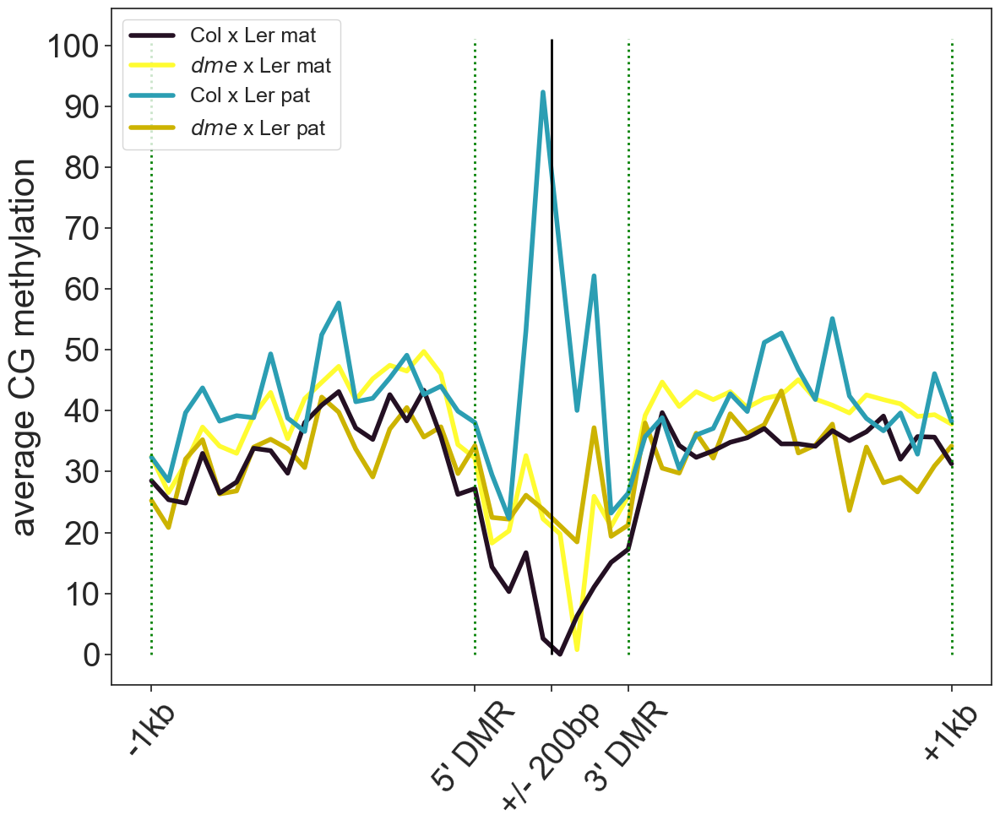

In [1185]:
methylends_format(r3bulk_CG, 'ibarra','', ibarra_legend, in200_out1000_50bp_ticks, in200_out1000_50bp_ticks_DMR_labels,
                  in200_out1000_50bp_vlines, in200_out1000_50bp_vlines_center, 0, 101, 10, context='CG', sRNA=False)
#plt.savefig(figurepath+'r3_hyper_ibarra_CG_ends.pdf', dpi=350)


CG


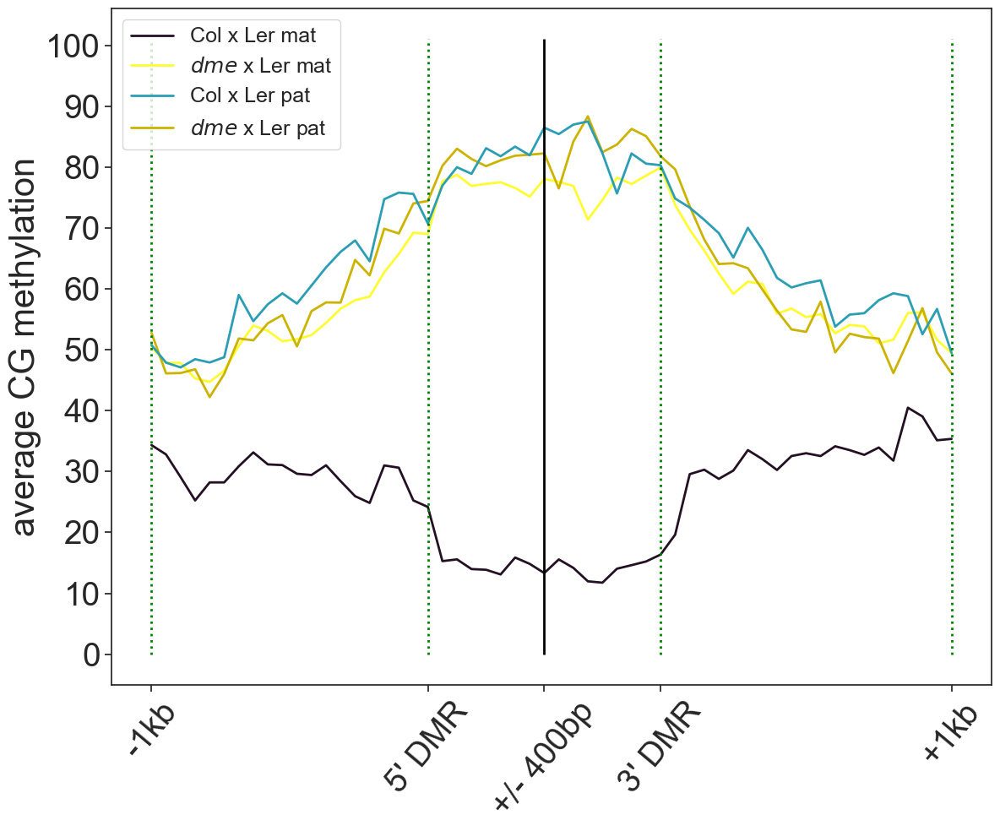

In [64]:
# make the plots
methylends_format(dmedom_CG, 'ibarra','', ibarra_legend, in400_out1000_50bp_ticks, in400_out1000_50bp_ticks_labels,
                  in400_out1000_50bp_vlines, in400_out1000_50bp_vlines_center, 0, 101, 10, context='CG', sRNA=False)
plt.savefig(figurepath+'dme_dom_ibarra_CG_ends.pdf', dpi=350)


CHG


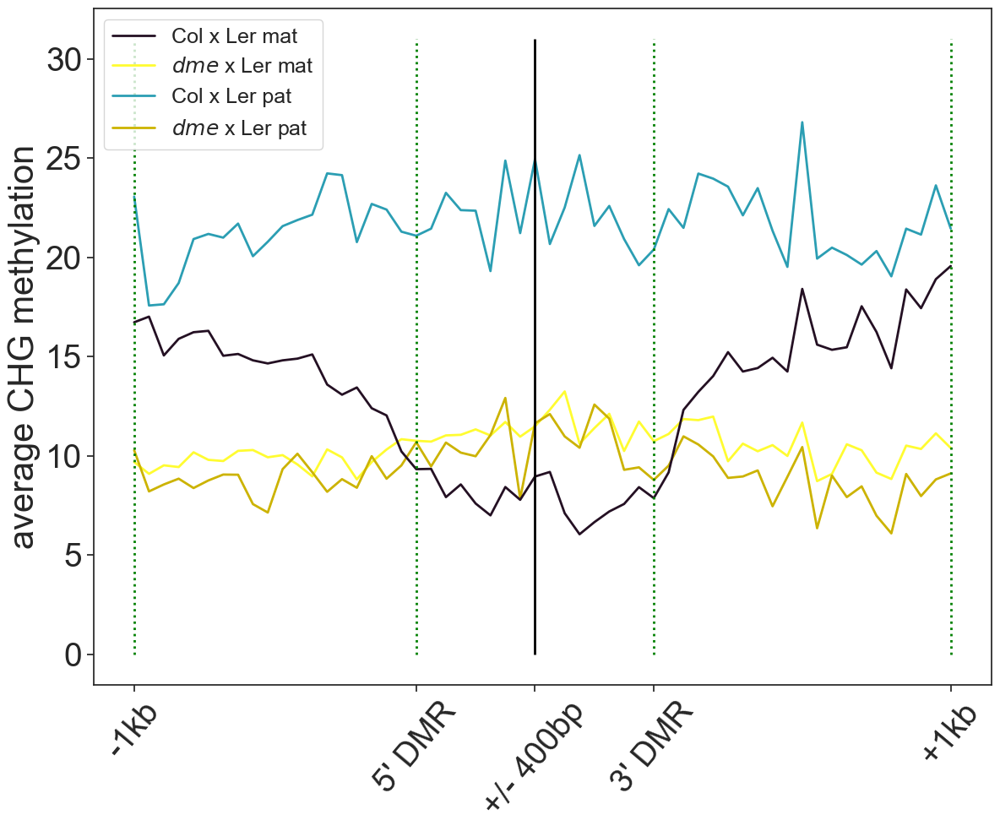

In [65]:
methylends_format(dmedom_CHG, 'ibarra','', ibarra_legend, in400_out1000_50bp_ticks, in400_out1000_50bp_ticks_labels,
                  in400_out1000_50bp_vlines, in400_out1000_50bp_vlines_center, 0, 31, 5, context='CHG', sRNA=False)
plt.savefig(figurepath+'dme_dom_ibarra_CHG_ends.pdf', dpi=350)


CHH


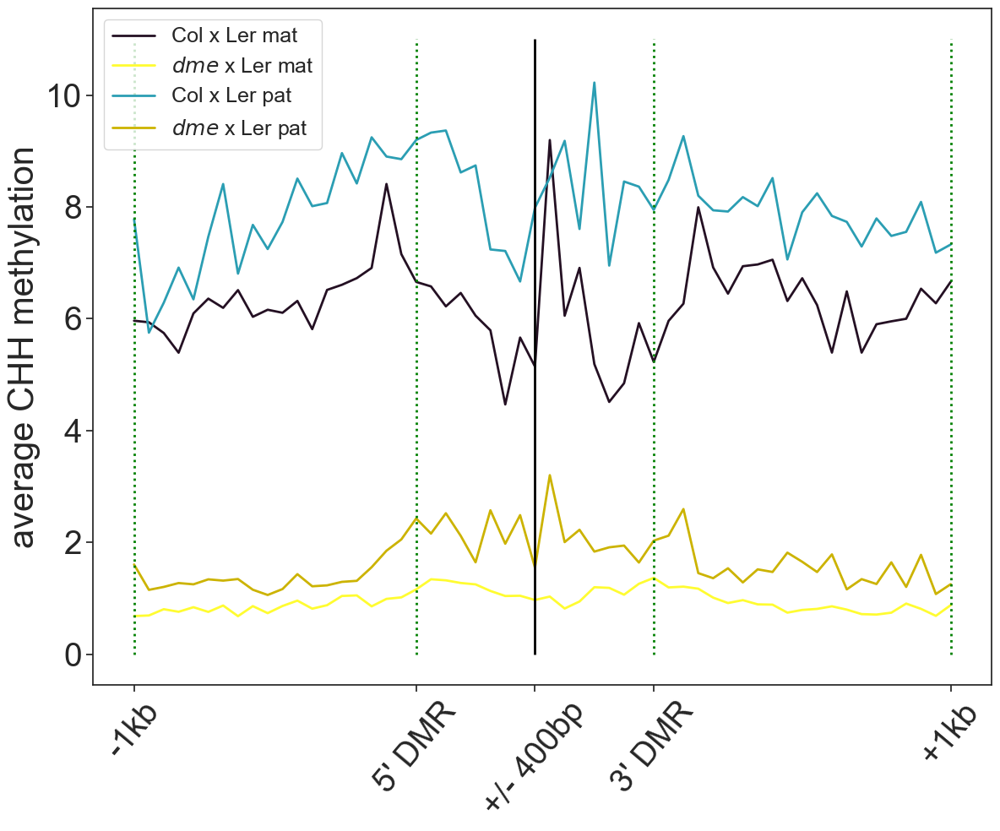

In [66]:
methylends_format(dmedom_CHH, 'ibarra','', ibarra_legend, in400_out1000_50bp_ticks, in400_out1000_50bp_ticks_labels,
                  in400_out1000_50bp_vlines, in400_out1000_50bp_vlines_center, 0, 11, 2, context='CHH', sRNA=False)
plt.savefig(figurepath+'dme_dom_ibarra_CHH_ends.pdf', dpi=350)


CG


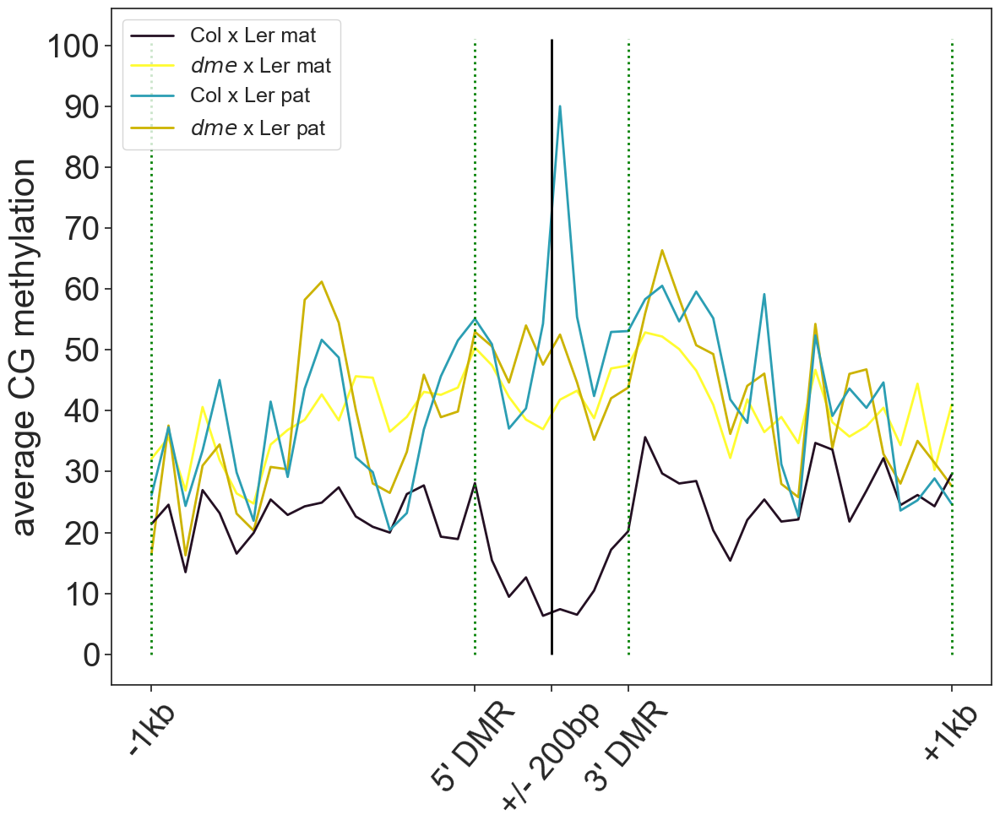

In [67]:
methylends_format(ros1ant_CG, 'ibarra','', ibarra_legend, in200_out1000_50bp_ticks, in200_out1000_50bp_ticks_DMR_labels,
                  in200_out1000_50bp_vlines, in200_out1000_50bp_vlines_center, 0, 101, 10, context='CG', sRNA=False)
plt.savefig(figurepath+'ros1_ant_ibarra_CG_ends.pdf', dpi=350)


CHG


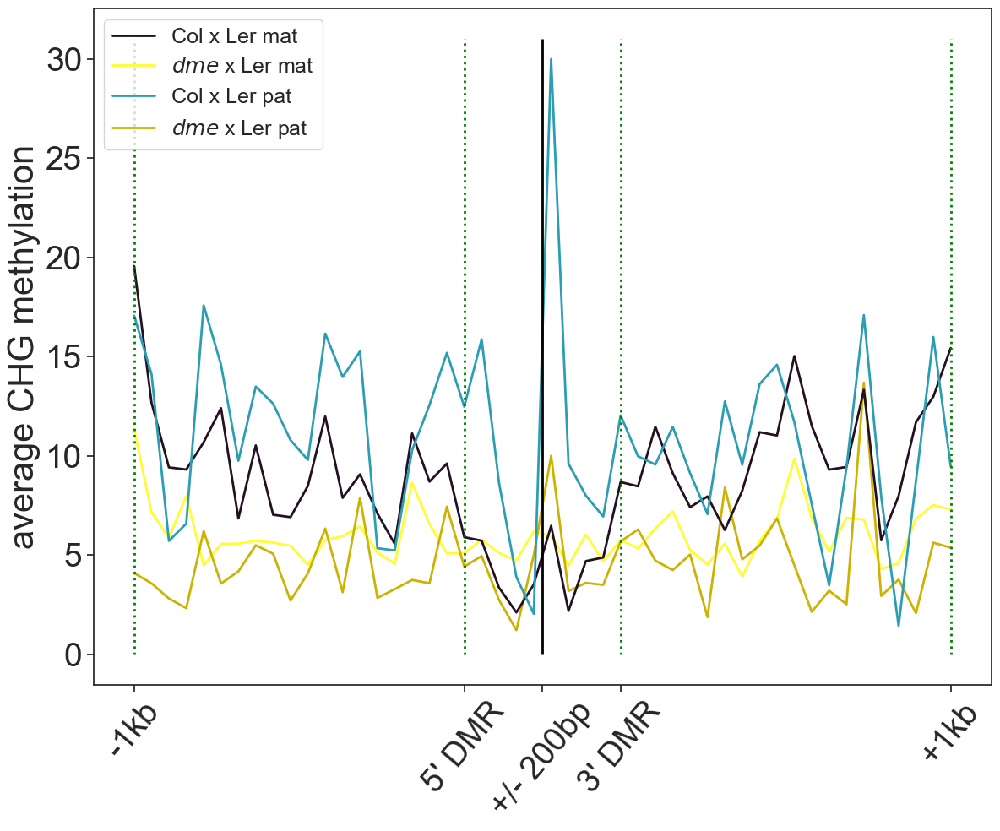

In [68]:
methylends_format(ros1ant_CHG, 'ibarra','', ibarra_legend, in200_out1000_50bp_ticks, in200_out1000_50bp_ticks_DMR_labels,
                  in200_out1000_50bp_vlines, in200_out1000_50bp_vlines_center, 0, 31, 5, context='CHG', sRNA=False)
plt.savefig(figurepath+'ros1_ant_ibarra_CHG_ends.pdf', dpi=350)


CHH


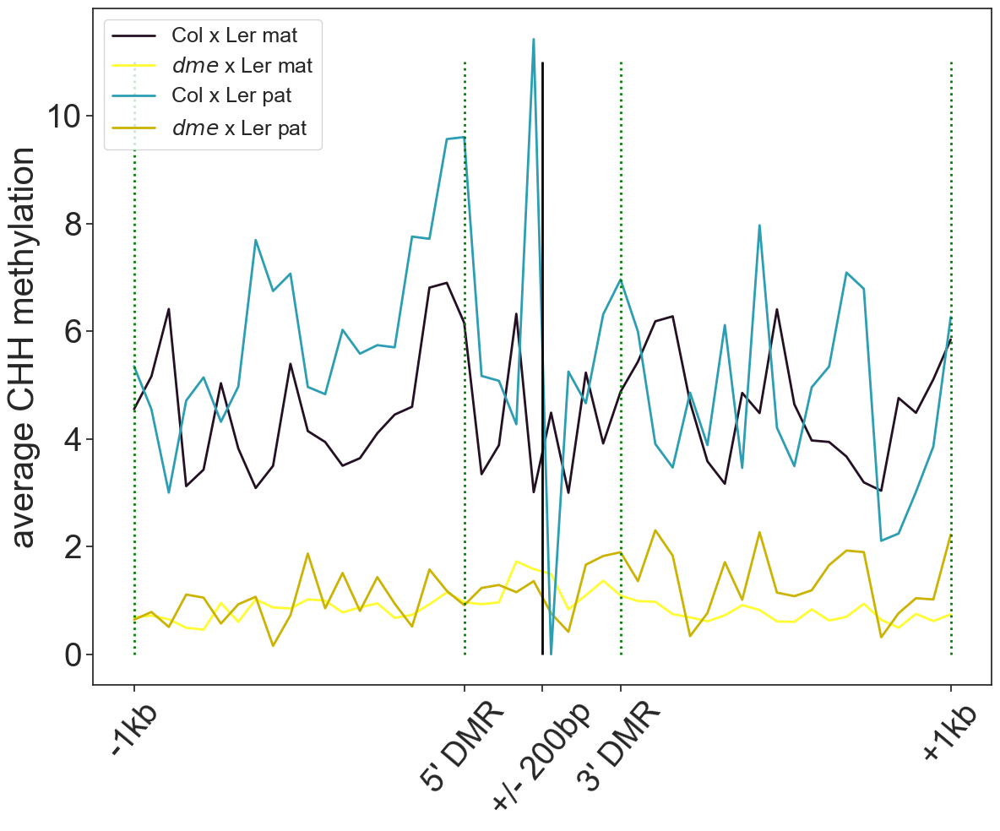

In [69]:
methylends_format(ros1ant_CHH, 'ibarra','', ibarra_legend, in200_out1000_50bp_ticks, in200_out1000_50bp_ticks_DMR_labels,
                  in200_out1000_50bp_vlines, in200_out1000_50bp_vlines_center, 0, 11, 2, context='CHH', sRNA=False)
plt.savefig(figurepath+'ros1_ant_ibarra_CHH_ends.pdf', dpi=350)


# TE fragments ends to replace TEmerge ends

In [290]:
def methylends_format (df, plotselect, title, legend, ticklist, ticklabels, vlines, vlinescenter, ymin, ymax, yint, context='CG', sRNA=False):
    #special plot lists by context:
    if context=='CG':
        contextalt='CpG'
    else:
        contextalt=context
    print(context)
  
    matplot=['C24xCol_1_C24_pseudo_'+context+'_min5','C24xCol_2_C24_pseudo_'+context+'_min5','C24xCol_3_C24_pseudo_'+context+'_min5',
             'ColxC24_1_Col_spiked_'+context+'_min5','ColxC24_2_Col_spiked_'+context+'_min5','ColxC24_3_Col_spiked_'+context+'_min5',
             'r1xr3_1_C24_pseudo_'+context+'_min5','r1xr3_2_C24_pseudo_'+context+'_min5','r1xr3_3_C24_pseudo_'+context+'_min5',
             'r3xr1_1_Col_spiked_'+context+'_min5','r3xr1_2_Col_spiked_'+context+'_min5','r3xr1_3_Col_spiked_'+context+'_min5']
    patplot=['C24xCol_1_Col_spiked_'+context+'_min5','C24xCol_2_Col_spiked_'+context+'_min5','C24xCol_3_Col_spiked_'+context+'_min5',
             'ColxC24_1_C24_pseudo_'+context+'_min5','ColxC24_2_C24_pseudo_'+context+'_min5','ColxC24_3_C24_pseudo_'+context+'_min5',
             'r1xr3_1_Col_spiked_'+context+'_min5','r1xr3_2_Col_spiked_'+context+'_min5','r1xr3_3_Col_spiked_'+context+'_min5',
             'r3xr1_1_C24_pseudo_'+context+'_min5','r3xr1_2_C24_pseudo_'+context+'_min5','r3xr1_3_C24_pseudo_'+context+'_min5']
    scplot=['wt_sc_1_all_'+contextalt+'_min5_'+context+'con_pass_fixed','wt_sc_2_all_'+contextalt+'_min5_'+context+'con_pass_fixed',
            'ros1_sc_1_all_'+contextalt+'_min5_'+context+'con_pass_fixed','ros1_sc_2_all_'+contextalt+'_min5_'+context+'con_pass_fixed',
            'dme_sc_1_all_'+contextalt+'_min5_'+context+'con_pass_fixed','dme_sc_2_all_'+contextalt+'_min5_'+context+'con_pass_fixed',
            'dme_ros1_sc_1_all_'+contextalt+'_min5','dme_ros1_sc_2_all_'+contextalt+'_min5']
    hsiehplot=['wt_endo_hs_all_'+contextalt+'','dme_endo_hs_all_'+contextalt+'']
    endoplot=['wt_1_Col_spiked_'+context+'_min5','wt_2_Col_spiked_'+context+'_min5','wt_3_Col_spiked_'+context+'_min5',
              'r7_1_Col_spiked_'+context+'_min5','r7_2_Col_spiked_'+context+'_min5','r7_3_Col_spiked_'+context+'_min5',
              'r3_1_Col_spiked_'+context+'_min5','r3_2_Col_spiked_'+context+'_min5','r3_3_Col_spiked_'+context+'_min5']
    leafplot=['wt_1_leaf_Col_spiked_'+context+'_min5','wt_2_leaf_Col_spiked_'+context+'_min5','wt_3_leaf_Col_spiked_'+context+'_min5',
              'r7_1_leaf_Col_spiked_'+context+'_min5','r7_2_leaf_Col_spiked_'+context+'_min5','r7_3_leaf_Col_spiked_'+context+'_min5',
              'r3_1_leaf_Col_spiked_'+context+'_min5','r3_2_leaf_Col_spiked_'+context+'_min5','r3_3_leaf_Col_spiked_'+context+'_min5']
    sRNAplot=['embryo24nt','endo24nt']
    matpat_c24=[matplot[0],matplot[1],matplot[2],patplot[3],patplot[4],patplot[5],matplot[6],matplot[7],matplot[8],patplot[9],patplot[10],patplot[11]]
    matpat_c24_1rep=[matplot[0],patplot[3],matplot[6],patplot[9]]

    matpat_col=[matplot[3],matplot[4],matplot[5],patplot[0],patplot[1],patplot[2],matplot[9],matplot[10],matplot[11],patplot[6],patplot[7],patplot[8]]
    matpat_col_1rep=[matplot[3],patplot[0],matplot[9],patplot[6]]

    endo1rep=[endoplot[0], endoplot[3], endoplot[6]]
    bulkplot=endoplot+leafplot
    bulk_r3=[bulkplot[0], bulkplot[6], bulkplot[11], bulkplot[16]]
    bulkplot1rep=[bulkplot[0], bulkplot[4], bulkplot[6], bulkplot[11], bulkplot[13], bulkplot[16]]
    matpatplot=matplot+patplot
    matpat1rep=[matplot[0],matplot[6],patplot[0],patplot[6]]
    matpatscplot=matpatplot+scplot
    matpatsc1rep=[matpat1rep, scplot[0], scplot[2], scplot[4], scplot[6]]
    matpatschsiehplot=matpatscplot+hsiehplot
    matpatschsieh1rep=matpatsc1rep+hsiehplot
    allplot=matpatschsiehplot+bulkplot
    matpatdme=matpatplot+hsiehplot
    matpatdme1rep=matpat1rep+hsiehplot
    bulkdme=bulkplot+hsiehplot
    patscplot=patplot+scplot
    patsc1rep=[patplot[0], patplot[6], scplot[0], scplot[2], scplot[4], scplot[6]]
    matpatbulkplot=matpatplot+bulkplot
    matdmeplot=matplot+hsiehplot

    plotdict={'dme':hsiehplot,'matpat':matpatplot, 'matpat1rep':matpat1rep, 'matpatsc':matpatscplot, 'matpatsc1rep':matpatsc1rep,
             'matpatscdme':matpatschsiehplot, 'matpatdme':matpatdme, 'matpatdme1rep': matpatdme1rep, 'patsc':patscplot, 'patsc1rep':patsc1rep, 'sRNA':sRNAplot,
             'bulk':bulkplot, 'bulk1rep':bulkplot1rep, 'endo':endoplot, 'endo1rep':endo1rep, 'bulk_r3':bulk_r3, 'matpatcol':matpat_col, 'matpatc24':matpat_c24,
             'col1rep':matpat_col_1rep, 'c241rep':matpat_c24_1rep}
    plotlist=plotdict.get(plotselect)
    
    endscooler={'C24xCol_1_C24_pseudo_'+context+'_min5': '#241023',
     'C24xCol_2_C24_pseudo_'+context+'_min5': '#241023',
     'C24xCol_3_C24_pseudo_'+context+'_min5': '#241023',
     'ColxC24_1_Col_spiked_'+context+'_min5': '#241023',
     'ColxC24_2_Col_spiked_'+context+'_min5': '#241023',
     'ColxC24_3_Col_spiked_'+context+'_min5': '#241023',
     'r1xr3_1_C24_pseudo_'+context+'_min5': '#2B9EB3',
     'r1xr3_2_C24_pseudo_'+context+'_min5': '#2B9EB3',
     'r1xr3_3_C24_pseudo_'+context+'_min5': '#2B9EB3',
     'r3xr1_1_Col_spiked_'+context+'_min5': '#2B9EB3',
     'r3xr1_2_Col_spiked_'+context+'_min5': '#2B9EB3',
     'r3xr1_3_Col_spiked_'+context+'_min5': '#2B9EB3',
     'C24xCol_1_Col_spiked_'+context+'_min5': '#ccb301',
     'C24xCol_2_Col_spiked_'+context+'_min5': '#ccb301',
     'C24xCol_3_Col_spiked_'+context+'_min5': '#ccb301',
     'ColxC24_1_C24_pseudo_'+context+'_min5': '#ccb301',
     'ColxC24_2_C24_pseudo_'+context+'_min5': '#ccb301',
     'ColxC24_3_C24_pseudo_'+context+'_min5': '#ccb301',
     'r1xr3_1_Col_spiked_'+context+'_min5': '#6aba58',
     'r1xr3_2_Col_spiked_'+context+'_min5': '#6aba58',
     'r1xr3_3_Col_spiked_'+context+'_min5': '#6aba58',
     'r3xr1_1_C24_pseudo_'+context+'_min5': '#6aba58',
     'r3xr1_2_C24_pseudo_'+context+'_min5': '#6aba58',
     'r3xr1_3_C24_pseudo_'+context+'_min5': '#6aba58',
     'wt_sc_1_all_'+contextalt+'_min5_'+context+'con_pass_fixed': '#F8333C',
     'wt_sc_2_all_'+contextalt+'_min5_'+context+'con_pass_fixed': '#F8333C',
     'ros1_sc_1_all_'+contextalt+'_min5_'+context+'con_pass_fixed': '#ADD9F4',
     'ros1_sc_2_all_'+contextalt+'_min5_'+context+'con_pass_fixed': '#ADD9F4',
     'dme_sc_1_all_'+contextalt+'_min5_'+context+'con_pass_fixed': '#F7B2BD',
     'dme_sc_2_all_'+contextalt+'_min5_'+context+'con_pass_fixed': '#F7B2BD',
     'dme_ros1_sc_1_all_'+contextalt+'_min5': '#3F826D',
     'dme_ros1_sc_2_all_'+contextalt+'_min5': '#3F826D',
     'wt_endo_hs_all_'+contextalt+'': '#ffa600',
     'dme_endo_hs_all_'+contextalt+'': '#FFFC31',
     'wt_1_Col_spiked_'+context+'_min5': '#66c2a5',
     'wt_2_Col_spiked_'+context+'_min5': '#66c2a5',
     'wt_3_Col_spiked_'+context+'_min5': '#66c2a5',
     'r7_1_Col_spiked_'+context+'_min5': '#fc8d62',
     'r7_2_Col_spiked_'+context+'_min5': '#fc8d62',
     'r7_3_Col_spiked_'+context+'_min5': '#fc8d62',
     'r3_1_Col_spiked_'+context+'_min5': '#8da0cb',
     'r3_2_Col_spiked_'+context+'_min5': '#8da0cb',
     'r3_3_Col_spiked_'+context+'_min5': '#8da0cb',
     'rdd_1_Col_spiked_'+context+'_min5': '#60A561',
     'rdd_2_Col_spiked_'+context+'_min5': '#60A561',
     'rdd_3_Col_spiked_'+context+'_min5': '#60A561',
                'embryo24nt':'#022B3A','endo24nt':'#DA3548',
                'r7_1_leaf_Col_spiked_'+context+'_min5': "#a6d854",
                'r7_2_leaf_Col_spiked_'+context+'_min5': "#a6d854",
                'r7_3_leaf_Col_spiked_'+context+'_min5': "#a6d854",
                'wt_1_leaf_Col_spiked_'+context+'_min5': '#e78ac3',
                'wt_2_leaf_Col_spiked_'+context+'_min5': '#e78ac3',
                'wt_3_leaf_Col_spiked_'+context+'_min5': '#e78ac3',

                'r3_1_leaf_Col_spiked_'+context+'_min5': "#ffd92f",
                'r3_2_leaf_Col_spiked_'+context+'_min5': "#ffd92f",
                'r3_3_leaf_Col_spiked_'+context+'_min5': "#ffd92f"
               }

    #df set up to include plostlis samples
    dfplot=df[df['sample'].isin(plotlist)]

    #dfplot.to_csv(endsout+"testdf.txt", sep=tab)
    #make seaborn lineplot
    sns.set(style="ticks",font="Arial")
    if sRNA!=False:
        plot='mC'
    else:
        plot='mC'
        
    window = dfplot['window']
    avgmethy = dfplot[plot]
    hue = dfplot['sample']
    plt.figure(figsize=(12,10))

    ax= sns.lineplot(x=window, y=avgmethy, hue=hue, palette=endscooler, linewidth=2)

    #plt.title(title, fontsize=20)
    ax.set_xlabel(xlabel="")
    ax.set_ylabel(ylabel="average "+context+" methylation", fontsize=30)
    
    if sRNA!=False:
        ax.set_ylabel(ylabel="RPB", fontsize=30)
        
    #custom xticks for boundaries
    plt.xticks(ticks=ticklist, labels=ticklabels, fontsize=28)
    plt.xticks(rotation=50)
    plt.yticks(fontsize=28)
    
    if yint==None:
        yint=0
    else:
        yint=yint
        
    ax.set_yticks(ticks=np.arange(ymin, ymax, yint, dtype=float))

    #custom lines to denote boundries clearly
    plt.vlines(x=vlines, ymin=ymin, ymax=ymax, colors='green', ls=':', lw=2)
    plt.vlines(x=vlinescenter, ymin=ymin, ymax=ymax, colors='black', lw=2)
   
    #legend
    
    handle_list=[]
    for key, value in legend.items():
        newsample = mlines.Line2D([], [], color=value, markersize=12, label=key, linewidth=4)
        handle_list.append(newsample)

    ax.legend(handles=handle_list, fontsize=18, loc='upper left')
  
    plt.tight_layout()

    return fig,ax


In [555]:
# 
in1000_out2000_100bp_ticks=[1, 20, 30, 40, 60]
in1000_out2000_100bp_tick_labels_gene=['-2kb', "5' gene", '+/- 1kb', "3' gene", '+2kb']
in1000_out2000_100bp_vlines=[1, 20, 40, 60]
in1000_out2000_100bp_vlines_center=[30]

#
in2000_out2000_100bp_ticks=[1, 21, 41, 60, 80]
in2000_out2000_100bp_tick_labels_gene=['-2kb', "5' gene", '+/- 2kb', "3' gene", '+2kb']
in2000_out2000_100bp_vlines=[1, 21, 60, 80]
in2000_out2000_100bp_vlines_center=[41]

# 

in1000_out2000_100bp_tick_labels_TE=['-2kb', "5' TE", '+/- 1kb', "3' TE", '+2kb']


#

in2000_out2000_100bp_tick_labels_TE=['-2kb', "5' TE", '+/- 2kb', "3' TE", '+2kb']


srnalegend={'embryo':'#022B3A','endosperm':'#DA3548'}


bulklegend={'Col-0 endosperm': '#66c2a5',
              r7it+' endosperm': '#fc8d62',
              r3it+' endosperm': '#8da0cb',
              'Col-0 leaf': '#e78ac3',
              r7it+' leaf': '#a6d854',
              r3it+' leaf': '#ffd92f'}

endolegend={'Col-0 endosperm': '#66c2a5',
              r7it+' endosperm': '#fc8d62',
              r3it+' endosperm': '#8da0cb'}

bulkr3legend={'Col-0 endosperm': '#66c2a5',
              r3it+' endosperm': '#8da0cb',
              'Col-0 leaf': '#e78ac3',
              r3it+' leaf': '#ffd92f'}


In [259]:
path="/lab/solexa_gehring/elizabeth/ros1_endo_review_analysis/ends_hmaps/ends_results/"
figurepath="/lab/solexa_gehring/elizabeth/ros1_endo_review_analysis/ends_hmaps/python_figures/"

In [273]:
r3_CG_ends=read_ends_data(path+"TE_fragments_1kb_r3_hyper_TE_CG_average_counts_filt.txt")
r3_CHG_ends=read_ends_data(path+"TE_fragments_1kb_r3_hyper_TE_CHG_average_counts_filt.txt")
r3_CHH_ends=read_ends_data(path+"TE_fragments_1kb_r3_hyper_TE_CHH_average_counts_filt.txt")

not_r3_CG_ends=read_ends_data(path+"TE_fragments_NOT_1kb_r3_hyper_TE_CG_average_counts_filt.txt")
not_r3_CHG_ends=read_ends_data(path+"TE_fragments_NOT_1kb_r3_hyper_TE_CHG_average_counts_filt.txt")
not_r3_CHH_ends=read_ends_data(path+"TE_fragments_NOT_1kb_r3_hyper_TE_CHH_average_counts_filt.txt")

r7_CG_ends=read_ends_data(path+"TE_fragments_1kb_r7_hyper_TE_CG_average_counts_filt.txt")
r7_CHG_ends=read_ends_data(path+"TE_fragments_1kb_r7_hyper_TE_CHG_average_counts_filt.txt")
r7_CHH_ends=read_ends_data(path+"TE_fragments_1kb_r7_hyper_TE_CHH_average_counts_filt.txt")

not_r7_CG_ends=read_ends_data(path+"TE_fragments_NOT_1kb_r7_hyper_TE_CG_average_counts_filt.txt")
not_r7_CHG_ends=read_ends_data(path+"TE_fragments_NOT_1kb_r7_hyper_TE_CHG_average_counts_filt.txt")
not_r7_CHH_ends=read_ends_data(path+"TE_fragments_NOT_1kb_r7_hyper_TE_CHH_average_counts_filt.txt")

r3_sRNA_ends=read_ends_data(path+"TE_fragments_1kb_r3_hyper_TE_24ntsRNA_average_counts_filt.txt")
not_r3_sRNA_ends=read_ends_data(path+"TE_fragments_NOT_1kb_r3_hyper_TE_24ntsRNA_average_counts_filt.txt")
r7_sRNA_ends=read_ends_data(path+"TE_fragments_1kb_r7_hyper_TE_24ntsRNA_average_counts_filt.txt")
not_r7_sRNA_ends=read_ends_data(path+"TE_fragments_NOT_1kb_r7_hyper_TE_24ntsRNA_average_counts_filt.txt")



/tmp/ipykernel_3616052/3617122470.py:9: FutureWarning: The default value of regex will change from True to False in a future version.
  df['sample'] = df['sample'].str.replace('.bed', '')


CG
CHG
CHH


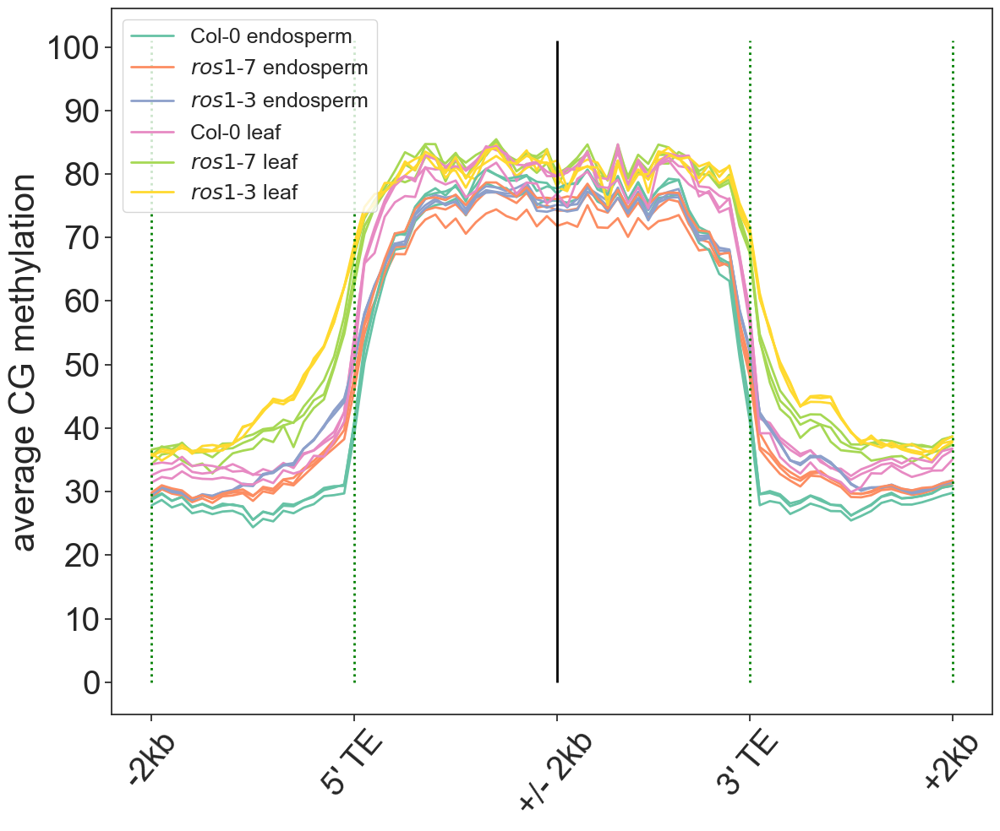

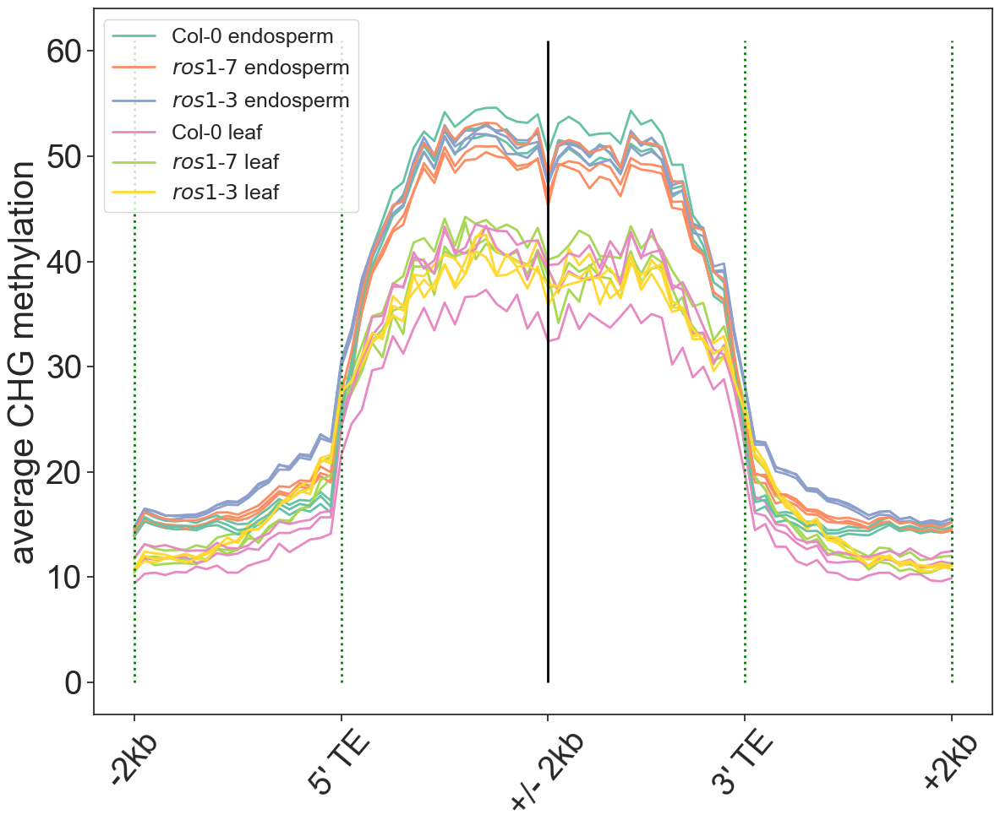

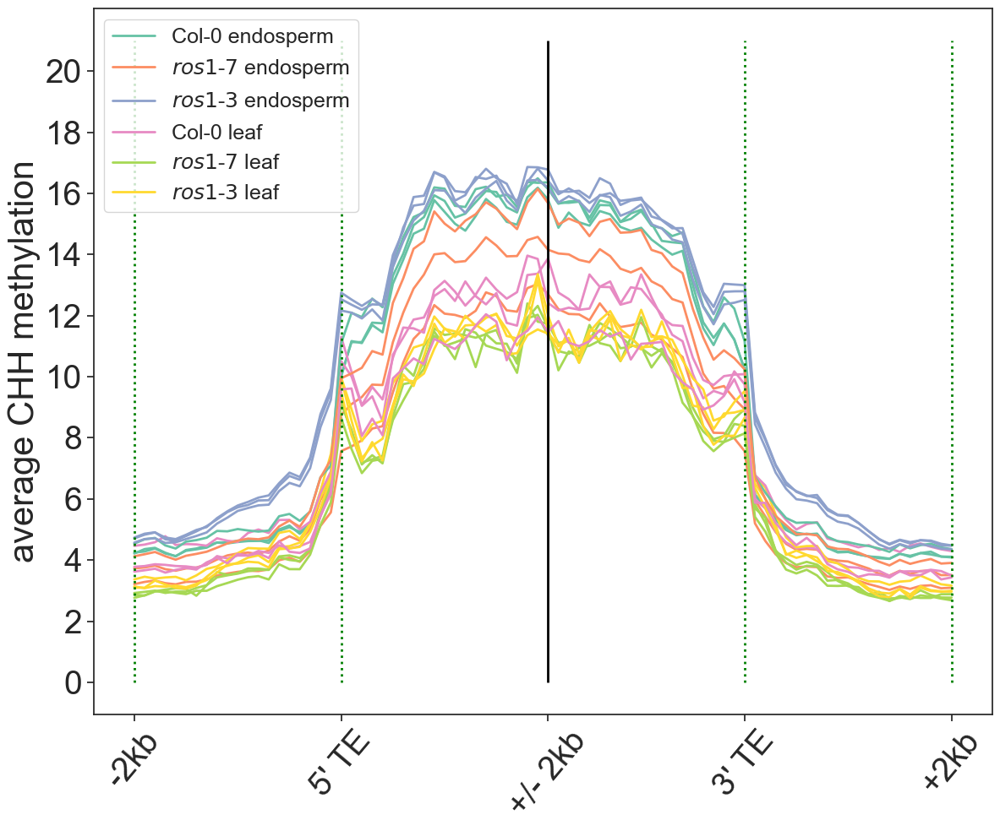

In [264]:
fig,ax=methylends_format(r3_CG_ends, 'bulk', 'r3 TEs', bulklegend, in2000_out2000_100bp_ticks, in2000_out2000_100bp_tick_labels_TE,
                  in2000_out2000_100bp_vlines, in2000_out2000_100bp_vlines_center, 0, 101, 10, context='CG', sRNA=False)
plt.tight_layout()
plt.savefig(figurepath+'r3_TEfrag_mCG_ends_bulk.pdf', dpi=350)

fig,ax=methylends_format(r3_CHG_ends, 'bulk', 'r3 TEs', bulklegend, in2000_out2000_100bp_ticks, in2000_out2000_100bp_tick_labels_TE,
                  in2000_out2000_100bp_vlines, in2000_out2000_100bp_vlines_center, 0, 61, 10, context='CHG', sRNA=False)
plt.tight_layout()
plt.savefig(figurepath+'r3_TEfrag_mCHG_ends_bulk.pdf', dpi=350)

fig,ax=methylends_format(r3_CHH_ends, 'bulk', 'r3 TEs', bulklegend, in2000_out2000_100bp_ticks, in2000_out2000_100bp_tick_labels_TE,
                  in2000_out2000_100bp_vlines, in2000_out2000_100bp_vlines_center, 0, 21, 2, context='CHH', sRNA=False)
plt.tight_layout()
plt.savefig(figurepath+'r3_TEfrag_mCHH_ends_bulk.pdf', dpi=350)

CG
CHG
CHH


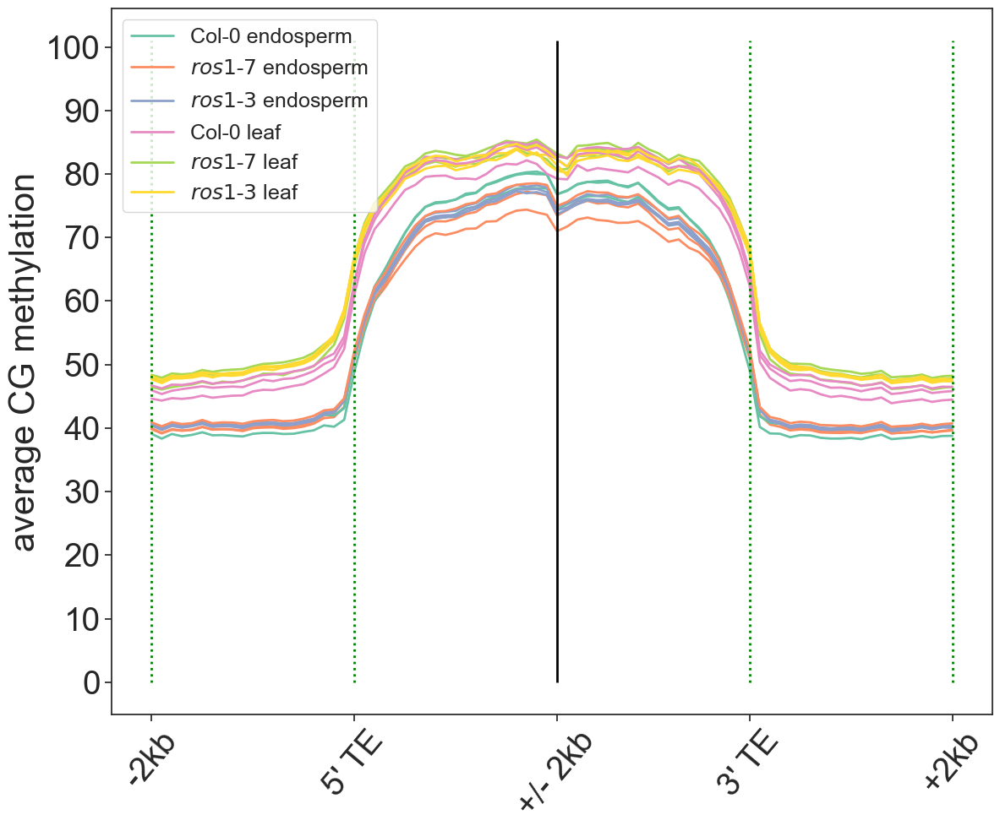

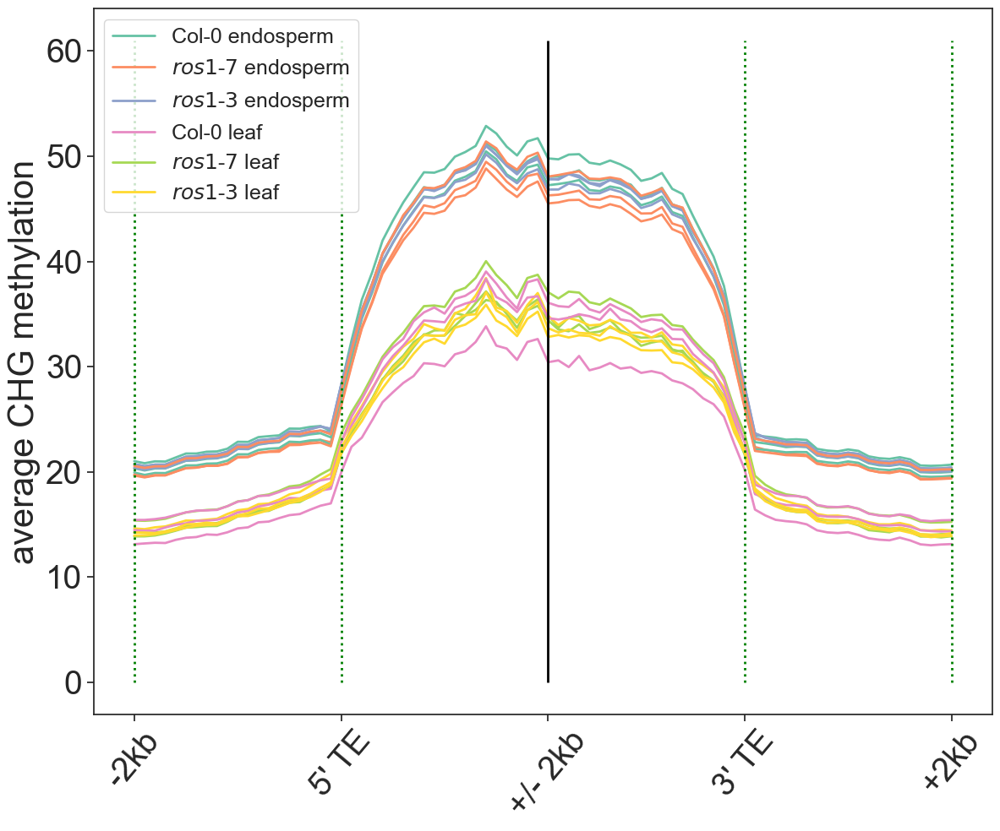

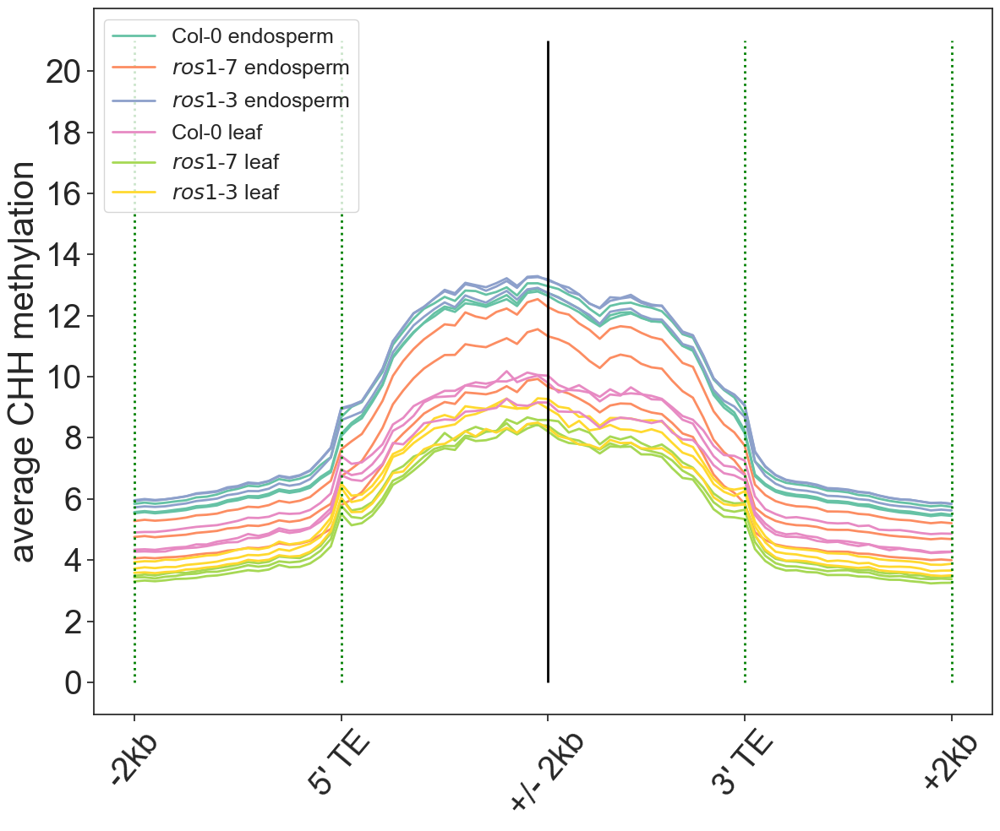

In [271]:
fig,ax=methylends_format(not_r3_CG_ends, 'bulk', 'not_r3 TEs', bulklegend, in2000_out2000_100bp_ticks, in2000_out2000_100bp_tick_labels_TE,
                  in2000_out2000_100bp_vlines, in2000_out2000_100bp_vlines_center, 0, 101, 10, context='CG', sRNA=False)
plt.tight_layout()
plt.savefig(figurepath+'not_r3_TEfrag_mCG_ends_bulk.pdf', dpi=350)

fig,ax=methylends_format(not_r3_CHG_ends, 'bulk', 'not_r3 TEs', bulklegend, in2000_out2000_100bp_ticks, in2000_out2000_100bp_tick_labels_TE,
                  in2000_out2000_100bp_vlines, in2000_out2000_100bp_vlines_center, 0, 61, 10, context='CHG', sRNA=False)
plt.tight_layout()
plt.savefig(figurepath+'not_r3_TEfrag_mCHG_ends_bulk.pdf', dpi=350)

fig,ax=methylends_format(not_r3_CHH_ends, 'bulk', 'not_r3 TEs', bulklegend, in2000_out2000_100bp_ticks, in2000_out2000_100bp_tick_labels_TE,
                  in2000_out2000_100bp_vlines, in2000_out2000_100bp_vlines_center, 0, 21, 2, context='CHH', sRNA=False)
plt.tight_layout()
plt.savefig(figurepath+'not_r3_TEfrag_mCHH_ends_bulk.pdf', dpi=350)

CG
CHG
CHH


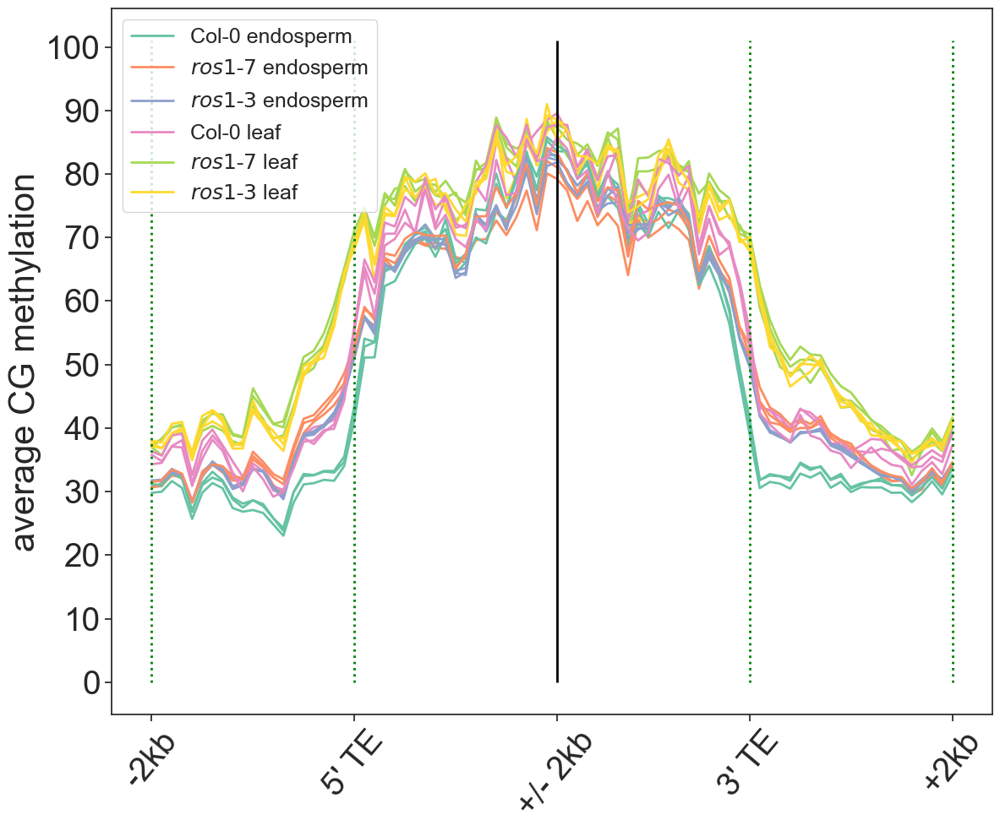

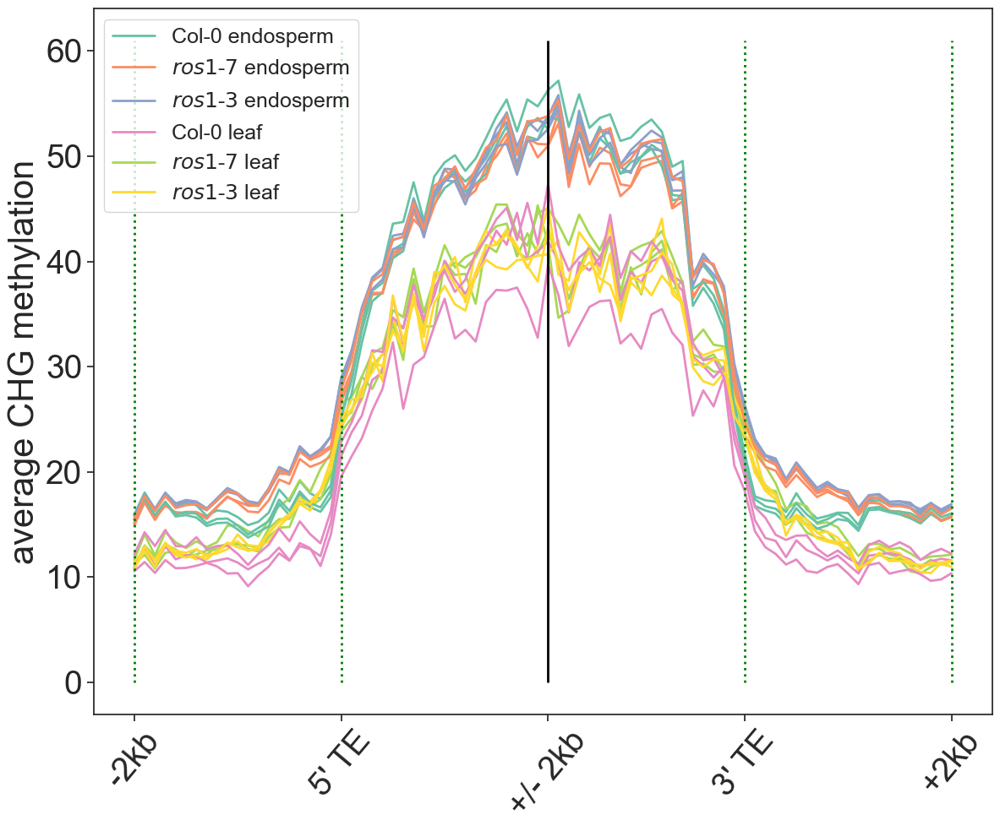

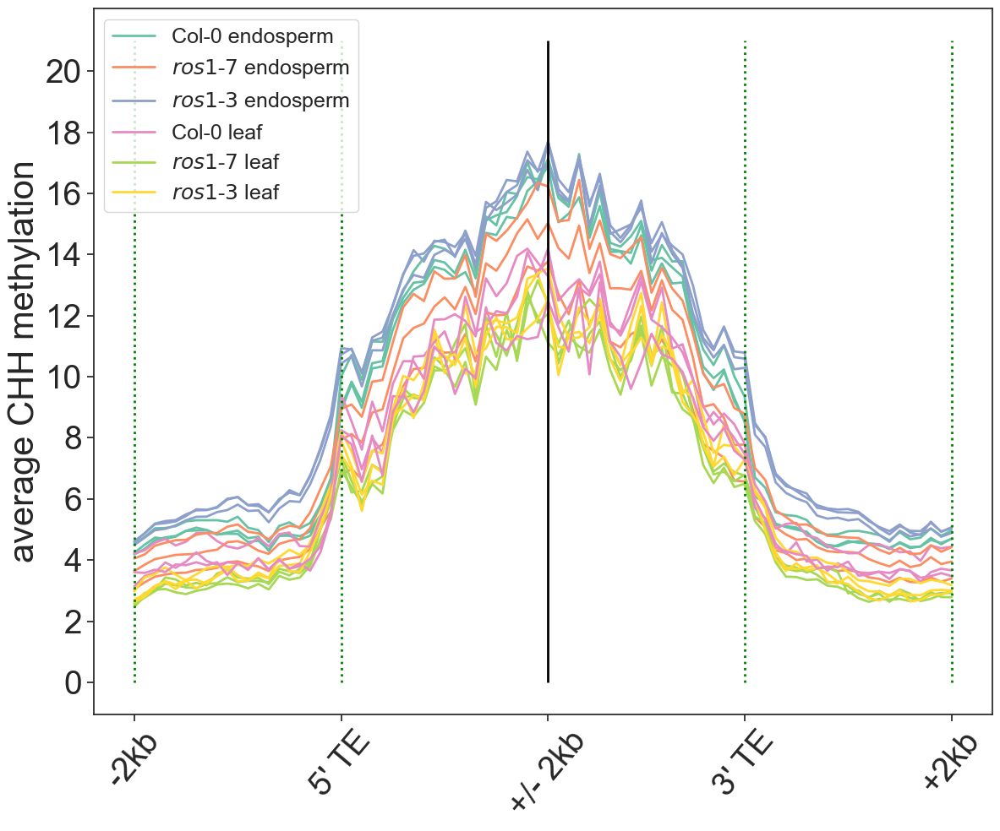

In [266]:
fig,ax=methylends_format(r7_CG_ends, 'bulk', 'r7 TEs', bulklegend, in2000_out2000_100bp_ticks, in2000_out2000_100bp_tick_labels_TE,
                  in2000_out2000_100bp_vlines, in2000_out2000_100bp_vlines_center, 0, 101, 10, context='CG', sRNA=False)
plt.tight_layout()
plt.savefig(figurepath+'r7_TEfrag_mCG_ends_bulk.pdf', dpi=350)

fig,ax=methylends_format(r7_CHG_ends, 'bulk', 'r7 TEs', bulklegend, in2000_out2000_100bp_ticks, in2000_out2000_100bp_tick_labels_TE,
                  in2000_out2000_100bp_vlines, in2000_out2000_100bp_vlines_center, 0, 61, 10, context='CHG', sRNA=False)
plt.tight_layout()
plt.savefig(figurepath+'r7_TEfrag_mCHG_ends_bulk.pdf', dpi=350)

fig,ax=methylends_format(r7_CHH_ends, 'bulk', 'r7 TEs', bulklegend, in2000_out2000_100bp_ticks, in2000_out2000_100bp_tick_labels_TE,
                  in2000_out2000_100bp_vlines, in2000_out2000_100bp_vlines_center, 0, 21, 2, context='CHH', sRNA=False)
plt.tight_layout()
plt.savefig(figurepath+'r7_TEfrag_mCHH_ends_bulk.pdf', dpi=350)

CG
CHG
CHH


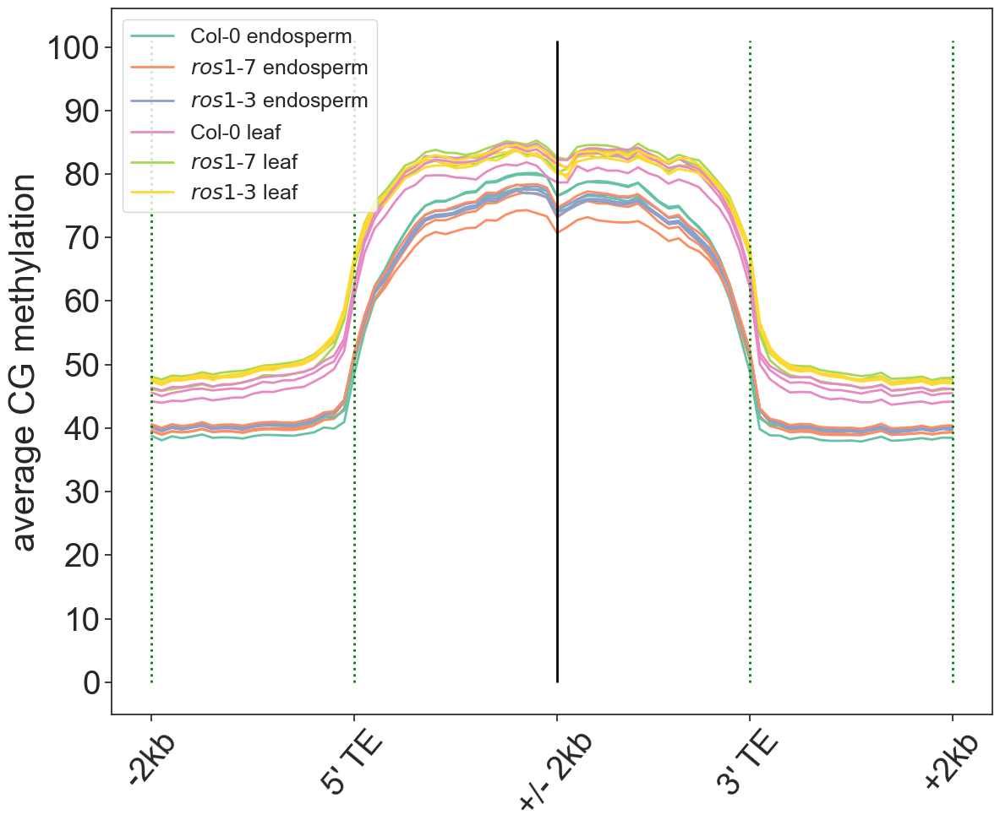

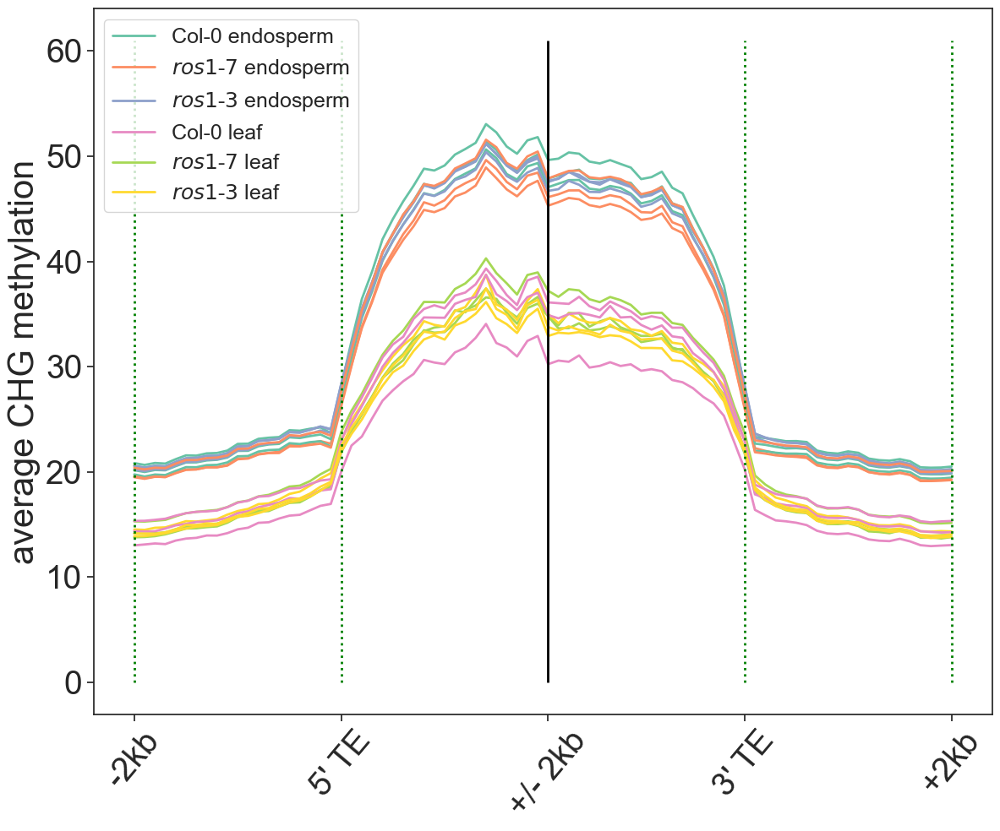

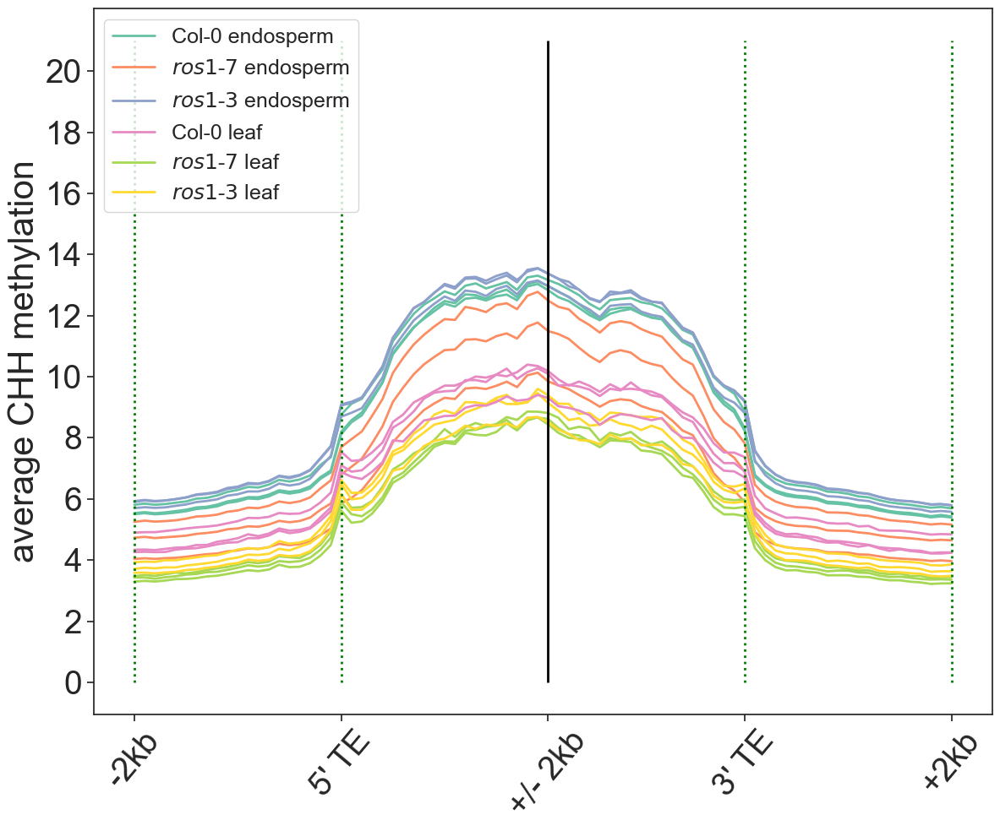

In [272]:
fig,ax=methylends_format(not_r7_CG_ends, 'bulk', 'not_r7 TEs', bulklegend, in2000_out2000_100bp_ticks, in2000_out2000_100bp_tick_labels_TE,
                  in2000_out2000_100bp_vlines, in2000_out2000_100bp_vlines_center, 0, 101, 10, context='CG', sRNA=False)
plt.tight_layout()
plt.savefig(figurepath+'not_r7_TEfrag_mCG_ends_bulk.pdf', dpi=350)

fig,ax=methylends_format(not_r7_CHG_ends, 'bulk', 'not_r7 TEs', bulklegend, in2000_out2000_100bp_ticks, in2000_out2000_100bp_tick_labels_TE,
                  in2000_out2000_100bp_vlines, in2000_out2000_100bp_vlines_center, 0, 61, 10, context='CHG', sRNA=False)
plt.tight_layout()
plt.savefig(figurepath+'not_r7_TEfrag_mCHG_ends_bulk.pdf', dpi=350)

fig,ax=methylends_format(not_r7_CHH_ends, 'bulk', 'not_r7 TEs', bulklegend, in2000_out2000_100bp_ticks, in2000_out2000_100bp_tick_labels_TE,
                  in2000_out2000_100bp_vlines, in2000_out2000_100bp_vlines_center, 0, 21, 2, context='CHH', sRNA=False)
plt.tight_layout()
plt.savefig(figurepath+'not_r7_TEfrag_mCHH_ends_bulk.pdf', dpi=350)

CG


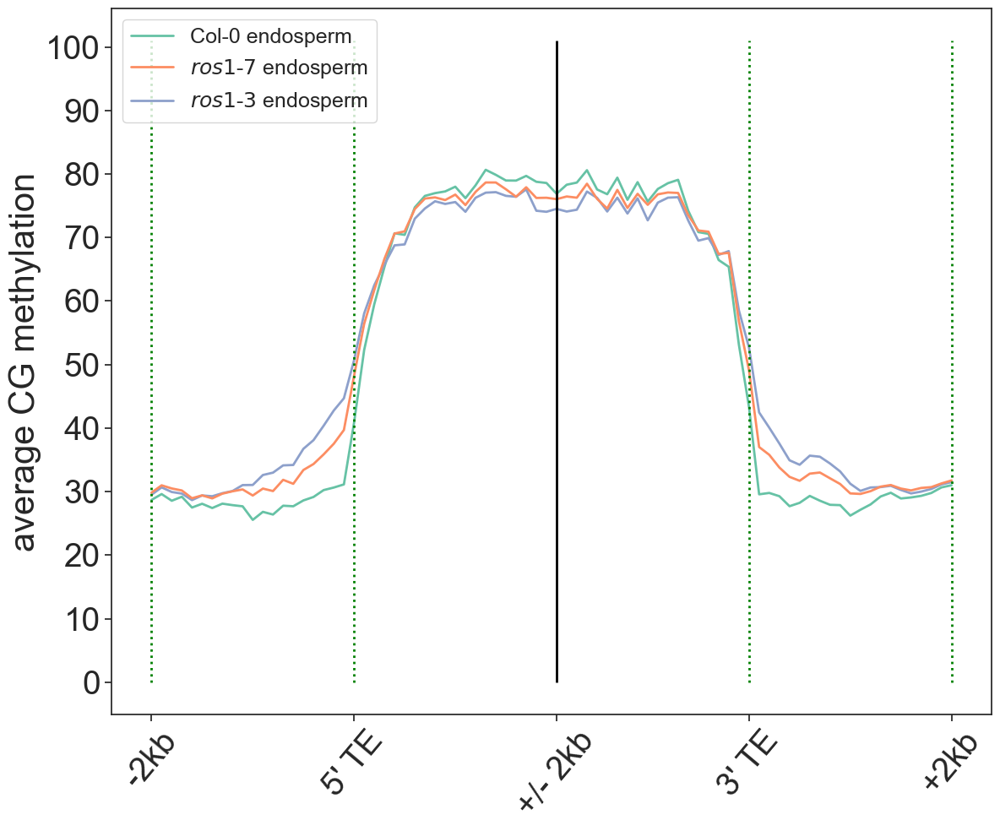

In [269]:
methylends_format(r3_CG_ends, 'endo1rep', 'r3 TEs', endolegend, in2000_out2000_100bp_ticks, in2000_out2000_100bp_tick_labels_TE,
                  in2000_out2000_100bp_vlines, in2000_out2000_100bp_vlines_center, 0, 101, 10, context='CG', sRNA=False)
plt.savefig(figurepath+'r3_TEfrag_mCG_ends_bulkendo1rep.pdf', dpi=350)



CG


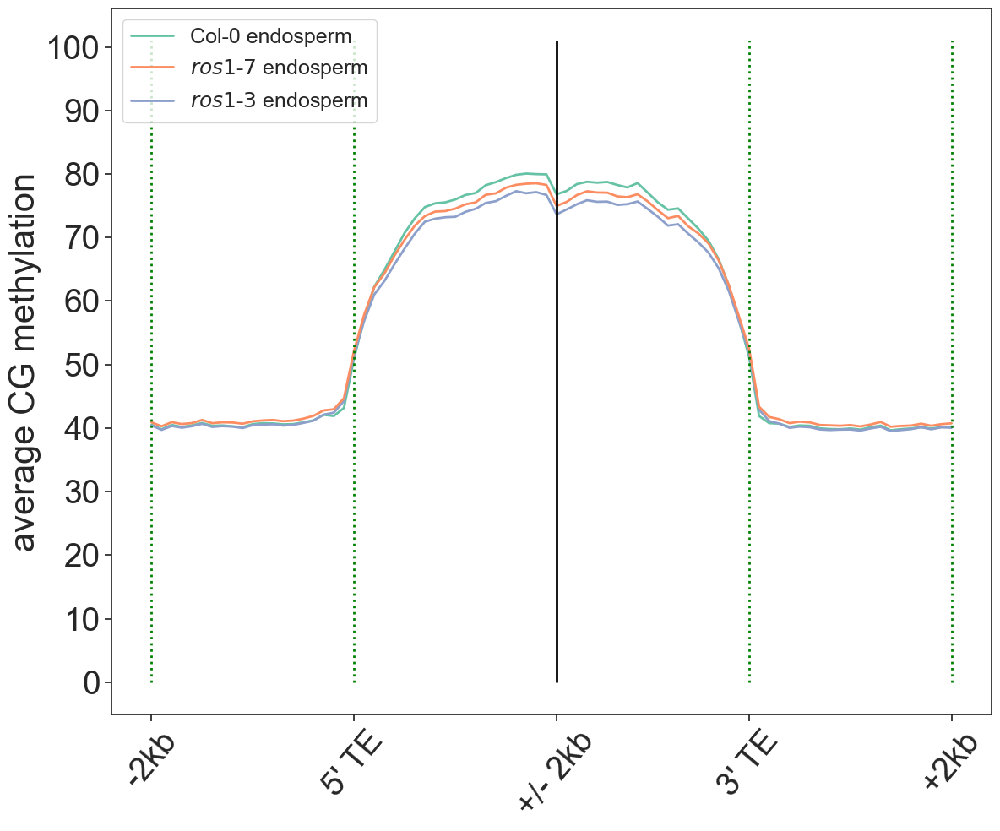

In [270]:
methylends_format(not_r3_CG_ends, 'endo1rep', 'r3 TEs', endolegend, in2000_out2000_100bp_ticks, in2000_out2000_100bp_tick_labels_TE,
                  in2000_out2000_100bp_vlines, in2000_out2000_100bp_vlines_center, 0, 101, 10, context='CG', sRNA=False)
plt.savefig(figurepath+'not_r3_TEfrag_mCG_ends_bulkendo1rep.pdf', dpi=350)



CG


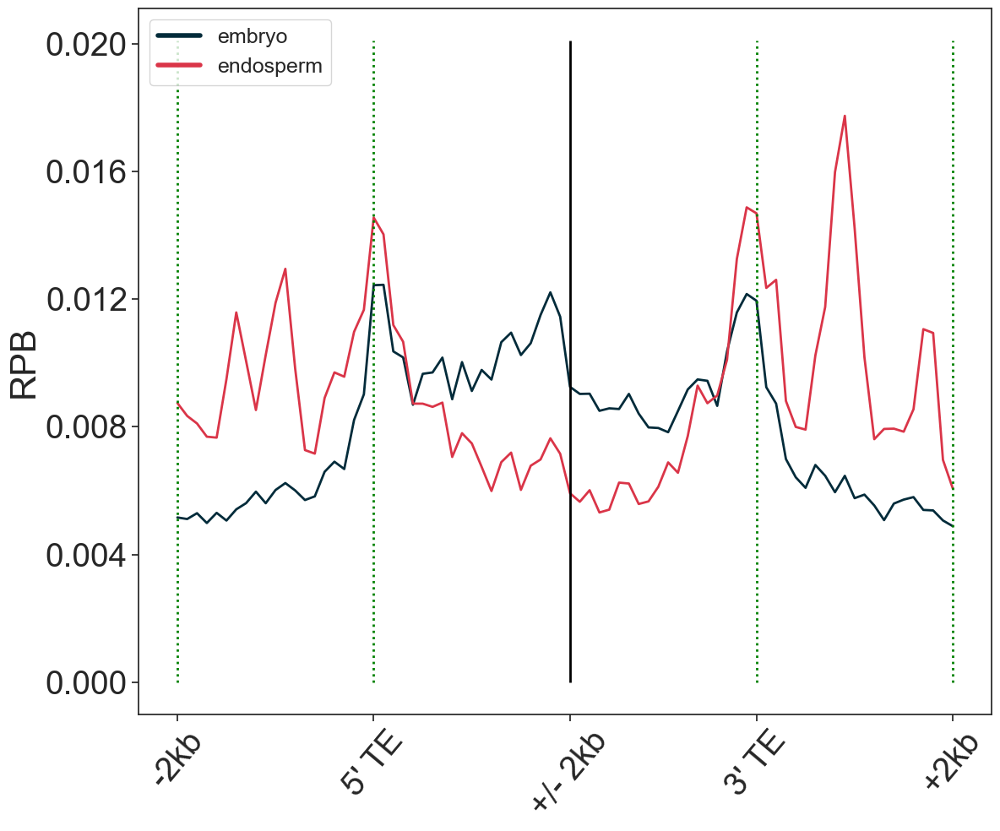

In [285]:
methylends_format(r3_sRNA_ends, 'sRNA', 'r3 TEs', srnalegend, in2000_out2000_100bp_ticks, in2000_out2000_100bp_tick_labels_TE,
                  in2000_out2000_100bp_vlines, in2000_out2000_100bp_vlines_center, 0, .0201, .004, context='CG', sRNA=True)
plt.savefig(figurepath+'r3_TEfrag_sRNA_ends.pdf', dpi=350)


CG


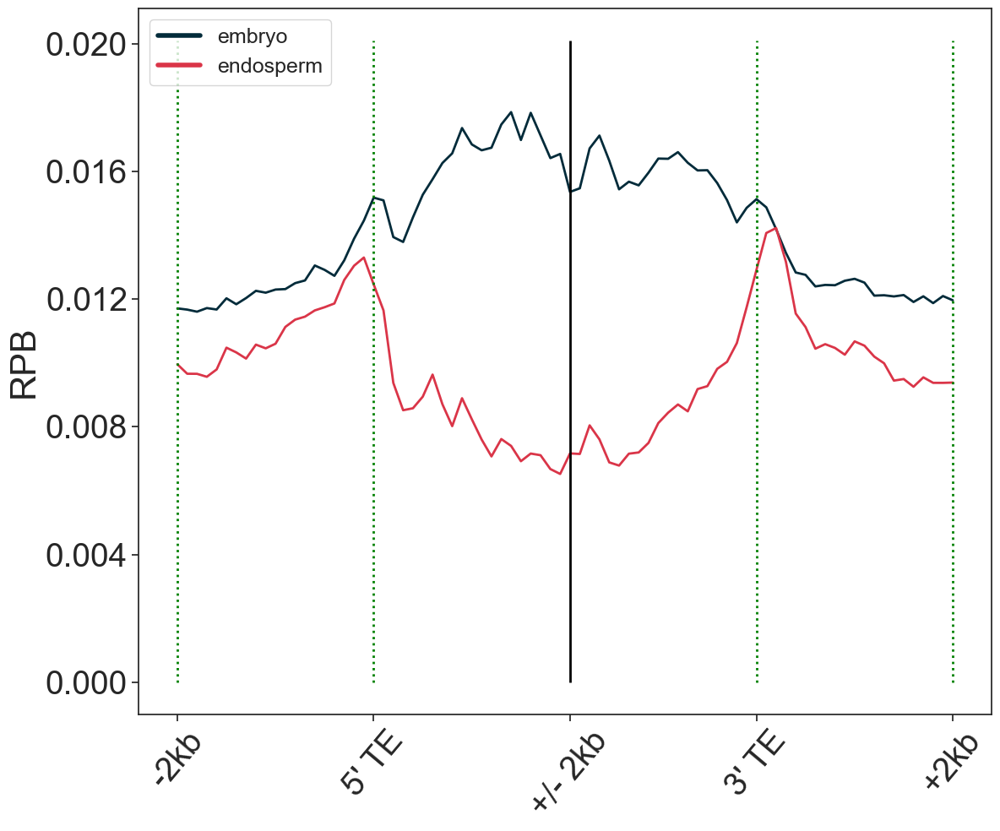

In [286]:
methylends_format(not_r3_sRNA_ends, 'sRNA', 'r3 TEs', srnalegend, in2000_out2000_100bp_ticks, in2000_out2000_100bp_tick_labels_TE,
                  in2000_out2000_100bp_vlines, in2000_out2000_100bp_vlines_center, 0, .0201, .004, context='CG', sRNA=True)
plt.savefig(figurepath+'not_r3_TEfrag_sRNA_ends.pdf', dpi=350)


In [41]:
path="/lab/solexa_gehring/elizabeth/ros1_endo_review_analysis/ends_2/"
dsr=path+"dsr_out/"
figurepath="/lab/solexa_gehring/elizabeth/ros1_endo_review_analysis/python_figures/"

In [287]:
review="/lab/solexa_gehring/elizabeth/ros1_endo_review_analysis/"
dmrends=review+"dmr_ends/"
figurepath=review+"python_figures/"


# DMR ends

In [288]:

r3_CG=read_ends_data(dmrends+'r3_v_wt_allC_hyper_allC_allCreg_CG_average_counts_filt.txt')
r3_CHG=read_ends_data(dmrends+'r3_v_wt_allC_hyper_allC_allCreg_CHG_average_counts_filt.txt')
r3_CHH=read_ends_data(dmrends+'r3_v_wt_allC_hyper_allC_allCreg_CHH_average_counts_filt.txt')

r7_CG=read_ends_data(dmrends+'r7_v_wt_allC_hyper_allC_allCreg_CG_average_counts_filt.txt')
r7_CHG=read_ends_data(dmrends+'r7_v_wt_allC_hyper_allC_allCreg_CHG_average_counts_filt.txt')
r7_CHH=read_ends_data(dmrends+'r7_v_wt_allC_hyper_allC_allCreg_CHH_average_counts_filt.txt')



/tmp/ipykernel_3616052/3617122470.py:9: FutureWarning: The default value of regex will change from True to False in a future version.
  df['sample'] = df['sample'].str.replace('.bed', '')


CG
CHG
CHH


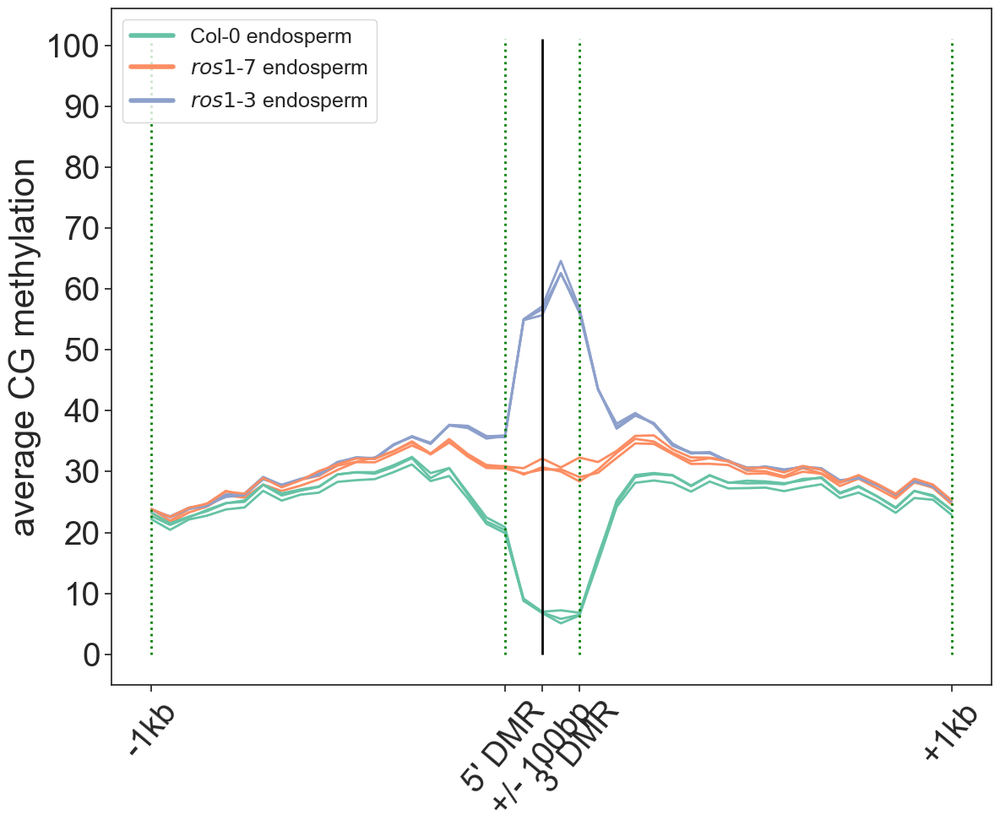

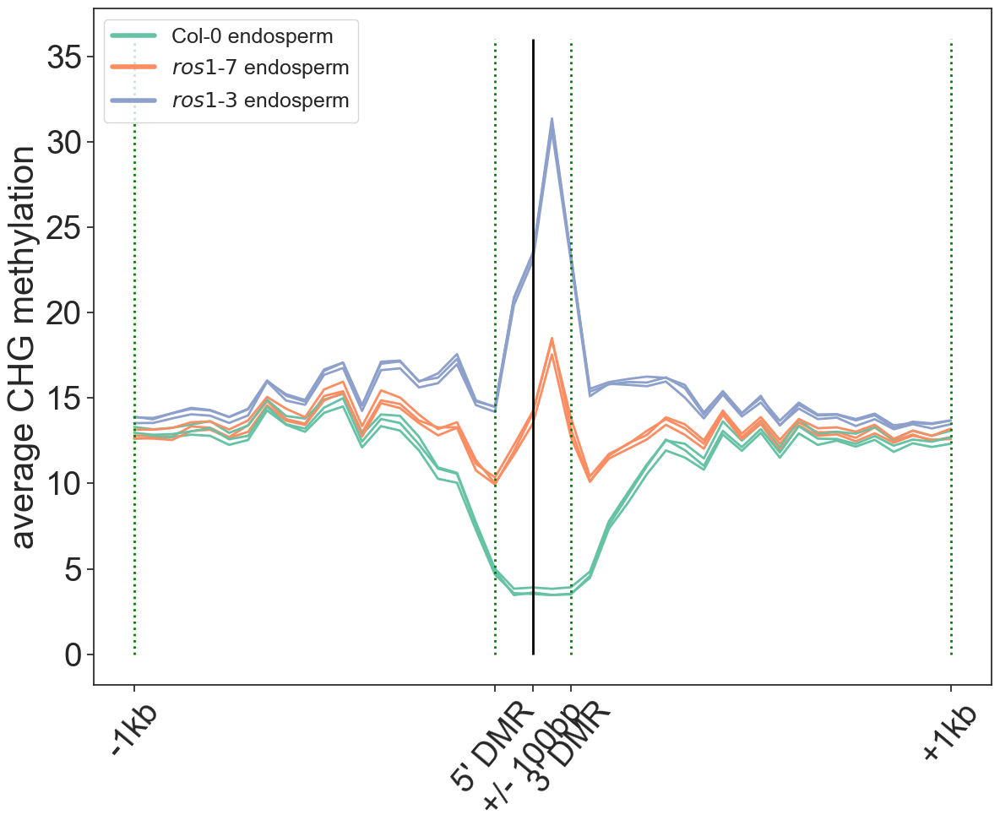

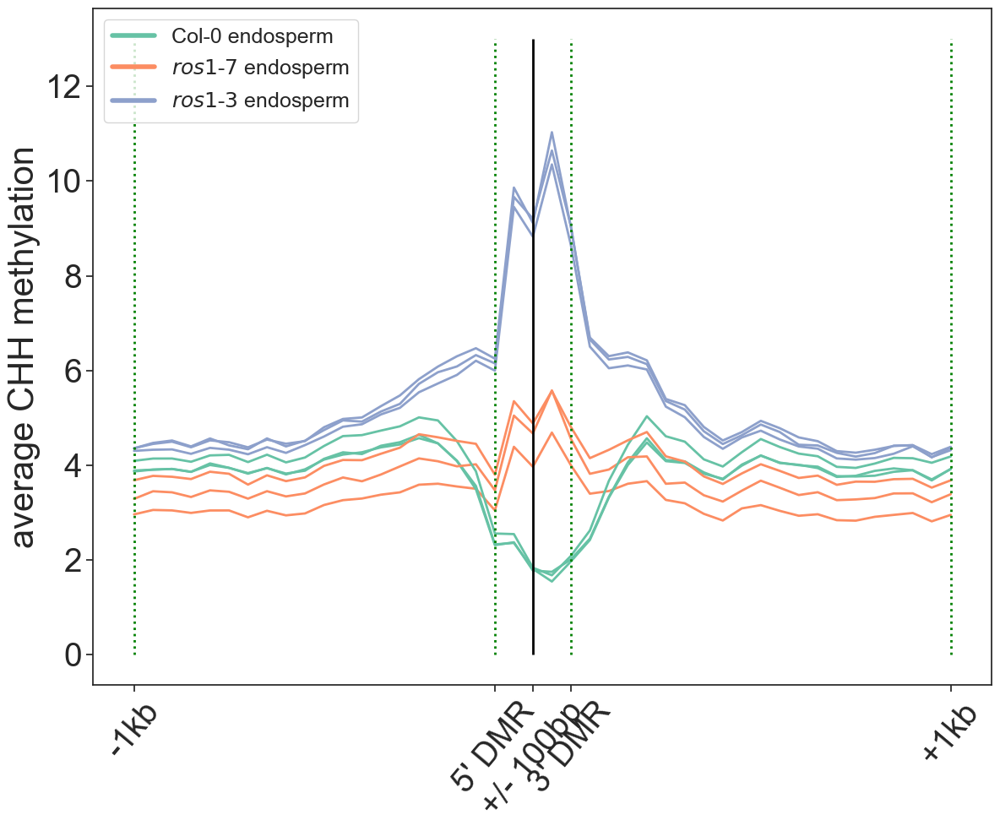

In [307]:
# make the plots
methylends_format(r3_CG, 'endo','', endolegend, in100_out1000_50bp_ticks, in100_out1000_50bp_ticks_DMR_labels,
                  in100_out1000_50bp_vlines, in100_out1000_50bp_vlines_center, 0, 101, 10, context='CG', sRNA=False)
plt.savefig(figurepath+'r3_hyperDMR_CG_ends.pdf', dpi=350)

methylends_format(r3_CHG, 'endo','', endolegend, in100_out1000_50bp_ticks, in100_out1000_50bp_ticks_DMR_labels,
                  in100_out1000_50bp_vlines, in100_out1000_50bp_vlines_center, 0, 36, 5, context='CHG', sRNA=False)
plt.savefig(figurepath+'r3_hyperDMR_CHG_ends.pdf', dpi=350)

methylends_format(r3_CHH, 'endo','', endolegend, in100_out1000_50bp_ticks, in100_out1000_50bp_ticks_DMR_labels,
                  in100_out1000_50bp_vlines, in100_out1000_50bp_vlines_center, 0, 13, 2, context='CHH', sRNA=False)
plt.savefig(figurepath+'r3_hyperDMR_CHH_ends.pdf', dpi=350)


CG
CHG
CHH


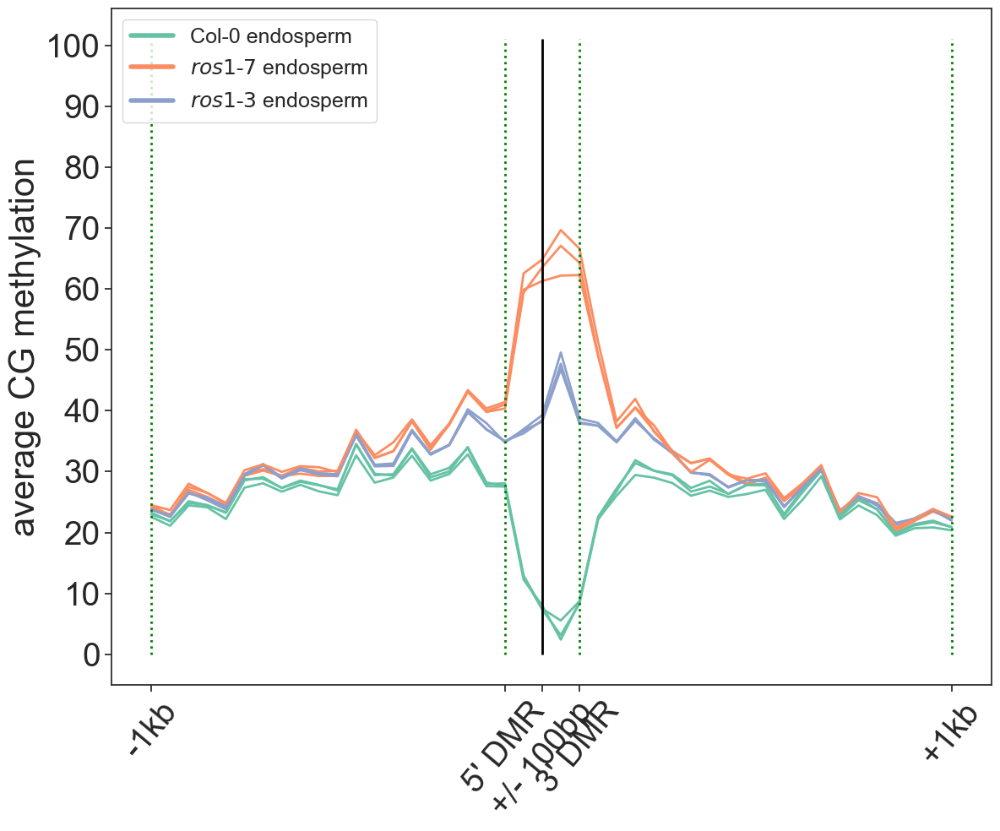

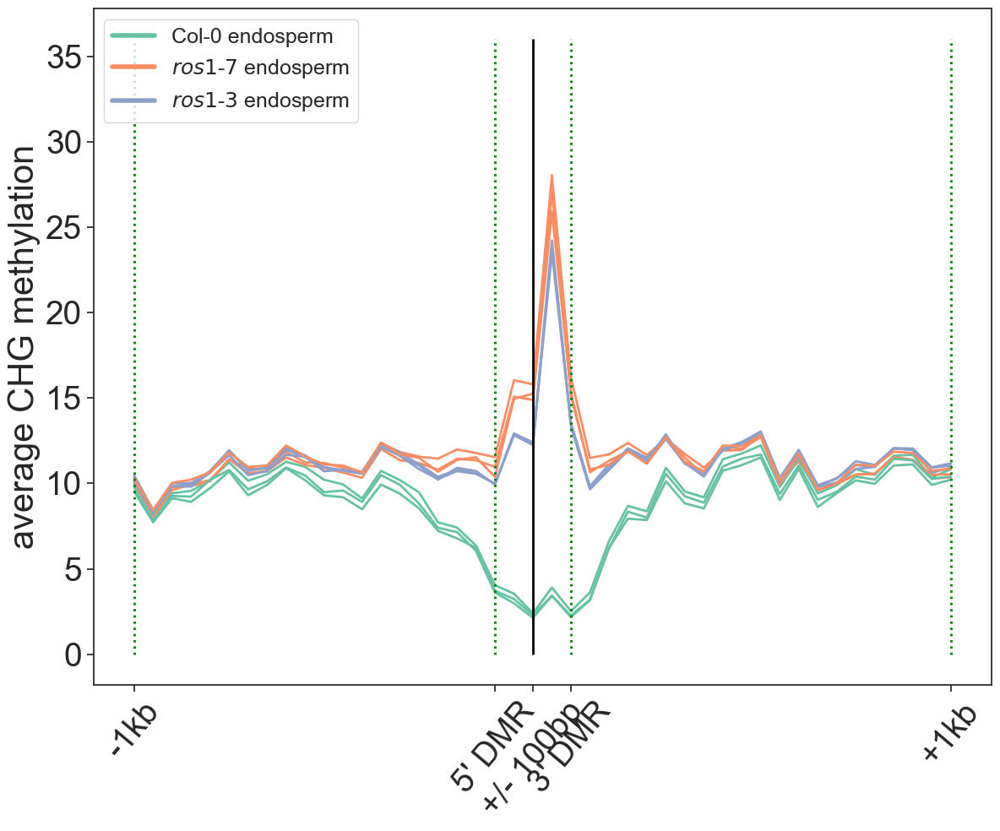

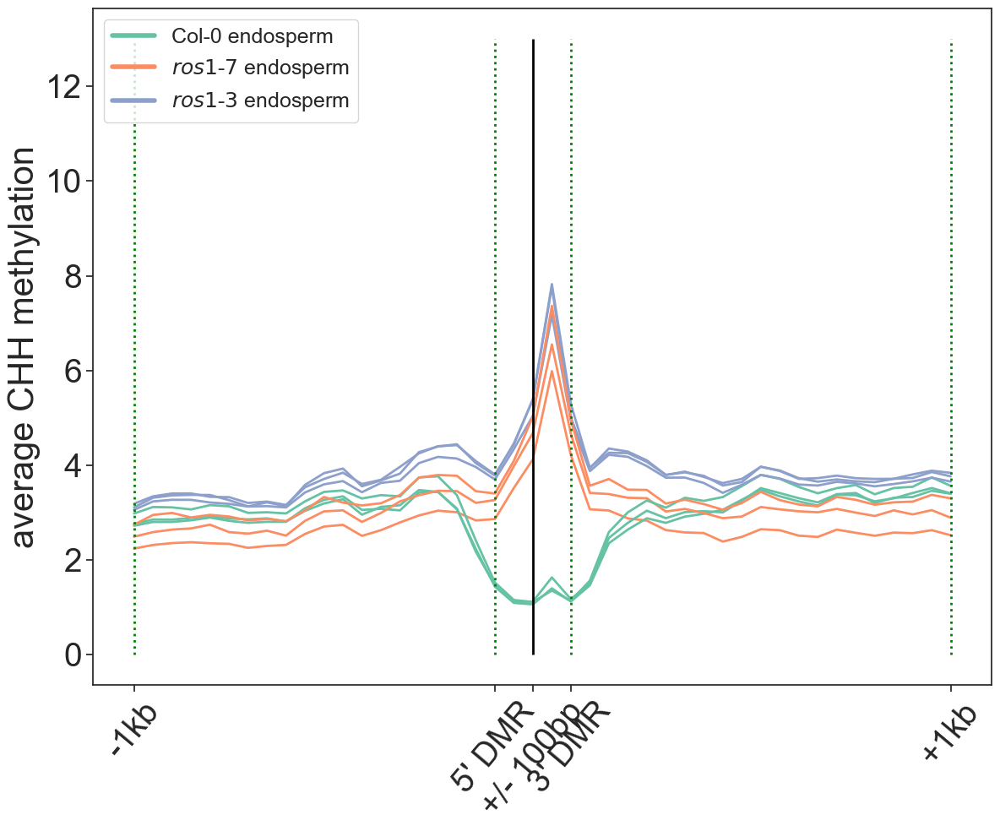

In [308]:
# make the plots
methylends_format(r7_CG, 'endo','', endolegend, in100_out1000_50bp_ticks, in100_out1000_50bp_ticks_DMR_labels,
                  in100_out1000_50bp_vlines, in100_out1000_50bp_vlines_center, 0, 101, 10, context='CG', sRNA=False)
plt.savefig(figurepath+'r7_hyperDMR_CG_ends.pdf', dpi=350)

methylends_format(r7_CHG, 'endo','', endolegend, in100_out1000_50bp_ticks, in100_out1000_50bp_ticks_DMR_labels,
                  in100_out1000_50bp_vlines, in100_out1000_50bp_vlines_center, 0, 36, 5, context='CHG', sRNA=False)
plt.savefig(figurepath+'r7_hyperDMR_CHG_ends.pdf', dpi=350)

methylends_format(r7_CHH, 'endo','', endolegend, in100_out1000_50bp_ticks, in100_out1000_50bp_ticks_DMR_labels,
                  in100_out1000_50bp_vlines, in100_out1000_50bp_vlines_center, 0, 13, 2, context='CHH', sRNA=False)
plt.savefig(figurepath+'r7_hyperDMR_CHH_ends.pdf', dpi=350)


# Sumby ros1 parent of origin data at allelic DMRs

In [436]:
sumpath="/lab/solexa_gehring/elizabeth/ros1_endo_review_analysis/ros1_HETvHMZ_sumby/sumby/"

### functions

In [451]:
def readindata(file):
    sumcolumns=['chr','start','end','name','avg_methy','nC']
    df=pd.read_csv(sumpath+file, header=None, sep=tab, names=sumcolumns)
    df=df.drop(['name'], axis=1)
    return (df)
def makeavgdf(datadf):
    bed=['chr','start','end']
    avgdf = datadf[bed].copy()
    avgdf['C24xr3_pat']=((datadf['C24xr3_1_pat']+datadf['C24xr3_2_pat']+datadf['C24xr3_3_pat'])/3)
    avgdf['r3xC24_pat']=((datadf['r3xC24_1_pat']+datadf['r3xC24_2_pat']+datadf['r3xC24_3_pat'])/3)
    avgdf['r1xr3_pat']=((datadf['r1xr3_1_pat']+datadf['r1xr3_2_pat']+datadf['r1xr3_3_pat'])/3)
    avgdf['ColxC24_pat']=((datadf['ColxC24_1_pat']+datadf['ColxC24_2_pat']+datadf['ColxC24_3_pat'])/3)
    return (avgdf)

poi_columns=['chr','start','end','C24xr3_1_pat','nC_C24xr3_1_pat','C24xr3_2_pat','nC_C24xr3_2_pat','C24xr3_3_pat','nC_C24xr3_3_pat',
             'r3xC24_1_pat','nC_r3xC24_1_pat','r3xC24_2_pat','nC_r3xC24_2_pat','r3xC24_3_pat','nC_r3xC24_3_pat',
             'r3xC24_1_mat','nC_r3xC24_1_mat','r3xC24_2_mat','nC_r3xC24_2_mat','r3xC24_3_mat','nC_r3xC24_3_mat',
             'C24xr3_1_mat','nC_C24xr3_1_mat','C24xr3_2_mat','nC_C24xr3_2_mat','C24xr3_3_mat','nC_C24xr3_2_mat']

In [1139]:
import scipy as sp
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.lines import Line2D

def get_correlation(df, col1, col2):
    r, p = sp.stats.pearsonr(x=df[col1], y=df[col2])
    #tested the spearman test, did not change interpretation of result so continued with pearson.
    #r, p = sp.stats.spearmanr(a=df[col1], b=df[col2])
    return r, p

def scatter_dmrmatpat(df, x, y, xlabel, ylabel, hue='DMR class', xlim=[-0.02,1.02], ylim=[-0.02, 1.02], correlate=False, left_text=True, saveas=False, fit_line=False):
    fig, ax = plt.subplots()
    
    if hue==None:
        sns.scatterplot(data=df, x=x, y=y, ax=ax)
    elif hue is not None:
        sns.scatterplot(data=df, x=x, y=y, hue=hue, ax=ax, legend=False)
        #sns.move_legend(ax, 'lower right')
        if hue=="_lefton_TE":
            legend_elements = [Line2D([0], [0], marker='o', color='w', label='Scatter', markerfacecolor='b', markersize=7),
                               Line2D([0], [0], marker='o', color='w', label='Scatter', markerfacecolor='g', markersize=7)]
            ax.legend(handles=legend_elements, labels=['no gene within 1kb','gene within 1kb or intersecting'])
        if hue=="_lefton_gene":
            legend_elements = [Line2D([0], [0], marker='o', color='w', label='Scatter', markerfacecolor='b', markersize=7),
                               Line2D([0], [0], marker='o', color='w', label='Scatter', markerfacecolor='g', markersize=7)]
            ax.legend(handles=legend_elements, labels=['no TE within 1kb','TE within 1kb or intersecting'])
    
    # Optionally add a line of best fit (linear regression)
    if fit_line:
        sns.regplot(data=df, x=x, y=y, ax=ax, scatter=False, color='r', line_kws={'linewidth': 2})  # 'r' is the color red

    if correlate:
        r, p = get_correlation(df, x, y)
        
        if left_text:
            plt.text(.05, .8, "Pearson's r ={:.2f}".format(r), transform=ax.transAxes)
            plt.text(.05, .75, "p value ={:.4f}".format(p), transform=ax.transAxes)
            plt.text(.05, .7, "n="+str(len(df)), transform=ax.transAxes)
        else:
            plt.text(.65, .4, "Pearson's r ={:.2f}".format(r), transform=ax.transAxes)
            plt.text(.65, .35, "p value ={:.4f}".format(p), transform=ax.transAxes)
            plt.text(.65, .3, "n="+str(len(df)), transform=ax.transAxes)

    ax.set_xlim(xlim)
    ax.set_ylim(ylim)
    ax.set_xlabel(xlabel, fontsize=12)
    ax.set_ylabel(ylabel, fontsize=12)
    ax.tick_params(labelsize=10)
    ax.set_aspect('equal', adjustable='box')

    print('r value ='+ str(r))
    print('p value ='+ str(p))

    if saveas:
        print('plot saved')
        return fig, ax
        # fig.savefig(saveas, dpi=350)
    else:
        print('plot not saved')
        return fig, ax
        plt.show()


### read in data

In [439]:
r3_pat_1_CG_sumby_ros1ant=readindata("C24xr3_1_Col_spiked_CG_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")
r3_pat_1_CHG_sumby_ros1ant=readindata("C24xr3_1_Col_spiked_CHG_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")
r3_pat_1_CHH_sumby_ros1ant=readindata("C24xr3_1_Col_spiked_CHH_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")

C24_mat_1_CG_sumby_ros1ant=readindata("C24xr3_1_C24_pseudo_CG_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")
C24_mat_1_CHG_sumby_ros1ant=readindata("C24xr3_1_C24_pseudo_CHG_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")
C24_mat_1_CHH_sumby_ros1ant=readindata("C24xr3_1_C24_pseudo_CHH_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")

r3_pat_2_CG_sumby_ros1ant=readindata("C24xr3_2_Col_spiked_CG_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")
r3_pat_2_CHG_sumby_ros1ant=readindata("C24xr3_2_Col_spiked_CHG_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")
r3_pat_2_CHH_sumby_ros1ant=readindata("C24xr3_2_Col_spiked_CHH_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")

C24_mat_2_CG_sumby_ros1ant=readindata("C24xr3_2_C24_pseudo_CG_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")
C24_mat_2_CHG_sumby_ros1ant=readindata("C24xr3_2_C24_pseudo_CHG_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")
C24_mat_2_CHH_sumby_ros1ant=readindata("C24xr3_2_C24_pseudo_CHH_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")

r3_pat_3_CG_sumby_ros1ant=readindata("C24xr3_3_Col_spiked_CG_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")
r3_pat_3_CHG_sumby_ros1ant=readindata("C24xr3_3_Col_spiked_CHG_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")
r3_pat_3_CHH_sumby_ros1ant=readindata("C24xr3_3_Col_spiked_CHH_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")

C24_mat_3_CG_sumby_ros1ant=readindata("C24xr3_3_C24_pseudo_CG_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")
C24_mat_3_CHG_sumby_ros1ant=readindata("C24xr3_3_C24_pseudo_CHG_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")
C24_mat_3_CHH_sumby_ros1ant=readindata("C24xr3_3_C24_pseudo_CHH_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")


r3_mat_1_CG_sumby_ros1ant=readindata("r3xC24_1_Col_spiked_CG_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")
r3_mat_1_CHG_sumby_ros1ant=readindata("r3xC24_1_Col_spiked_CHG_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")
r3_mat_1_CHH_sumby_ros1ant=readindata("r3xC24_1_Col_spiked_CHH_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")

C24_pat_1_CG_sumby_ros1ant=readindata("r3xC24_1_C24_pseudo_CG_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")
C24_pat_1_CHG_sumby_ros1ant=readindata("r3xC24_1_C24_pseudo_CHG_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")
C24_pat_1_CHH_sumby_ros1ant=readindata("r3xC24_1_C24_pseudo_CHH_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")

r3_mat_2_CG_sumby_ros1ant=readindata("r3xC24_2_Col_spiked_CG_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")
r3_mat_2_CHG_sumby_ros1ant=readindata("r3xC24_2_Col_spiked_CHG_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")
r3_mat_2_CHH_sumby_ros1ant=readindata("r3xC24_2_Col_spiked_CHH_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")

C24_pat_2_CG_sumby_ros1ant=readindata("r3xC24_2_C24_pseudo_CG_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")
C24_pat_2_CHG_sumby_ros1ant=readindata("r3xC24_2_C24_pseudo_CHG_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")
C24_pat_2_CHH_sumby_ros1ant=readindata("r3xC24_2_C24_pseudo_CHH_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")

r3_mat_3_CG_sumby_ros1ant=readindata("r3xC24_3_Col_spiked_CG_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")
r3_mat_3_CHG_sumby_ros1ant=readindata("r3xC24_3_Col_spiked_CHG_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")
r3_mat_3_CHH_sumby_ros1ant=readindata("r3xC24_3_Col_spiked_CHH_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")

C24_pat_3_CG_sumby_ros1ant=readindata("r3xC24_3_C24_pseudo_CG_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")
C24_pat_3_CHG_sumby_ros1ant=readindata("r3xC24_3_C24_pseudo_CHG_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")
C24_pat_3_CHH_sumby_ros1ant=readindata("r3xC24_3_C24_pseudo_CHH_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")

r3_pat_1_CG_sumby_dmedom=readindata("C24xr3_1_Col_spiked_CG_sumby_WT_and_ros1_matVpat_hypo_allC.bed")
r3_pat_1_CHG_sumby_dmedom=readindata("C24xr3_1_Col_spiked_CHG_sumby_WT_and_ros1_matVpat_hypo_allC.bed")
r3_pat_1_CHH_sumby_dmedom=readindata("C24xr3_1_Col_spiked_CHH_sumby_WT_and_ros1_matVpat_hypo_allC.bed")

C24_mat_1_CG_sumby_dmedom=readindata("C24xr3_1_C24_pseudo_CG_sumby_WT_and_ros1_matVpat_hypo_allC.bed")
C24_mat_1_CHG_sumby_dmedom=readindata("C24xr3_1_C24_pseudo_CHG_sumby_WT_and_ros1_matVpat_hypo_allC.bed")
C24_mat_1_CHH_sumby_dmedom=readindata("C24xr3_1_C24_pseudo_CHH_sumby_WT_and_ros1_matVpat_hypo_allC.bed")

r3_pat_2_CG_sumby_dmedom=readindata("C24xr3_2_Col_spiked_CG_sumby_WT_and_ros1_matVpat_hypo_allC.bed")
r3_pat_2_CHG_sumby_dmedom=readindata("C24xr3_2_Col_spiked_CHG_sumby_WT_and_ros1_matVpat_hypo_allC.bed")
r3_pat_2_CHH_sumby_dmedom=readindata("C24xr3_2_Col_spiked_CHH_sumby_WT_and_ros1_matVpat_hypo_allC.bed")

C24_mat_2_CG_sumby_dmedom=readindata("C24xr3_2_C24_pseudo_CG_sumby_WT_and_ros1_matVpat_hypo_allC.bed")
C24_mat_2_CHG_sumby_dmedom=readindata("C24xr3_2_C24_pseudo_CHG_sumby_WT_and_ros1_matVpat_hypo_allC.bed")
C24_mat_2_CHH_sumby_dmedom=readindata("C24xr3_2_C24_pseudo_CHH_sumby_WT_and_ros1_matVpat_hypo_allC.bed")

r3_pat_3_CG_sumby_dmedom=readindata("C24xr3_3_Col_spiked_CG_sumby_WT_and_ros1_matVpat_hypo_allC.bed")
r3_pat_3_CHG_sumby_dmedom=readindata("C24xr3_3_Col_spiked_CHG_sumby_WT_and_ros1_matVpat_hypo_allC.bed")
r3_pat_3_CHH_sumby_dmedom=readindata("C24xr3_3_Col_spiked_CHH_sumby_WT_and_ros1_matVpat_hypo_allC.bed")

C24_mat_3_CG_sumby_dmedom=readindata("C24xr3_3_C24_pseudo_CG_sumby_WT_and_ros1_matVpat_hypo_allC.bed")
C24_mat_3_CHG_sumby_dmedom=readindata("C24xr3_3_C24_pseudo_CHG_sumby_WT_and_ros1_matVpat_hypo_allC.bed")
C24_mat_3_CHH_sumby_dmedom=readindata("C24xr3_3_C24_pseudo_CHH_sumby_WT_and_ros1_matVpat_hypo_allC.bed")

r3_mat_1_CG_sumby_dmedom=readindata("r3xC24_1_Col_spiked_CG_sumby_WT_and_ros1_matVpat_hypo_allC.bed")
r3_mat_1_CHG_sumby_dmedom=readindata("r3xC24_1_Col_spiked_CHG_sumby_WT_and_ros1_matVpat_hypo_allC.bed")
r3_mat_1_CHH_sumby_dmedom=readindata("r3xC24_1_Col_spiked_CHH_sumby_WT_and_ros1_matVpat_hypo_allC.bed")

C24_pat_1_CG_sumby_dmedom=readindata("r3xC24_1_C24_pseudo_CG_sumby_WT_and_ros1_matVpat_hypo_allC.bed")
C24_pat_1_CHG_sumby_dmedom=readindata("r3xC24_1_C24_pseudo_CHG_sumby_WT_and_ros1_matVpat_hypo_allC.bed")
C24_pat_1_CHH_sumby_dmedom=readindata("r3xC24_1_C24_pseudo_CHH_sumby_WT_and_ros1_matVpat_hypo_allC.bed")

r3_mat_2_CG_sumby_dmedom=readindata("r3xC24_2_Col_spiked_CG_sumby_WT_and_ros1_matVpat_hypo_allC.bed")
r3_mat_2_CHG_sumby_dmedom=readindata("r3xC24_2_Col_spiked_CHG_sumby_WT_and_ros1_matVpat_hypo_allC.bed")
r3_mat_2_CHH_sumby_dmedom=readindata("r3xC24_2_Col_spiked_CHH_sumby_WT_and_ros1_matVpat_hypo_allC.bed")

C24_pat_2_CG_sumby_dmedom=readindata("r3xC24_2_C24_pseudo_CG_sumby_WT_and_ros1_matVpat_hypo_allC.bed")
C24_pat_2_CHG_sumby_dmedom=readindata("r3xC24_2_C24_pseudo_CHG_sumby_WT_and_ros1_matVpat_hypo_allC.bed")
C24_pat_2_CHH_sumby_dmedom=readindata("r3xC24_2_C24_pseudo_CHH_sumby_WT_and_ros1_matVpat_hypo_allC.bed")

r3_mat_3_CG_sumby_dmedom=readindata("r3xC24_3_Col_spiked_CG_sumby_WT_and_ros1_matVpat_hypo_allC.bed")
r3_mat_3_CHG_sumby_dmedom=readindata("r3xC24_3_Col_spiked_CHG_sumby_WT_and_ros1_matVpat_hypo_allC.bed")
r3_mat_3_CHH_sumby_dmedom=readindata("r3xC24_3_Col_spiked_CHH_sumby_WT_and_ros1_matVpat_hypo_allC.bed")

C24_pat_3_CG_sumby_dmedom=readindata("r3xC24_3_C24_pseudo_CG_sumby_WT_and_ros1_matVpat_hypo_allC.bed")
C24_pat_3_CHG_sumby_dmedom=readindata("r3xC24_3_C24_pseudo_CHG_sumby_WT_and_ros1_matVpat_hypo_allC.bed")
C24_pat_3_CHH_sumby_dmedom=readindata("r3xC24_3_C24_pseudo_CHH_sumby_WT_and_ros1_matVpat_hypo_allC.bed")


### make averaged dfs from 1parent data

In [440]:
def makedatadf_het(r3_pat1,r3_pat2,r3_pat3,C24_pat1,C24_pat2,C24_pat3,r3_mat1,r3_mat2,r3_mat3,C24_mat1,C24_mat2,C24_mat3):
    out=pd.DataFrame()
    
    r3pat=r3_pat1.merge(r3_pat2, on=['chr','start','end'], how="outer", suffixes=["_1", "_2"]).merge(r3_pat3, how="outer")
    C24pat=C24_pat1.merge(C24_pat2, on=['chr','start','end'], how="outer", suffixes=["_1", "_2"]).merge(C24_pat3, how="outer")
    r3mat=r3_mat1.merge(r3_mat2, on=['chr','start','end'], how="outer", suffixes=["_1", "_2"]).merge(r3_mat3, how="outer")
    C24mat=C24_mat1.merge(C24_mat2, on=['chr','start','end'], how="outer", suffixes=["_1", "_2"]).merge(C24_mat3, how="outer")


    out['chr']=r3pat['chr']
    out['start']=r3pat['start']
    out['end']=r3pat['end']
    out['avg_methy_r3pat_1']=r3pat['avg_methy_1']
    out['nC_r3pat_1']=r3pat['nC_1']
    out['avg_methy_r3pat_2']=r3pat['avg_methy_2']
    out['nC_r3pat_2']=r3pat['nC_2']
    out['avg_methy_r3pat_3']=r3pat['avg_methy']
    out['nC_r3pat_3']=r3pat['nC']
    
    out=out.merge(C24pat, on=['chr','start','end'], how="outer")
    out=out.rename(columns={"avg_methy": "avg_methy_C24pat_3", "nC": "nC_C24pat_3"})

    out=out.merge(r3mat, on=['chr','start','end'], how="outer")
    out=out.rename(columns={"avg_methy": "avg_methy_r3mat_3", "nC": "nC_r3mat_3"})

    out=out.merge(C24mat, on=['chr','start','end'], how="outer")
    out=out.rename(columns={"avg_methy": "avg_methy_C24mat_3", "nC": "nC_C24mat_3"})

    dropNA_data=out.dropna()
    return(dropNA_data)
    #return(out)
    
    
    

In [441]:
r3ant_POI_mCG_het=makedatadf_het(r3_pat_1_CG_sumby_ros1ant, r3_pat_2_CG_sumby_ros1ant, r3_pat_3_CG_sumby_ros1ant, 
                          C24_pat_1_CG_sumby_ros1ant, C24_pat_2_CG_sumby_ros1ant, C24_pat_3_CG_sumby_ros1ant,
                          r3_mat_1_CG_sumby_ros1ant, r3_mat_2_CG_sumby_ros1ant, r3_mat_3_CG_sumby_ros1ant, 
                          C24_mat_1_CG_sumby_ros1ant, C24_mat_2_CG_sumby_ros1ant, C24_mat_3_CG_sumby_ros1ant).set_axis(poi_columns, axis='columns')

In [1281]:
r3ant_POI_mCG_het

,chr,start,end,C24xr3_1_pat,nC_C24xr3_1_pat,C24xr3_2_pat,nC_C24xr3_2_pat,C24xr3_3_pat,nC_C24xr3_3_pat,r3xC24_1_pat,...,r3xC24_2_mat,nC_r3xC24_2_mat,r3xC24_3_mat,nC_r3xC24_3_mat,C24xr3_1_mat,nC_C24xr3_1_mat,C24xr3_2_mat,nC_C24xr3_2_mat,C24xr3_3_mat,nC_C24xr3_2_mat
0,Chr1,239072,239350,0.886857,22,0.868263,22,0.882892,22,0.875491,...,0.549907,22,0.636415,22,0.188534,22,0.338434,22,0.331029,22
1,Chr1,3413028,3413664,0.780735,24,0.749231,24,0.756579,24,0.175258,...,0.457672,24,0.195438,24,0.079470,21,0.061990,20,0.064838,20
2,Chr1,3550806,3551360,0.608696,19,0.744027,15,0.664103,19,0.027972,...,0.362624,21,0.132832,21,0.019900,13,0.007752,10,0.000000,14
3,Chr1,3925596,3925833,0.781818,13,0.763713,13,0.824773,13,0.779783,...,0.390048,13,0.262700,13,0.095819,13,0.145610,13,0.099804,13
4,Chr1,4787227,4787387,0.866379,11,0.796537,11,0.900485,11,0.151862,...,0.378766,11,0.237226,11,0.042818,11,0.056634,11,0.035503,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
269,Chr5,20129826,20130144,0.901437,17,0.879880,17,0.907441,17,0.033333,...,0.386782,17,0.142979,17,0.001299,17,0.035120,17,0.020734,17
270,Chr5,22706041,22706148,0.740506,5,0.714286,5,0.823129,5,0.500000,...,0.355685,5,0.197889,5,0.063830,5,0.101942,5,0.135952,5
271,Chr5,24723505,24723658,0.793103,12,0.827273,9,0.868020,14,0.844749,...,0.369048,16,0.368286,15,0.178645,18,0.274809,11,0.256180,17
272,Chr5,25440558,25440648,0.626536,9,0.532663,9,0.718310,9,0.629091,...,0.366038,9,0.210896,9,0.082956,9,0.121101,9,0.125997,9


### pull back in data from 2 parent ros1

In [905]:
sumpath="/lab/solexa_gehring/elizabeth/ros1_endo_review_analysis/ros1_HETvHMZ_sumby/sumby_2/"
r3_pat_1_CG_sumby_ros1ant=readindata("r1xr3_1_Col_spiked_CG_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")
r3_pat_1_CHG_sumby_ros1ant=readindata("r1xr3_1_Col_spiked_CHG_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")
r3_pat_1_CHH_sumby_ros1ant=readindata("r1xr3_1_Col_spiked_CHH_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")

r3_pat_2_CG_sumby_ros1ant=readindata("r1xr3_2_Col_spiked_CG_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")
r3_pat_2_CHG_sumby_ros1ant=readindata("r1xr3_2_Col_spiked_CHG_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")
r3_pat_2_CHH_sumby_ros1ant=readindata("r1xr3_2_Col_spiked_CHH_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")

r3_pat_3_CG_sumby_ros1ant=readindata("r1xr3_3_Col_spiked_CG_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")
r3_pat_3_CHG_sumby_ros1ant=readindata("r1xr3_3_Col_spiked_CHG_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")
r3_pat_3_CHH_sumby_ros1ant=readindata("r1xr3_3_Col_spiked_CHH_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")


r1_pat_1_CG_sumby_ros1ant=readindata("r3xr1_1_C24_pseudo_CG_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")
r1_pat_1_CHG_sumby_ros1ant=readindata("r3xr1_1_C24_pseudo_CHG_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")
r1_pat_1_CHH_sumby_ros1ant=readindata("r3xr1_1_C24_pseudo_CHH_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")

r1_pat_2_CG_sumby_ros1ant=readindata("r3xr1_2_C24_pseudo_CG_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")
r1_pat_2_CHG_sumby_ros1ant=readindata("r3xr1_2_C24_pseudo_CHG_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")
r1_pat_2_CHH_sumby_ros1ant=readindata("r3xr1_2_C24_pseudo_CHH_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")

r1_pat_3_CG_sumby_ros1ant=readindata("r3xr1_3_C24_pseudo_CG_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")
r1_pat_3_CHG_sumby_ros1ant=readindata("r3xr1_3_C24_pseudo_CHG_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")
r1_pat_3_CHH_sumby_ros1ant=readindata("r3xr1_3_C24_pseudo_CHH_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")



C24_mat_1_CG_sumby_ros1ant=readindata("C24xCol_1_C24_pseudo_CG_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")
C24_mat_1_CHG_sumby_ros1ant=readindata("C24xCol_1_C24_pseudo_CHG_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")
C24_mat_1_CHH_sumby_ros1ant=readindata("C24xCol_1_C24_pseudo_CHH_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")

C24_mat_2_CG_sumby_ros1ant=readindata("C24xCol_2_C24_pseudo_CG_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")
C24_mat_2_CHG_sumby_ros1ant=readindata("C24xCol_2_C24_pseudo_CHG_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")
C24_mat_2_CHH_sumby_ros1ant=readindata("C24xCol_2_C24_pseudo_CHH_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")

C24_mat_3_CG_sumby_ros1ant=readindata("C24xCol_3_C24_pseudo_CG_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")
C24_mat_3_CHG_sumby_ros1ant=readindata("C24xCol_3_C24_pseudo_CHG_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")
C24_mat_3_CHH_sumby_ros1ant=readindata("C24xCol_3_C24_pseudo_CHH_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")


r3_mat_1_CG_sumby_ros1ant=readindata("r3xr1_1_Col_spiked_CG_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")
r3_mat_1_CHG_sumby_ros1ant=readindata("r3xr1_1_Col_spiked_CHG_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")
r3_mat_1_CHH_sumby_ros1ant=readindata("r3xr1_1_Col_spiked_CHH_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")

r3_mat_2_CG_sumby_ros1ant=readindata("r3xr1_2_Col_spiked_CG_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")
r3_mat_2_CHG_sumby_ros1ant=readindata("r3xr1_2_Col_spiked_CHG_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")
r3_mat_2_CHH_sumby_ros1ant=readindata("r3xr1_2_Col_spiked_CHH_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")

r3_mat_3_CG_sumby_ros1ant=readindata("r3xr1_3_Col_spiked_CG_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")
r3_mat_3_CHG_sumby_ros1ant=readindata("r3xr1_3_Col_spiked_CHG_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")
r3_mat_3_CHH_sumby_ros1ant=readindata("r3xr1_3_Col_spiked_CHH_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")


C24_pat_1_CG_sumby_ros1ant=readindata("ColxC24_1_C24_pseudo_CG_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")
C24_pat_1_CHG_sumby_ros1ant=readindata("ColxC24_1_C24_pseudo_CHG_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")
C24_pat_1_CHH_sumby_ros1ant=readindata("ColxC24_1_C24_pseudo_CHH_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")

C24_pat_2_CG_sumby_ros1ant=readindata("ColxC24_2_C24_pseudo_CG_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")
C24_pat_2_CHG_sumby_ros1ant=readindata("ColxC24_2_C24_pseudo_CHG_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")
C24_pat_2_CHH_sumby_ros1ant=readindata("ColxC24_2_C24_pseudo_CHH_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")

C24_pat_3_CG_sumby_ros1ant=readindata("ColxC24_3_C24_pseudo_CG_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")
C24_pat_3_CHG_sumby_ros1ant=readindata("ColxC24_3_C24_pseudo_CHG_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")
C24_pat_3_CHH_sumby_ros1ant=readindata("ColxC24_3_C24_pseudo_CHH_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")



Col_mat_1_CG_sumby_ros1ant=readindata("ColxC24_1_Col_spiked_CG_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")
Col_mat_1_CHG_sumby_ros1ant=readindata("ColxC24_1_Col_spiked_CHG_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")
Col_mat_1_CHH_sumby_ros1ant=readindata("ColxC24_1_Col_spiked_CHH_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")

Col_mat_2_CG_sumby_ros1ant=readindata("ColxC24_2_Col_spiked_CG_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")
Col_mat_2_CHG_sumby_ros1ant=readindata("ColxC24_2_Col_spiked_CHG_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")
Col_mat_2_CHH_sumby_ros1ant=readindata("ColxC24_2_Col_spiked_CHH_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")

Col_mat_3_CG_sumby_ros1ant=readindata("ColxC24_3_Col_spiked_CG_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")
Col_mat_3_CHG_sumby_ros1ant=readindata("ColxC24_3_Col_spiked_CHG_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")
Col_mat_3_CHH_sumby_ros1ant=readindata("ColxC24_3_Col_spiked_CHH_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")


Col_pat_1_CG_sumby_ros1ant=readindata("C24xCol_1_Col_spiked_CG_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")
Col_pat_1_CHG_sumby_ros1ant=readindata("C24xCol_1_Col_spiked_CHG_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")
Col_pat_1_CHH_sumby_ros1ant=readindata("C24xCol_1_Col_spiked_CHH_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")

Col_pat_2_CG_sumby_ros1ant=readindata("C24xCol_2_Col_spiked_CG_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")
Col_pat_2_CHG_sumby_ros1ant=readindata("C24xCol_2_Col_spiked_CHG_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")
Col_pat_2_CHH_sumby_ros1ant=readindata("C24xCol_2_Col_spiked_CHH_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")

Col_pat_3_CG_sumby_ros1ant=readindata("C24xCol_3_Col_spiked_CG_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")
Col_pat_3_CHG_sumby_ros1ant=readindata("C24xCol_3_Col_spiked_CHG_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")
Col_pat_3_CHH_sumby_ros1ant=readindata("C24xCol_3_Col_spiked_CHH_sumby_ros1_only_NEITHERcheck_matVpat_hypo_allC.bed")


In [443]:
def makedatadf_hmz(r3_pat1,r3_pat2,r3_pat3,Col_pat2,Col_pat3r1_pat1,r1_pat2,r1_pat3,C24_pat1,C24_pat2,C24_pat3,Col_pat1):
    out=pd.DataFrame()
    
    r3pat=r3_pat1.merge(r3_pat2, on=['chr','start','end'], how="outer", suffixes=["_1", "_2"]).merge(r3_pat3, how="outer")
    C24pat=C24_pat1.merge(C24_pat2, on=['chr','start','end'], how="outer", suffixes=["_1", "_2"]).merge(C24_pat3, how="outer")
    r1pat=r1_pat1.merge(r1_pat2, on=['chr','start','end'], how="outer", suffixes=["_1", "_2"]).merge(r1_pat3, how="outer")
    Colpat=Col_pat1.merge(Col_pat2, on=['chr','start','end'], how="outer", suffixes=["_1", "_2"]).merge(Col_pat3, how="outer")

    out['chr']=r3pat['chr']
    out['start']=r3pat['start']
    out['end']=r3pat['end']
    out['avg_methy_r3pat_1']=r3pat['avg_methy_1']
    out['nC_r3pat_1']=r3pat['nC_1']
    out['avg_methy_r3pat_2']=r3pat['avg_methy_2']
    out['nC_r3pat_2']=r3pat['nC_2']
    out['avg_methy_r3pat_3']=r3pat['avg_methy']
    out['nC_r3pat_3']=r3pat['nC']
    
    out=out.merge(C24pat, on=['chr','start','end'], how="outer")
    out=out.rename(columns={"avg_methy": "avg_methy_C24pat_3", "nC": "nC_C24pat_3"})

    out=out.merge(r1_pat, on=['chr','start','end'], how="outer")
    out=out.rename(columns={"avg_methy": "avg_methy_r1pat_3", "nC": "nC_r1pat_3"})
    
    out=out.merge(Colpat, on=['chr','start','end'], how="outer")
    out=out.rename(columns={"avg_methy": "avg_methy_Colpat_3", "nC": "nC_Colpat_3"})


    dropNA_data=out.dropna()
    return(dropNA_data)
    #return(out)
    
    
    

In [444]:
HMZ_col=['chr','start','end','r1xr3_1_pat','nC_r1xr3_1_pat','r1xr3_2_pat','nC_r1xr3_2_pat','r1xr3_3_pat','nC_r1xr3_3_pat','C24xCol_1_pat','nC_C24xCol_1_pat','C24xCol_2_pat','nC_C24xCol_2_pat','C24xCol_3_pat','nC_C24xCol_3_pat',
         'r3xr1_1_pat','nC_r3xr1_1_pat','r3xr1_2_pat','nC_r3xr1_2_pat','r3xr1_3_pat','nC_r3xr1_3_pat','ColxC24_1_pat','nC_ColxC24_1_pat','ColxC24_2_pat','nC_ColxC24_2_pat','ColxC24_3_pat','nC_ColxC24_3_pat']
r3ant_POI_mCG_HMZ=makedatadf(r3_pat_1_CG_sumby_ros1ant, r3_pat_2_CG_sumby_ros1ant, r3_pat_3_CG_sumby_ros1ant,
                         Col_pat_1_CG_sumby_ros1ant, Col_pat_2_CG_sumby_ros1ant, Col_pat_3_CG_sumby_ros1ant,
                         r1_pat_1_CG_sumby_ros1ant, r1_pat_2_CG_sumby_ros1ant, r1_pat_3_CG_sumby_ros1ant,
                          C24_pat_1_CG_sumby_ros1ant, C24_pat_2_CG_sumby_ros1ant, C24_pat_3_CG_sumby_ros1ant).set_axis(HMZ_col, axis='columns')



In [445]:
r3_ant_POI_mCG=r3ant_POI_mCG_het.merge(r3ant_POI_mCG_HMZ, on=['chr','start','end'], how="outer").dropna()




In [909]:

def makedatadf_hmz(r3_pat1,r3_pat2,r3_pat3,Col_pat1,Col_pat2,Col_pat3,C24_pat1,C24_pat2,C24_pat3):
    out=pd.DataFrame()
    
    r3pat=r3_pat1.merge(r3_pat2, on=['chr','start','end'], how="outer", suffixes=["_1", "_2"]).merge(r3_pat3, how="outer")
    C24pat=C24_pat1.merge(C24_pat2, on=['chr','start','end'], how="outer", suffixes=["_1", "_2"]).merge(C24_pat3, how="outer")
    Colpat=Col_pat1.merge(Col_pat2, on=['chr','start','end'], how="outer", suffixes=["_1", "_2"]).merge(Col_pat3, how="outer")

    out['chr']=r3pat['chr']
    out['start']=r3pat['start']
    out['end']=r3pat['end']
    out['avg_methy_r3pat_1']=r3pat['avg_methy_1']
    out['nC_r3pat_1']=r3pat['nC_1']
    out['avg_methy_r3pat_2']=r3pat['avg_methy_2']
    out['nC_r3pat_2']=r3pat['nC_2']
    out['avg_methy_r3pat_3']=r3pat['avg_methy']
    out['nC_r3pat_3']=r3pat['nC']
    
    out=out.merge(C24pat, on=['chr','start','end'], how="outer")
    out=out.rename(columns={"avg_methy": "avg_methy_C24pat_3", "nC": "nC_C24pat_3"})

    out=out.merge(Colpat, on=['chr','start','end'], how="outer")
    out=out.rename(columns={"avg_methy": "avg_methy_Colpat_3", "nC": "nC_Colpat_3"})


    dropNA_data=out.dropna()
    return(dropNA_data)
    #return(out)
    
    
    

In [912]:
HMZ_col_mat=['chr','start','end','r3xr1_1_mat','nC_r3xr1_1_mat','r3xr1_2_mat','nC_r3xr1_2_mat','r3xr1_3_mat','nC_r3xr1_3_mat','ColxC24_1_mat','nC_ColxC24_1_mat','ColxC24_2_mat','nC_ColxC24_2_mat','ColxC24_3_mat','nC_ColxC24_3_mat',
             'C24xCol_1_mat','nC_C24xCol_1_mat','C24xCol_2_mat','nC_C24xCol_2_mat','C24xCol_3_mat','nC_C24xCol_3_mat']
r3ant_POI_mCG_HMZ_mat=makedatadf_hmz(r3_mat_1_CG_sumby_ros1ant, r3_mat_2_CG_sumby_ros1ant, r3_mat_3_CG_sumby_ros1ant,
                         Col_mat_1_CG_sumby_ros1ant, Col_mat_2_CG_sumby_ros1ant, Col_mat_3_CG_sumby_ros1ant,
                          C24_mat_1_CG_sumby_ros1ant, C24_mat_2_CG_sumby_ros1ant, C24_mat_3_CG_sumby_ros1ant).set_axis(HMZ_col_mat, axis='columns')



In [917]:
r3_ant_POI_mCG_allparent=r3_ant_POI_mCG.merge(r3ant_POI_mCG_HMZ_mat, on=['chr','start','end'])

In [1365]:
singlerepall={'ColxC24_1_pat':'ColxC24_1_pat',
              'C24xCol_1_pat':'C24xCol_1_pat',
              'r3xr1_1_pat':'r3xr1_1_pat',
              'r1xr3_1_pat':'r1xr3_1_pat',
              'r3xC24_1_pat':'r3xC24_1_pat',
             'C24xr3_1_pat':'C24xr3_1_pat',}
r3_ant_all={'ColxC24_1_pat':'ColxC24_1_pat',
            'ColxC24_2_pat':'ColxC24_2_pat',
            'ColxC24_3_pat':'ColxC24_3_pat',
              'C24xCol_1_pat':'C24xCol_1_pat',
            'C24xCol_2_pat':'C24xCol_2_pat',
            'C24xCol_3_pat':'C24xCol_3_pat',
              'r3xr1_1_pat':'r3xr1_1_pat',
            'r3xr1_2_pat':'r3xr1_2_pat',
            'r3xr1_3_pat':'r3xr1_3_pat',
              'r1xr3_1_pat':'r1xr3_1_pat',
            'r1xr3_2_pat':'r1xr3_2_pat',
            'r1xr3_3_pat':'r1xr3_3_pat',
              'C24xr3_1_pat':'C24xr3_1_pat',
            'C24xr3_2_pat':'C24xr3_2_pat',
            'C24xr3_3_pat':'C24xr3_3_pat',
              'r3xC24_1_pat':'r3xC24_1_pat',
           'r3xC24_2_pat':'r3xC24_2_pat',
           'r3xC24_3_pat':'r3xC24_3_pat'}


r3_suff={'C24xCol_1_pat':'C24xCol_1_pat','C24xCol_2_pat':'C24xCol_2_pat','C24xCol_3_pat':'C24xCol_3_pat',
         'C24xr3_1_pat':'C24xr3_1_pat','C24xr3_2_pat':'C24xr3_2_pat','C24xr3_3_pat':'C24xr3_3_pat'}


r1_resc={'r3xr1_1_pat':'r3xr1_1_pat','r3xr1_2_pat':'r3xr1_2_pat','r3xr1_3_pat':'r3xr1_3_pat',
         'r3xC24_1_pat':'r3xC24_1_pat','r3xC24_2_pat':'r3xC24_2_pat','r3xC24_3_pat':'r3xC24_3_pat'}


r3_ant_matpat={'C24xCol_1_mat':'C24xCol_1_mat',
            'C24xCol_2_mat':'C24xCol_2_mat',
            'C24xCol_3_mat':'C24xCol_3_mat',
            'ColxC24_1_pat':'ColxC24_1_pat',
            'ColxC24_2_pat':'ColxC24_2_pat',
            'ColxC24_3_pat':'ColxC24_3_pat', 
            'r3xr1_1_mat':'r3xr1_1_mat',
            'r3xr1_2_mat':'r3xr1_2_mat',
            'r3xr1_3_mat':'r3xr1_3_mat',
            'r1xr3_1_pat':'r1xr3_1_pat',
            'r1xr3_2_pat':'r1xr3_2_pat',
            'r1xr3_3_pat':'r1xr3_3_pat',
            'C24xr3_1_mat':'C24xr3_1_mat',
            'C24xr3_2_mat':'C24xr3_2_mat',
            'C24xr3_3_mat':'C24xr3_3_mat',
            'C24xr3_1_pat':'C24xr3_1_pat',
            'C24xr3_2_pat':'C24xr3_2_pat',
            'C24xr3_3_pat':'C24xr3_3_pat',
            'r3xC24_1_mat':'r3xC24_1_mat',
           'r3xC24_2_mat':'r3xC24_2_mat',
           'r3xC24_3_mat':'r3xC24_3_mat',
            'r3xC24_1_pat':'r3xC24_1_pat',
           'r3xC24_2_pat':'r3xC24_2_pat',
           'r3xC24_3_pat':'r3xC24_3_pat'}



In [1275]:
def sumby_boxplot(df, samplesdict, mCcontext, hue=None, color=None):
    
    df2plot=pd.DataFrame()
    for key, value in samplesdict.items():  
        df2plot[key]=df[value]
    
    fig, ax = plt.subplots(figsize=(4,4))
    
    #return df2plot
    if hue is not None:
        df2plot=df2plot.melt(id_vars=['DMR'], var_name='sample', value_name='summed m'+mCcontext)
        sns.boxplot(data=df2plot, x="sample", y="summed m"+mCcontext, hue=hue, palette="pastel", ax=ax)
        ax.legend(loc="best", fontsize=14, title=mCcontext+" hyperDMRs",title_fontsize=14)

    else:
        if color is not None:
            c=color
        else:
            c="#a1c9f4"
            
        df2plot=df2plot.melt(var_name='sample', value_name='summed m'+mCcontext)
        sns.boxplot(data=df2plot, x="sample", y="summed m"+mCcontext, ax=ax, color=c)
        
    # general layout
    ax.set_xlabel("", fontsize=12)
    ax.tick_params(axis='both', labelsize=12)
    ax.tick_params(axis='x', rotation=90)
    ax.set_ylabel("average m"+mCcontext, fontsize=14)
    
    return fig, ax
    #plt.tight_layout()

r3color="#a1c9f4"
r7color="#ffb482"

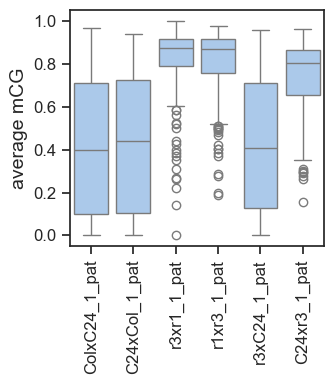

In [1367]:
fig,ax=sumby_boxplot(r3_ant_POI_mCG, singlerepall, 'CG')
fig.set_size_inches(3.5,4)
plt.tight_layout()

plt.savefig(figurepath+'ros1ant_sumby_pat1rep_box_CG.pdf', dpi=350)
plt.savefig(figurepath+'ros1ant_sumby_pat1rep_box_CG.png', dpi=350)


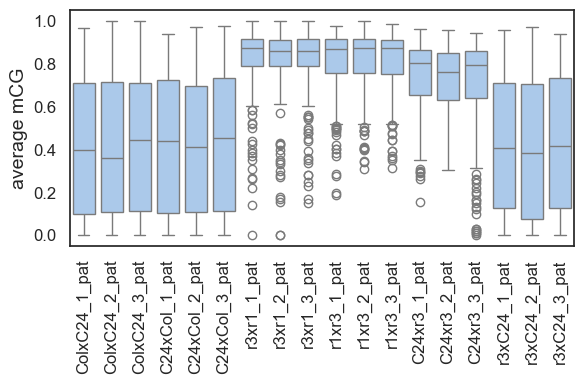

In [838]:
fig,ax=sumby_boxplot(r3_ant_POI_mCG, r3_ant_all, 'CG')
fig.set_size_inches(6,4)
plt.tight_layout()

plt.savefig(figurepath+'ros1ant_sumby_patallrep_box_CG.pdf', dpi=350)
plt.savefig(figurepath+'ros1ant_sumby_patallrep_box_CG.png', dpi=350)


In [1354]:
singlerepall={'ColxC24_1_pat':'ColxC24_1_pat',
              'C24xCol_1_pat':'C24xCol_1_pat',
              'r1xr3_1_pat':'r1xr3_1_pat',
              'r3xr1_1_pat':'r3xr1_1_pat',
              'C24xr3_2_pat':'C24xr3_2_pat',
              'r3xC24_2_pat':'r3xC24_2_pat'}

r3_ant_all={'ColxC24_1_pat':'ColxC24_1_pat',
            'ColxC24_2_pat':'ColxC24_2_pat',
            'ColxC24_3_pat':'ColxC24_3_pat',
              'C24xCol_1_pat':'C24xCol_1_pat',
            'C24xCol_2_pat':'C24xCol_2_pat',
            'C24xCol_3_pat':'C24xCol_3_pat',
              'r3xr1_1_pat':'r3xr1_1_pat',
            'r3xr1_2_pat':'r3xr1_2_pat',
            'r3xr1_3_pat':'r3xr1_3_pat',
              'r1xr3_1_pat':'r1xr3_1_pat',
            'r1xr3_2_pat':'r1xr3_2_pat',
            'r1xr3_3_pat':'r1xr3_3_pat',
              'C24xr3_1_pat':'C24xr3_1_pat',
            'C24xr3_2_pat':'C24xr3_2_pat',
            'C24xr3_3_pat':'C24xr3_3_pat',
              'r3xC24_1_pat':'r3xC24_1_pat',
           'r3xC24_2_pat':'r3xC24_2_pat',
           'r3xC24_3_pat':'r3xC24_3_pat'}


r3_suff={'C24xCol_1_pat':'C24xCol_1_pat','C24xCol_2_pat':'C24xCol_2_pat','C24xCol_3_pat':'C24xCol_3_pat',
         'C24xr3_1_pat':'C24xr3_1_pat','C24xr3_2_pat':'C24xr3_2_pat','C24xr3_3_pat':'C24xr3_3_pat'}


r1_resc={'r3xr1_1_pat':'r3xr1_1_pat','r3xr1_2_pat':'r3xr1_2_pat','r3xr1_3_pat':'r3xr1_3_pat',
         'r3xC24_1_pat':'r3xC24_1_pat','r3xC24_2_pat':'r3xC24_2_pat','r3xC24_3_pat':'r3xC24_3_pat'}


r3_ant_matpat={'C24xCol_1_mat':'C24xCol_1_mat',
            'C24xCol_2_mat':'C24xCol_2_mat',
            'C24xCol_3_mat':'C24xCol_3_mat',
            'ColxC24_1_pat':'ColxC24_1_pat',
            'ColxC24_2_pat':'ColxC24_2_pat',
            'ColxC24_3_pat':'ColxC24_3_pat', 
            'r3xr1_1_mat':'r3xr1_1_mat',
            'r3xr1_2_mat':'r3xr1_2_mat',
            'r3xr1_3_mat':'r3xr1_3_mat',
            'r1xr3_1_pat':'r1xr3_1_pat',
            'r1xr3_2_pat':'r1xr3_2_pat',
            'r1xr3_3_pat':'r1xr3_3_pat',
            'C24xr3_1_mat':'C24xr3_1_mat',
            'C24xr3_2_mat':'C24xr3_2_mat',
            'C24xr3_3_mat':'C24xr3_3_mat',
            'C24xr3_1_pat':'C24xr3_1_pat',
            'C24xr3_2_pat':'C24xr3_2_pat',
            'C24xr3_3_pat':'C24xr3_3_pat',
            'r3xC24_1_mat':'r3xC24_1_mat',
           'r3xC24_2_mat':'r3xC24_2_mat',
           'r3xC24_3_mat':'r3xC24_3_mat',
            'r3xC24_1_pat':'r3xC24_1_pat',
           'r3xC24_2_pat':'r3xC24_2_pat',
           'r3xC24_3_pat':'r3xC24_3_pat'}


matpat_1rep={'C24xCol_1_mat':'C24xCol_1_mat',
            'C24xr3_3_mat':'C24xr3_3_mat',
            'ColxC24_2_pat':'ColxC24_2_pat',
            'r3xC24_3_pat':'r3xC24_3_pat',
            'r3xr1_1_mat':'r3xr1_1_mat',
            'r3xC24_1_mat':'r3xC24_1_mat',
            'r1xr3_2_pat':'r1xr3_2_pat',
            'C24xr3_2_pat':'C24xr3_2_pat'}


matpat={'C24xCol_1_mat':'C24xCol_1_mat',
             'C24xCol_2_mat':'C24xCol_2_mat',
             'C24xCol_3_mat':'C24xCol_3_mat',
             'C24xr3_1_mat':'C24xr3_1_mat',
             'C24xr3_2_mat':'C24xr3_2_mat',
            'C24xr3_3_mat':'C24xr3_3_mat',
            'r3xr1_1_mat':'r3xr1_1_mat',
             'r3xr1_2_mat':'r3xr1_2_mat',
             'r3xr1_3_mat':'r3xr1_3_mat',
            'r3xC24_1_mat':'r3xC24_1_mat',
             'r3xC24_2_mat':'r3xC24_2_mat',
             'r3xC24_3_mat':'r3xC24_3_mat',
             'ColxC24_1_pat':'ColxC24_1_pat',
            'ColxC24_2_pat':'ColxC24_2_pat',
             'ColxC24_3_pat':'ColxC24_3_pat',
             'r3xC24_1_pat':'r3xC24_1_pat',
             'r3xC24_2_pat':'r3xC24_2_pat',
            'r3xC24_3_pat':'r3xC24_3_pat',
             'r1xr3_1_pat':'r1xr3_1_pat',
            'r1xr3_2_pat':'r1xr3_2_pat',
             'r1xr3_3_pat':'r1xr3_3_pat',
             'C24xr3_1_pat':'C24xr3_1_pat',
             'C24xr3_2_pat':'C24xr3_2_pat',
            'C24xr3_3_pat':'C24xr3_3_pat'}

nC_matpat={'nC_C24xCol_1_mat':'nC_C24xCol_1_mat',
             'nC_C24xCol_2_mat':'nC_C24xCol_2_mat',
             'nC_C24xCol_3_mat':'nC_C24xCol_3_mat',
             'nC_C24xr3_1_mat':'nC_C24xr3_1_mat',
             'nC_C24xr3_2_mat':'nC_C24xr3_2_mat',
            'nC_C24xr3_3_mat':'nC_C24xr3_3_mat',
             'nC_ColxC24_1_pat':'nC_ColxC24_1_pat',
            'nC_ColxC24_2_pat':'nC_ColxC24_2_pat',
             'nC_ColxC24_3_pat':'nC_ColxC24_3_pat',
             'nC_r3xC24_1_pat':'nC_r3xC24_1_pat',
             'nC_r3xC24_2_pat':'nC_r3xC24_2_pat',
            'nC_r3xC24_3_pat':'nC_r3xC24_3_pat',
            'nC_r3xr1_1_mat':'nC_r3xr1_1_mat',
             'nC_r3xr1_2_mat':'nC_r3xr1_2_mat',
             'nC_r3xr1_3_mat':'nC_r3xr1_3_mat',
            'nC_r3xC24_1_mat':'nC_r3xC24_1_mat',
             'nC_r3xC24_2_mat':'nC_r3xC24_2_mat',
             'nC_r3xC24_3_mat':'nC_r3xC24_3_mat',
             'nC_r1xr3_1_pat':'nC_r1xr3_1_pat',
            'nC_r1xr3_2_pat':'nC_r1xr3_2_pat',
             'nC_r1xr3_3_pat':'nC_r1xr3_3_pat',
             'nC_C24xr3_1_pat':'nC_C24xr3_1_pat',
             'nC_C24xr3_2_pat':'nC_C24xr3_2_pat',
            'nC_C24xr3_3_pat':'nC_C24xr3_3_pat'}


In [1301]:
print(np.std(np.mean(r3_ant_POI_mCG_allparent[['r1xr3_1_pat','r1xr3_2_pat','r1xr3_3_pat']])))

print(np.mean(r3_ant_POI_mCG_allparent[['r1xr3_1_pat','r1xr3_2_pat','r1xr3_3_pat']]))



0.0008128266024689596
r1xr3_1_pat    0.812379
r1xr3_2_pat    0.813647
r1xr3_3_pat    0.811684
dtype: float64


In [1302]:
print(np.std(np.mean(r3_ant_POI_mCG_allparent[['C24xr3_1_pat','C24xr3_2_pat','C24xr3_3_pat']])))

print(np.mean(r3_ant_POI_mCG_allparent[['C24xr3_1_pat','C24xr3_2_pat','C24xr3_3_pat']]))





0.018318124224088052
C24xr3_1_pat    0.749781
C24xr3_2_pat    0.727304
C24xr3_3_pat    0.704911
dtype: float64


In [1303]:
print(np.std(np.mean(r3_ant_POI_mCG_allparent[['r3xr1_1_mat','r3xr1_2_mat','r3xr1_3_mat']])))

print(np.mean(r3_ant_POI_mCG_allparent[['r3xr1_1_mat','r3xr1_2_mat','r3xr1_3_mat']]))



0.036653645573392485
r3xr1_1_mat    0.236718
r3xr1_2_mat    0.190778
r3xr1_3_mat    0.280552
dtype: float64


In [1304]:
print(np.std(np.mean(r3_ant_POI_mCG_allparent[['r3xC24_1_mat','r3xC24_2_mat','r3xC24_3_mat']])))

print(np.mean(r3_ant_POI_mCG_allparent[['r3xC24_1_mat','r3xC24_2_mat','r3xC24_3_mat']]))



0.06404063383459407
r3xC24_1_mat    0.265544
r3xC24_2_mat    0.371738
r3xC24_3_mat    0.218654
dtype: float64


In [1305]:
print(np.std(np.mean(r3_ant_POI_mCG_allparent[['C24xCol_1_mat','C24xCol_2_mat','C24xCol_3_mat']])))

print(np.mean(r3_ant_POI_mCG_allparent[['C24xCol_1_mat','C24xCol_2_mat','C24xCol_3_mat']]))



0.0017544702007268964
C24xCol_1_mat    0.160886
C24xCol_2_mat    0.165155
C24xCol_3_mat    0.162589
dtype: float64


In [1306]:
print(np.std(np.mean(r3_ant_POI_mCG_allparent[['C24xr3_1_pat','C24xr3_2_pat','C24xr3_3_pat']])))

print(np.mean(r3_ant_POI_mCG_allparent[['C24xr3_1_pat','C24xr3_2_pat','C24xr3_3_pat']]))





0.018318124224088052
C24xr3_1_pat    0.749781
C24xr3_2_pat    0.727304
C24xr3_3_pat    0.704911
dtype: float64


In [1313]:
r3_ant_POI_mCG_allparent

,chr,start,end,C24xr3_1_pat,nC_C24xr3_1_pat,C24xr3_2_pat,nC_C24xr3_2_pat,C24xr3_3_pat,nC_C24xr3_3_pat,r3xC24_1_pat,...,nC_ColxC24_2_mat,ColxC24_3_mat,nC_ColxC24_3_mat,C24xCol_1_mat,nC_C24xCol_1_mat,C24xCol_2_mat,nC_C24xCol_2_mat,C24xCol_3_mat,nC_C24xCol_3_mat,outlier
0,Chr1,239072,239350,0.886857,22,0.868263,22,0.882892,22,0.875491,...,22,0.349398,22,0.536082,22,0.556732,22,0.622596,22,False
1,Chr1,3413028,3413664,0.780735,24,0.749231,24,0.756579,24,0.175258,...,13,0.026906,13,0.129736,24,0.130548,24,0.146900,24,False
2,Chr1,3550806,3551360,0.608696,19,0.744027,15,0.664103,19,0.027972,...,10,0.008130,10,0.046117,21,0.002907,18,0.042607,21,False
3,Chr1,3925596,3925833,0.781818,13,0.763713,13,0.824773,13,0.779783,...,13,0.147929,13,0.255591,13,0.174051,13,0.226866,13,False
4,Chr1,4787227,4787387,0.866379,11,0.796537,11,0.900485,11,0.151862,...,11,0.045643,11,0.051225,11,0.058824,11,0.045333,11,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
257,Chr5,20129826,20130144,0.901437,17,0.879880,17,0.907441,17,0.033333,...,17,0.000000,17,0.004580,17,0.001859,17,0.001972,17,False
258,Chr5,22706041,22706148,0.740506,5,0.714286,5,0.823129,5,0.500000,...,5,0.136364,5,0.256604,5,0.158730,5,0.299401,5,False
259,Chr5,24723505,24723658,0.793103,12,0.827273,9,0.868020,14,0.844749,...,16,0.280374,8,0.491228,10,0.459119,10,0.306452,13,False
260,Chr5,25440558,25440648,0.626536,9,0.532663,9,0.718310,9,0.629091,...,9,0.074866,9,0.163488,9,0.164609,9,0.137195,9,False


In [1308]:
t_stat, p_value = stats.ttest_ind(np.mean(r3_ant_POI_mCG_allparent[['C24xr3_1_mat','C24xr3_2_mat','C24xr3_3_mat']]), np.mean(r3_ant_POI_mCG_allparent[['C24xCol_1_mat','C24xCol_2_mat','C24xCol_3_mat']]), equal_var=False)
print("T statistic:", t_stat)
print("P-value:", p_value)

T statistic: -5.483452223364708
P-value: 0.029705142058852628


In [1309]:
t_stat, p_value = stats.ttest_ind(np.mean(r3_ant_POI_mCG_allparent[['r3xC24_1_mat','r3xC24_2_mat','r3xC24_3_mat']]), np.mean(r3_ant_POI_mCG_allparent[['r3xr1_1_mat','r3xr1_2_mat','r3xr1_3_mat']]), equal_var=False)
print("T statistic:", t_stat)
print("P-value:", p_value)

T statistic: 0.9448014748570908
P-value: 0.4108007879369645


## Statistics for supplemental fig 18

In [1356]:
tests=4
#4 tests pat, 4 tests mat (not overlapping?)

In [1357]:
# r3 het pat vs r3 hmz pat
t_stat, p_value = stats.ttest_ind(np.mean(r3_ant_POI_mCG_allparent[['C24xr3_1_pat','C24xr3_2_pat','C24xr3_3_pat']]), np.mean(r3_ant_POI_mCG_allparent[['r1xr3_1_pat','r1xr3_2_pat','r1xr3_3_pat']]), equal_var=False)
print("T statistic:", t_stat)
print("P-value:", p_value)
bonferonni_p=p_value*tests
print("Bonferonni-p:",bonferonni_p)

T statistic: -6.574160536426345
P-value: 0.02214269055432591
Bonferonni-p: 0.08857076221730364


In [1358]:
#C24 het pat vs C24 hmz pat
t_stat, p_value = stats.ttest_ind(np.mean(r3_ant_POI_mCG_allparent[['r3xC24_1_pat','r3xC24_2_pat','r3xC24_3_pat']]), np.mean(r3_ant_POI_mCG_allparent[['ColxC24_1_pat','ColxC24_2_pat','ColxC24_3_pat']]), equal_var=False)
print("T statistic:", t_stat)
print("P-value:", p_value)
bonferonni_p=p_value*tests
print("Bonferonni-p:",bonferonni_p)

T statistic: 0.4978469349285195
P-value: 0.6481578270196506
Bonferonni-p: 2.5926313080786025


In [1359]:
#C24 pat hmz vs r3 pat het
t_stat, p_value = stats.ttest_ind(np.mean(r3_ant_POI_mCG_allparent[['ColxC24_1_pat','ColxC24_2_pat','ColxC24_3_pat']]), np.mean(r3_ant_POI_mCG_allparent[['C24xr3_1_pat','C24xr3_2_pat','C24xr3_3_pat']]), equal_var=False)
print("T statistic:", t_stat)
print("P-value:", p_value)

bonferonni_p=p_value*tests
print("Bonferonni-p:",bonferonni_p)

T statistic: -22.290847519423316
P-value: 0.00040307091990170955
Bonferonni-p: 0.0016122836796068382


In [1360]:
#C24 pat hmz vs r3 pat hmz
t_stat, p_value = stats.ttest_ind(np.mean(r3_ant_POI_mCG_allparent[['ColxC24_1_pat','ColxC24_2_pat','ColxC24_3_pat']]), np.mean(r3_ant_POI_mCG_allparent[['r1xr3_1_pat','r1xr3_2_pat','r1xr3_3_pat']]), equal_var=False)
print("T statistic:", t_stat)
print("P-value:", p_value)

bonferonni_p=p_value*tests
print("Bonferonni-p:",bonferonni_p)

T statistic: -72.98720802012605
P-value: 0.00015946016054764361
Bonferonni-p: 0.0006378406421905745


In [1361]:
#C24 mat hmz vs r3 mat hmz
t_stat, p_value = stats.ttest_ind(np.mean(r3_ant_POI_mCG_allparent[['C24xCol_1_mat','C24xCol_2_mat','C24xCol_3_mat']]), np.mean(r3_ant_POI_mCG_allparent[['r3xr1_1_mat','r3xr1_2_mat','r3xr1_3_mat']]), equal_var=False)
print("T statistic:", t_stat)
print("P-value:", p_value)
bonferonni_p=p_value*tests
print("Bonferonni-p:",bonferonni_p)

T statistic: -2.818725070119539
P-value: 0.10564816936350667
Bonferonni-p: 0.4225926774540267


In [1362]:
#C24 mat hmz vs r3 mat het
t_stat, p_value = stats.ttest_ind(np.mean(r3_ant_POI_mCG_allparent[['C24xCol_1_mat','C24xCol_2_mat','C24xCol_3_mat']]), np.mean(r3_ant_POI_mCG_allparent[['r3xC24_1_mat','r3xC24_2_mat','r3xC24_3_mat']]), equal_var=False)
print("T statistic:", t_stat)
print("P-value:", p_value)
bonferonni_p=p_value*tests
print("Bonferonni-p:",bonferonni_p)

T statistic: -2.7027380780422594
P-value: 0.11378474494290387
Bonferonni-p: 0.4551389797716155


In [1363]:
#r3 mat het vs r3 mat hmz
t_stat, p_value = stats.ttest_ind(np.mean(r3_ant_POI_mCG_allparent[['r3xC24_1_mat','r3xC24_2_mat','r3xC24_3_mat']]), np.mean(r3_ant_POI_mCG_allparent[['r3xr1_1_mat','r3xr1_2_mat','r3xr1_3_mat']]), equal_var=False)
print("T statistic:", t_stat)
print("P-value:", p_value)
bonferonni_p=p_value*tests
print("Bonferonni-p:",bonferonni_p)

T statistic: 0.9448014748570908
P-value: 0.4108007879369645
Bonferonni-p: 1.643203151747858


In [1364]:
#C24 mat hmz vs C24 mat het
t_stat, p_value = stats.ttest_ind(np.mean(r3_ant_POI_mCG_allparent[['C24xCol_1_mat','C24xCol_2_mat','C24xCol_3_mat']]), np.mean(r3_ant_POI_mCG_allparent[['C24xr3_1_mat','C24xr3_2_mat','C24xr3_3_mat']]), equal_var=False)
print("T statistic:", t_stat)
print("P-value:", p_value)
bonferonni_p=p_value*tests
print("Bonferonni-p:",bonferonni_p)

T statistic: 5.483452223364708
P-value: 0.029705142058852628
Bonferonni-p: 0.11882056823541051


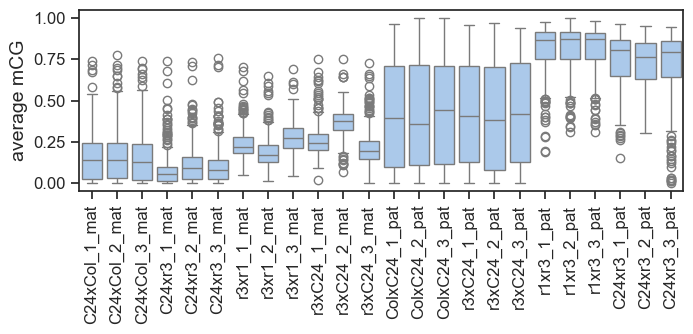

In [1355]:
fig,ax=sumby_boxplot(r3_ant_POI_mCG_allparent, matpat, 'CG')
fig.set_size_inches(7,3.5)
plt.tight_layout()

plt.savefig(figurepath+'ros1ant_sumby_matpatallrep_box_CG.pdf', dpi=350)
#plt.savefig(figurepath+'ros1ant_sumby_matpatallrep_box_CG.png', dpi=350)


## Scatterplot with fit line

In [453]:
r3ant_POI_mCG_avg=makeavgdf(r3_ant_POI_mCG).set_axis(['chr','start','end','r3het_pat','C24het_pat','r3hmz_pat','C24hmz_pat'], axis="columns")

In [ ]:
import scipy as sp
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.lines import Line2D

def get_correlation(df, col1, col2):
    r, p = sp.stats.pearsonr(x=df[col1], y=df[col2])
    #tested the spearman test, did not change interpretation of result so continued with pearson.
    #r, p = sp.stats.spearmanr(a=df[col1], b=df[col2])
    return r, p

def scatter_dmrmatpat(df, x, y, xlabel, ylabel, hue='DMR class', xlim=[-0.02,1.02], ylim=[-0.02, 1.02], correlate=False, left_text=True, saveas=False, fit_line=False, color_outliers=False):
    fig, ax = plt.subplots()

    if fit_line:
        # Perform a linear fit using numpy.polyfit to get the slope and intercept
        slope, intercept = np.polyfit(df[x], df[y], 1)
        y_pred = slope * df[x] + intercept  # Calculate predicted y values using the linear equation
        ax.plot(df[x], y_pred, color='r', linewidth=2)  # Plot the line of best fit
        print("slope = "+str(slope))
        print("intercept = "+str(intercept))
        # Calculate residuals (the difference between actual and predicted y values)
        residuals = df[y] - y_pred
    else:
        sns.scatterplot(data=df, x=x, y=y, ax=ax)


    # If color_outliers is True, flag points that are >= 2 standard deviations from the line
    if color_outliers:
        std_residuals = np.std(residuals)
        df['outlier'] = np.abs(residuals) >= 2 * std_residuals
        
        # Color the outliers differently based on the 'outlier' column
        sns.scatterplot(data=df, x=x, y=y, ax=ax, hue='outlier', palette={True: 'orange', False: 'blue'}, legend=False)
        # Optionally, add a legend for the outliers
        ax.legend(['Outlier', 'Normal'], loc='upper left')
    else:
        # Plot normally without coloring based on outliers
        if hue is None:
            sns.scatterplot(data=df, x=x, y=y, ax=ax)
        elif hue is not None:
            sns.scatterplot(data=df, x=x, y=y, hue=hue, ax=ax, legend=False)
    if correlate:
        r, p = get_correlation(df, x, y)
        
        if left_text:
            plt.text(.05, .8, "Pearson's r ={:.2f}".format(r), transform=ax.transAxes)
            plt.text(.05, .75, "p value ={:.4f}".format(p), transform=ax.transAxes)
            plt.text(.05, .7, "n="+str(len(df)), transform=ax.transAxes)
        else:
            plt.text(.65, .4, "Pearson's r ={:.2f}".format(r), transform=ax.transAxes)
            plt.text(.65, .35, "p value ={:.4f}".format(p), transform=ax.transAxes)
            plt.text(.65, .3, "n="+str(len(df)), transform=ax.transAxes)

    ax.set_xlim(xlim)
    ax.set_ylim(ylim)
    ax.set_xlabel(xlabel, fontsize=12)
    ax.set_ylabel(ylabel, fontsize=12)
    ax.tick_params(labelsize=10)
    ax.set_aspect('equal', adjustable='box')

    print('r value ='+ str(r))
    print('p value ='+ str(p))

    if saveas:
        print('plot saved')
        return fig, ax
        # fig.savefig(saveas, dpi=350)
    else:
        print('plot not saved')
        return fig, ax
        plt.show()


In [ ]:
fig,ax=scatter_dmrmatpat(r3ant_POI_mCG_avg, x="r3het_pat", y="r3hmz_pat", xlabel="C24xr3 paternal allele mCG", ylabel="r1xr3 paternal allele mCG", hue=None,correlate=True, left_text=False, 
                         saveas=False, fit_line=True, color_outliers=True)
fig.set_size_inches(4.5,4)
plt.tight_layout()

plt.savefig(figurepath+"r3pat_F1s_mCG_in_ros1ant_scatter_fitline.pdf", dpi=350)


# Correlation scatterplots for summed mC data at r3 CGr DMRs

In [176]:
def readindata(file):
    sumcolumns=['chr','start','end','name','avg_methy','nC']
    df=pd.read_csv(sumpath+file, header=None, sep=tab, names=sumcolumns)
    df=df.drop(['name'], axis=1)
    return (df)
def makeavgdf(datadf):
    bed=['chr','start','end']
    avgdf = datadf[bed].copy()
    avgdf['C24xr3_pat']=((datadf['C24xr3_1_pat']+datadf['C24xr3_2_pat']+datadf['C24xr3_3_pat'])/3)
    avgdf['r3xC24_pat']=((datadf['r3xC24_1_pat']+datadf['r3xC24_2_pat']+datadf['r3xC24_3_pat'])/3)
    avgdf['r1xr3_pat']=((datadf['r1xr3_1_pat']+datadf['r1xr3_2_pat']+datadf['r1xr3_3_pat'])/3)
    avgdf['ColxC24_pat']=((datadf['ColxC24_1_pat']+datadf['ColxC24_2_pat']+datadf['ColxC24_3_pat'])/3)
    return (avgdf)
def makeavgdf_mat(datadf):
    bed=['chr','start','end']
    avgdf = datadf[bed].copy()
    avgdf['C24xr3_mat']=((datadf['C24xr3_1_mat']+datadf['C24xr3_2_mat']+datadf['C24xr3_3_mat'])/3)
    avgdf['r3xC24_mat']=((datadf['r3xC24_1_mat']+datadf['r3xC24_2_mat']+datadf['r3xC24_3_mat'])/3)
    avgdf['r3xr1_mat']=((datadf['r3xr1_1_mat']+datadf['r3xr1_2_mat']+datadf['r3xr1_3_mat'])/3)
    avgdf['C24xCol_mat']=((datadf['C24xCol_1_mat']+datadf['C24xCol_2_mat']+datadf['C24xCol_3_mat'])/3)
    return (avgdf)

poi_columns=['chr','start','end','C24xr3_1_pat','nC_C24xr3_1_pat','C24xr3_2_pat','nC_C24xr3_2_pat','C24xr3_3_pat','nC_C24xr3_3_pat',
             'r3xC24_1_pat','nC_r3xC24_1_pat','r3xC24_2_pat','nC_r3xC24_2_pat','r3xC24_3_pat','nC_r3xC24_3_pat',
             'r3xC24_1_mat','nC_r3xC24_1_mat','r3xC24_2_mat','nC_r3xC24_2_mat','r3xC24_3_mat','nC_r3xC24_3_mat',
             'C24xr3_1_mat','nC_C24xr3_1_mat','C24xr3_2_mat','nC_C24xr3_2_mat','C24xr3_3_mat','nC_C24xr3_3_mat']

In [177]:
import scipy as sp
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.lines import Line2D

def get_correlation(df, col1, col2):
    r, p = sp.stats.pearsonr(x=df[col1], y=df[col2])
    #tested the spearman test, did not change interpretation of result so continued with pearson.
    #r, p = sp.stats.spearmanr(a=df[col1], b=df[col2])
    return r, p

def scatter_dmrmatpat(df, x, y, xlabel, ylabel, hue='DMR class', xlim=[-0.02,1.02], ylim=[-0.02, 1.02], correlate=False, left_text=True, saveas=False, fit_line=False):
    fig, ax = plt.subplots()
    
    if hue==None:
        sns.scatterplot(data=df, x=x, y=y, ax=ax)
    elif hue is not None:
        sns.scatterplot(data=df, x=x, y=y, hue=hue, ax=ax, legend=False)
        #sns.move_legend(ax, 'lower right')
        if hue=="_lefton_TE":
            legend_elements = [Line2D([0], [0], marker='o', color='w', label='Scatter', markerfacecolor='b', markersize=7),
                               Line2D([0], [0], marker='o', color='w', label='Scatter', markerfacecolor='g', markersize=7)]
            ax.legend(handles=legend_elements, labels=['no gene within 1kb','gene within 1kb or intersecting'])
        if hue=="_lefton_gene":
            legend_elements = [Line2D([0], [0], marker='o', color='w', label='Scatter', markerfacecolor='b', markersize=7),
                               Line2D([0], [0], marker='o', color='w', label='Scatter', markerfacecolor='g', markersize=7)]
            ax.legend(handles=legend_elements, labels=['no TE within 1kb','TE within 1kb or intersecting'])
    
    # Optionally add a line of best fit (linear regression)
    if fit_line:
        sns.regplot(data=df, x=x, y=y, ax=ax, scatter=False, color='r', line_kws={'linewidth': 2})  # 'r' is the color red

    if correlate:
        r, p = get_correlation(df, x, y)
        
        if left_text:
            plt.text(.05, .8, "Pearson's r ={:.2f}".format(r), transform=ax.transAxes)
            plt.text(.05, .75, "p value ={:.4f}".format(p), transform=ax.transAxes)
            plt.text(.05, .7, "n="+str(len(df)), transform=ax.transAxes)
        else:
            plt.text(.65, .4, "Pearson's r ={:.2f}".format(r), transform=ax.transAxes)
            plt.text(.65, .35, "p value ={:.4f}".format(p), transform=ax.transAxes)
            plt.text(.65, .3, "n="+str(len(df)), transform=ax.transAxes)

    ax.set_xlim(xlim)
    ax.set_ylim(ylim)
    ax.set_xlabel(xlabel, fontsize=12)
    ax.set_ylabel(ylabel, fontsize=12)
    ax.tick_params(labelsize=10)
    ax.set_aspect('equal', adjustable='box')

    print('r value ='+ str(r))
    print('p value ='+ str(p))

    if saveas:
        print('plot saved')
        return fig, ax
        # fig.savefig(saveas, dpi=350)
    else:
        print('plot not saved')
        return fig, ax
        plt.show()


In [178]:
sumpath=path+"dmr_targets_new/sumby_out/"
r3_pat_1_CG_sumby_r3_CGr=readindata("C24xr3_1_Col_spiked_CG_sumby_r3_v_wt_CG.DMRs.hyper.bed")
r3_pat_1_CHG_sumby_r3_CGr=readindata("C24xr3_1_Col_spiked_CHG_sumby_r3_v_wt_CG.DMRs.hyper.bed")
r3_pat_1_CHH_sumby_r3_CGr=readindata("C24xr3_1_Col_spiked_CHH_sumby_r3_v_wt_CG.DMRs.hyper.bed")

C24_mat_1_CG_sumby_r3_CGr=readindata("C24xr3_1_C24_pseudo_CG_sumby_r3_v_wt_CG.DMRs.hyper.bed")
C24_mat_1_CHG_sumby_r3_CGr=readindata("C24xr3_1_C24_pseudo_CHG_sumby_r3_v_wt_CG.DMRs.hyper.bed")
C24_mat_1_CHH_sumby_r3_CGr=readindata("C24xr3_1_C24_pseudo_CHH_sumby_r3_v_wt_CG.DMRs.hyper.bed")

r3_pat_2_CG_sumby_r3_CGr=readindata("C24xr3_2_Col_spiked_CG_sumby_r3_v_wt_CG.DMRs.hyper.bed")
r3_pat_2_CHG_sumby_r3_CGr=readindata("C24xr3_2_Col_spiked_CHG_sumby_r3_v_wt_CG.DMRs.hyper.bed")
r3_pat_2_CHH_sumby_r3_CGr=readindata("C24xr3_2_Col_spiked_CHH_sumby_r3_v_wt_CG.DMRs.hyper.bed")

C24_mat_2_CG_sumby_r3_CGr=readindata("C24xr3_2_C24_pseudo_CG_sumby_r3_v_wt_CG.DMRs.hyper.bed")
C24_mat_2_CHG_sumby_r3_CGr=readindata("C24xr3_2_C24_pseudo_CHG_sumby_r3_v_wt_CG.DMRs.hyper.bed")
C24_mat_2_CHH_sumby_r3_CGr=readindata("C24xr3_2_C24_pseudo_CHH_sumby_r3_v_wt_CG.DMRs.hyper.bed")

r3_pat_3_CG_sumby_r3_CGr=readindata("C24xr3_3_Col_spiked_CG_sumby_r3_v_wt_CG.DMRs.hyper.bed")
r3_pat_3_CHG_sumby_r3_CGr=readindata("C24xr3_3_Col_spiked_CHG_sumby_r3_v_wt_CG.DMRs.hyper.bed")
r3_pat_3_CHH_sumby_r3_CGr=readindata("C24xr3_3_Col_spiked_CHH_sumby_r3_v_wt_CG.DMRs.hyper.bed")

C24_mat_3_CG_sumby_r3_CGr=readindata("C24xr3_3_C24_pseudo_CG_sumby_r3_v_wt_CG.DMRs.hyper.bed")
C24_mat_3_CHG_sumby_r3_CGr=readindata("C24xr3_3_C24_pseudo_CHG_sumby_r3_v_wt_CG.DMRs.hyper.bed")
C24_mat_3_CHH_sumby_r3_CGr=readindata("C24xr3_3_C24_pseudo_CHH_sumby_r3_v_wt_CG.DMRs.hyper.bed")


r3_mat_1_CG_sumby_r3_CGr=readindata("r3xC24_1_Col_spiked_CG_sumby_r3_v_wt_CG.DMRs.hyper.bed")
r3_mat_1_CHG_sumby_r3_CGr=readindata("r3xC24_1_Col_spiked_CHG_sumby_r3_v_wt_CG.DMRs.hyper.bed")
r3_mat_1_CHH_sumby_r3_CGr=readindata("r3xC24_1_Col_spiked_CHH_sumby_r3_v_wt_CG.DMRs.hyper.bed")

C24_pat_1_CG_sumby_r3_CGr=readindata("r3xC24_1_C24_pseudo_CG_sumby_r3_v_wt_CG.DMRs.hyper.bed")
C24_pat_1_CHG_sumby_r3_CGr=readindata("r3xC24_1_C24_pseudo_CHG_sumby_r3_v_wt_CG.DMRs.hyper.bed")
C24_pat_1_CHH_sumby_r3_CGr=readindata("r3xC24_1_C24_pseudo_CHH_sumby_r3_v_wt_CG.DMRs.hyper.bed")

r3_mat_2_CG_sumby_r3_CGr=readindata("r3xC24_2_Col_spiked_CG_sumby_r3_v_wt_CG.DMRs.hyper.bed")
r3_mat_2_CHG_sumby_r3_CGr=readindata("r3xC24_2_Col_spiked_CHG_sumby_r3_v_wt_CG.DMRs.hyper.bed")
r3_mat_2_CHH_sumby_r3_CGr=readindata("r3xC24_2_Col_spiked_CHH_sumby_r3_v_wt_CG.DMRs.hyper.bed")

C24_pat_2_CG_sumby_r3_CGr=readindata("r3xC24_2_C24_pseudo_CG_sumby_r3_v_wt_CG.DMRs.hyper.bed")
C24_pat_2_CHG_sumby_r3_CGr=readindata("r3xC24_2_C24_pseudo_CHG_sumby_r3_v_wt_CG.DMRs.hyper.bed")
C24_pat_2_CHH_sumby_r3_CGr=readindata("r3xC24_2_C24_pseudo_CHH_sumby_r3_v_wt_CG.DMRs.hyper.bed")

r3_mat_3_CG_sumby_r3_CGr=readindata("r3xC24_3_Col_spiked_CG_sumby_r3_v_wt_CG.DMRs.hyper.bed")
r3_mat_3_CHG_sumby_r3_CGr=readindata("r3xC24_3_Col_spiked_CHG_sumby_r3_v_wt_CG.DMRs.hyper.bed")
r3_mat_3_CHH_sumby_r3_CGr=readindata("r3xC24_3_Col_spiked_CHH_sumby_r3_v_wt_CG.DMRs.hyper.bed")

C24_pat_3_CG_sumby_r3_CGr=readindata("r3xC24_3_C24_pseudo_CG_sumby_r3_v_wt_CG.DMRs.hyper.bed")
C24_pat_3_CHG_sumby_r3_CGr=readindata("r3xC24_3_C24_pseudo_CHG_sumby_r3_v_wt_CG.DMRs.hyper.bed")
C24_pat_3_CHH_sumby_r3_CGr=readindata("r3xC24_3_C24_pseudo_CHH_sumby_r3_v_wt_CG.DMRs.hyper.bed")


### make averaged dfs from 1parent data

In [179]:
def makedatadf_het(r3_pat1,r3_pat2,r3_pat3,C24_pat1,C24_pat2,C24_pat3,r3_mat1,r3_mat2,r3_mat3,C24_mat1,C24_mat2,C24_mat3):
    out=pd.DataFrame()
    
    r3pat=r3_pat1.merge(r3_pat2, on=['chr','start','end'], how="outer", suffixes=["_1", "_2"]).merge(r3_pat3, how="outer")
    C24pat=C24_pat1.merge(C24_pat2, on=['chr','start','end'], how="outer", suffixes=["_1", "_2"]).merge(C24_pat3, how="outer")
    r3mat=r3_mat1.merge(r3_mat2, on=['chr','start','end'], how="outer", suffixes=["_1", "_2"]).merge(r3_mat3, how="outer")
    C24mat=C24_mat1.merge(C24_mat2, on=['chr','start','end'], how="outer", suffixes=["_1", "_2"]).merge(C24_mat3, how="outer")


    out['chr']=r3pat['chr']
    out['start']=r3pat['start']
    out['end']=r3pat['end']
    out['avg_methy_r3pat_1']=r3pat['avg_methy_1']
    out['nC_r3pat_1']=r3pat['nC_1']
    out['avg_methy_r3pat_2']=r3pat['avg_methy_2']
    out['nC_r3pat_2']=r3pat['nC_2']
    out['avg_methy_r3pat_3']=r3pat['avg_methy']
    out['nC_r3pat_3']=r3pat['nC']
    
    out=out.merge(C24pat, on=['chr','start','end'], how="outer")
    out=out.rename(columns={"avg_methy": "avg_methy_C24pat_3", "nC": "nC_C24pat_3"})

    out=out.merge(r3mat, on=['chr','start','end'], how="outer")
    out=out.rename(columns={"avg_methy": "avg_methy_r3mat_3", "nC": "nC_r3mat_3"})

    out=out.merge(C24mat, on=['chr','start','end'], how="outer")
    out=out.rename(columns={"avg_methy": "avg_methy_C24mat_3", "nC": "nC_C24mat_3"})

    dropNA_data=out.dropna()
    return(dropNA_data)
    #return(out)
    
    
    

In [180]:
r3_CGr_POI_mCG_het=makedatadf_het(r3_pat_1_CG_sumby_r3_CGr, r3_pat_2_CG_sumby_r3_CGr, r3_pat_3_CG_sumby_r3_CGr, 
                          C24_pat_1_CG_sumby_r3_CGr, C24_pat_2_CG_sumby_r3_CGr, C24_pat_3_CG_sumby_r3_CGr,
                          r3_mat_1_CG_sumby_r3_CGr, r3_mat_2_CG_sumby_r3_CGr, r3_mat_3_CG_sumby_r3_CGr, 
                          C24_mat_1_CG_sumby_r3_CGr, C24_mat_2_CG_sumby_r3_CGr, C24_mat_3_CG_sumby_r3_CGr).set_axis(poi_columns, axis='columns')

In [181]:
r3_CGr_POI_mCG_het

,chr,start,end,C24xr3_1_pat,nC_C24xr3_1_pat,C24xr3_2_pat,nC_C24xr3_2_pat,C24xr3_3_pat,nC_C24xr3_3_pat,r3xC24_1_pat,...,r3xC24_2_mat,nC_r3xC24_2_mat,r3xC24_3_mat,nC_r3xC24_3_mat,C24xr3_1_mat,nC_C24xr3_1_mat,C24xr3_2_mat,nC_C24xr3_2_mat,C24xr3_3_mat,nC_C24xr3_3_mat
0,Chr1,16824,16915,0.749226,11.0,0.794118,11.0,0.705224,11.0,0.048000,...,0.350272,11.0,0.306502,11.0,0.005376,11.0,0.000000,11.0,0.015957,11.0
2,Chr1,1883842,1883989,0.847561,9.0,0.756757,9.0,0.804878,9.0,0.539062,...,0.397574,9.0,0.322715,9.0,0.052805,8.0,0.053648,8.0,0.061261,8.0
3,Chr1,2986181,2986284,0.833333,5.0,0.632653,5.0,0.611111,2.0,0.036364,...,0.616822,5.0,0.293103,5.0,0.008264,5.0,0.051546,5.0,0.009434,5.0
4,Chr1,2987048,2987250,0.775031,21.0,0.780105,21.0,0.664557,21.0,0.000000,...,0.306082,21.0,0.132458,21.0,0.005578,21.0,0.010791,21.0,0.012567,21.0
6,Chr1,4583616,4583718,0.857820,7.0,0.838710,7.0,0.905882,7.0,0.000000,...,0.344828,7.0,0.193853,7.0,0.014706,7.0,0.000000,7.0,0.048276,7.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
768,Chr5,24382432,24382598,0.915094,5.0,0.893333,4.0,0.471154,5.0,0.000000,...,0.458128,5.0,0.226667,5.0,0.000000,3.0,0.024390,2.0,0.000000,5.0
769,Chr5,24382744,24382852,0.895833,10.0,0.900000,10.0,0.812261,10.0,0.000000,...,0.370079,10.0,0.102397,10.0,0.000000,9.0,0.000000,9.0,0.003289,9.0
770,Chr5,24814028,24814085,0.878571,9.0,0.909091,9.0,0.658291,9.0,0.885870,...,0.715084,9.0,0.549801,9.0,0.516252,9.0,0.500000,9.0,0.498106,9.0
772,Chr5,25744406,25744510,0.671429,15.0,0.727794,15.0,0.426000,15.0,0.439344,...,0.645075,15.0,0.370787,15.0,0.394077,15.0,0.613115,15.0,0.500000,15.0


### pull back in data from 2 parent ros1

In [341]:
r3_pat_1_CG_sumby_r3_CGr=readindata("r1xr3_1_Col_spiked_CG_min5_sumby_r3_v_wt_CG.DMRs.hyper.bed")
r3_pat_1_CHG_sumby_r3_CGr=readindata("r1xr3_1_Col_spiked_CHG_min5_sumby_r3_v_wt_CG.DMRs.hyper.bed")
r3_pat_1_CHH_sumby_r3_CGr=readindata("r1xr3_1_Col_spiked_CHH_min5_sumby_r3_v_wt_CG.DMRs.hyper.bed")

r3_pat_2_CG_sumby_r3_CGr=readindata("r1xr3_2_Col_spiked_CG_min5_sumby_r3_v_wt_CG.DMRs.hyper.bed")
r3_pat_2_CHG_sumby_r3_CGr=readindata("r1xr3_2_Col_spiked_CHG_min5_sumby_r3_v_wt_CG.DMRs.hyper.bed")
r3_pat_2_CHH_sumby_r3_CGr=readindata("r1xr3_2_Col_spiked_CHH_min5_sumby_r3_v_wt_CG.DMRs.hyper.bed")

r3_pat_3_CG_sumby_r3_CGr=readindata("r1xr3_3_Col_spiked_CG_min5_sumby_r3_v_wt_CG.DMRs.hyper.bed")
r3_pat_3_CHG_sumby_r3_CGr=readindata("r1xr3_3_Col_spiked_CHG_min5_sumby_r3_v_wt_CG.DMRs.hyper.bed")
r3_pat_3_CHH_sumby_r3_CGr=readindata("r1xr3_3_Col_spiked_CHH_min5_sumby_r3_v_wt_CG.DMRs.hyper.bed")


r1_pat_1_CG_sumby_r3_CGr=readindata("r3xr1_1_C24_pseudo_CG_min5_sumby_r3_v_wt_CG.DMRs.hyper.bed")
r1_pat_1_CHG_sumby_r3_CGr=readindata("r3xr1_1_C24_pseudo_CHG_min5_sumby_r3_v_wt_CG.DMRs.hyper.bed")
r1_pat_1_CHH_sumby_r3_CGr=readindata("r3xr1_1_C24_pseudo_CHH_min5_sumby_r3_v_wt_CG.DMRs.hyper.bed")

r1_pat_2_CG_sumby_r3_CGr=readindata("r3xr1_2_C24_pseudo_CG_min5_sumby_r3_v_wt_CG.DMRs.hyper.bed")
r1_pat_2_CHG_sumby_r3_CGr=readindata("r3xr1_2_C24_pseudo_CHG_min5_sumby_r3_v_wt_CG.DMRs.hyper.bed")
r1_pat_2_CHH_sumby_r3_CGr=readindata("r3xr1_2_C24_pseudo_CHH_min5_sumby_r3_v_wt_CG.DMRs.hyper.bed")

r1_pat_3_CG_sumby_r3_CGr=readindata("r3xr1_3_C24_pseudo_CG_min5_sumby_r3_v_wt_CG.DMRs.hyper.bed")
r1_pat_3_CHG_sumby_r3_CGr=readindata("r3xr1_3_C24_pseudo_CHG_min5_sumby_r3_v_wt_CG.DMRs.hyper.bed")
r1_pat_3_CHH_sumby_r3_CGr=readindata("r3xr1_3_C24_pseudo_CHH_min5_sumby_r3_v_wt_CG.DMRs.hyper.bed")



C24_mat_1_CG_sumby_r3_CGr=readindata("C24xCol_1_C24_pseudo_CG_min5_sumby_r3_v_wt_CG.DMRs.hyper.bed")
C24_mat_1_CHG_sumby_r3_CGr=readindata("C24xCol_1_C24_pseudo_CHG_min5_sumby_r3_v_wt_CG.DMRs.hyper.bed")
C24_mat_1_CHH_sumby_r3_CGr=readindata("C24xCol_1_C24_pseudo_CHH_min5_sumby_r3_v_wt_CG.DMRs.hyper.bed")

C24_mat_2_CG_sumby_r3_CGr=readindata("C24xCol_2_C24_pseudo_CG_min5_sumby_r3_v_wt_CG.DMRs.hyper.bed")
C24_mat_2_CHG_sumby_r3_CGr=readindata("C24xCol_2_C24_pseudo_CHG_min5_sumby_r3_v_wt_CG.DMRs.hyper.bed")
C24_mat_2_CHH_sumby_r3_CGr=readindata("C24xCol_2_C24_pseudo_CHH_min5_sumby_r3_v_wt_CG.DMRs.hyper.bed")

C24_mat_3_CG_sumby_r3_CGr=readindata("C24xCol_3_C24_pseudo_CG_min5_sumby_r3_v_wt_CG.DMRs.hyper.bed")
C24_mat_3_CHG_sumby_r3_CGr=readindata("C24xCol_3_C24_pseudo_CHG_min5_sumby_r3_v_wt_CG.DMRs.hyper.bed")
C24_mat_3_CHH_sumby_r3_CGr=readindata("C24xCol_3_C24_pseudo_CHH_min5_sumby_r3_v_wt_CG.DMRs.hyper.bed")

r1_mat_1_CG_sumby_r3_CGr=readindata("r1xr3_1_C24_pseudo_CG_min5_sumby_r3_v_wt_CG.DMRs.hyper.bed")
r1_mat_1_CHG_sumby_r3_CGr=readindata("r1xr3_1_C24_pseudo_CHG_min5_sumby_r3_v_wt_CG.DMRs.hyper.bed")
r1_mat_1_CHH_sumby_r3_CGr=readindata("r1xr3_1_C24_pseudo_CHH_min5_sumby_r3_v_wt_CG.DMRs.hyper.bed")

r1_mat_2_CG_sumby_r3_CGr=readindata("r1xr3_2_C24_pseudo_CG_min5_sumby_r3_v_wt_CG.DMRs.hyper.bed")
r1_mat_2_CHG_sumby_r3_CGr=readindata("r1xr3_2_C24_pseudo_CHG_min5_sumby_r3_v_wt_CG.DMRs.hyper.bed")
r1_mat_2_CHH_sumby_r3_CGr=readindata("r1xr3_2_C24_pseudo_CHH_min5_sumby_r3_v_wt_CG.DMRs.hyper.bed")

r1_mat_3_CG_sumby_r3_CGr=readindata("r1xr3_3_C24_pseudo_CG_min5_sumby_r3_v_wt_CG.DMRs.hyper.bed")
r1_mat_3_CHG_sumby_r3_CGr=readindata("r1xr3_3_C24_pseudo_CHG_min5_sumby_r3_v_wt_CG.DMRs.hyper.bed")
r1_mat_3_CHH_sumby_r3_CGr=readindata("r1xr3_3_C24_pseudo_CHH_min5_sumby_r3_v_wt_CG.DMRs.hyper.bed")

r3_mat_1_CG_sumby_r3_CGr=readindata("r3xr1_1_Col_spiked_CG_min5_sumby_r3_v_wt_CG.DMRs.hyper.bed")
r3_mat_1_CHG_sumby_r3_CGr=readindata("r3xr1_1_Col_spiked_CHG_min5_sumby_r3_v_wt_CG.DMRs.hyper.bed")
r3_mat_1_CHH_sumby_r3_CGr=readindata("r3xr1_1_Col_spiked_CHH_min5_sumby_r3_v_wt_CG.DMRs.hyper.bed")

r3_mat_2_CG_sumby_r3_CGr=readindata("r3xr1_2_Col_spiked_CG_min5_sumby_r3_v_wt_CG.DMRs.hyper.bed")
r3_mat_2_CHG_sumby_r3_CGr=readindata("r3xr1_2_Col_spiked_CHG_min5_sumby_r3_v_wt_CG.DMRs.hyper.bed")
r3_mat_2_CHH_sumby_r3_CGr=readindata("r3xr1_2_Col_spiked_CHH_min5_sumby_r3_v_wt_CG.DMRs.hyper.bed")

r3_mat_3_CG_sumby_r3_CGr=readindata("r3xr1_3_Col_spiked_CG_min5_sumby_r3_v_wt_CG.DMRs.hyper.bed")
r3_mat_3_CHG_sumby_r3_CGr=readindata("r3xr1_3_Col_spiked_CHG_min5_sumby_r3_v_wt_CG.DMRs.hyper.bed")
r3_mat_3_CHH_sumby_r3_CGr=readindata("r3xr1_3_Col_spiked_CHH_min5_sumby_r3_v_wt_CG.DMRs.hyper.bed")


C24_pat_1_CG_sumby_r3_CGr=readindata("ColxC24_1_C24_pseudo_CG_min5_sumby_r3_v_wt_CG.DMRs.hyper.bed")
C24_pat_1_CHG_sumby_r3_CGr=readindata("ColxC24_1_C24_pseudo_CHG_min5_sumby_r3_v_wt_CG.DMRs.hyper.bed")
C24_pat_1_CHH_sumby_r3_CGr=readindata("ColxC24_1_C24_pseudo_CHH_min5_sumby_r3_v_wt_CG.DMRs.hyper.bed")

C24_pat_2_CG_sumby_r3_CGr=readindata("ColxC24_2_C24_pseudo_CG_min5_sumby_r3_v_wt_CG.DMRs.hyper.bed")
C24_pat_2_CHG_sumby_r3_CGr=readindata("ColxC24_2_C24_pseudo_CHG_min5_sumby_r3_v_wt_CG.DMRs.hyper.bed")
C24_pat_2_CHH_sumby_r3_CGr=readindata("ColxC24_2_C24_pseudo_CHH_min5_sumby_r3_v_wt_CG.DMRs.hyper.bed")

C24_pat_3_CG_sumby_r3_CGr=readindata("ColxC24_3_C24_pseudo_CG_min5_sumby_r3_v_wt_CG.DMRs.hyper.bed")
C24_pat_3_CHG_sumby_r3_CGr=readindata("ColxC24_3_C24_pseudo_CHG_min5_sumby_r3_v_wt_CG.DMRs.hyper.bed")
C24_pat_3_CHH_sumby_r3_CGr=readindata("ColxC24_3_C24_pseudo_CHH_min5_sumby_r3_v_wt_CG.DMRs.hyper.bed")



Col_mat_1_CG_sumby_r3_CGr=readindata("ColxC24_1_Col_spiked_CG_min5_sumby_r3_v_wt_CG.DMRs.hyper.bed")
Col_mat_1_CHG_sumby_r3_CGr=readindata("ColxC24_1_Col_spiked_CHG_min5_sumby_r3_v_wt_CG.DMRs.hyper.bed")
Col_mat_1_CHH_sumby_r3_CGr=readindata("ColxC24_1_Col_spiked_CHH_min5_sumby_r3_v_wt_CG.DMRs.hyper.bed")

Col_mat_2_CG_sumby_r3_CGr=readindata("ColxC24_2_Col_spiked_CG_min5_sumby_r3_v_wt_CG.DMRs.hyper.bed")
Col_mat_2_CHG_sumby_r3_CGr=readindata("ColxC24_2_Col_spiked_CHG_min5_sumby_r3_v_wt_CG.DMRs.hyper.bed")
Col_mat_2_CHH_sumby_r3_CGr=readindata("ColxC24_2_Col_spiked_CHH_min5_sumby_r3_v_wt_CG.DMRs.hyper.bed")

Col_mat_3_CG_sumby_r3_CGr=readindata("ColxC24_3_Col_spiked_CG_min5_sumby_r3_v_wt_CG.DMRs.hyper.bed")
Col_mat_3_CHG_sumby_r3_CGr=readindata("ColxC24_3_Col_spiked_CHG_min5_sumby_r3_v_wt_CG.DMRs.hyper.bed")
Col_mat_3_CHH_sumby_r3_CGr=readindata("ColxC24_3_Col_spiked_CHH_min5_sumby_r3_v_wt_CG.DMRs.hyper.bed")


Col_pat_1_CG_sumby_r3_CGr=readindata("C24xCol_1_Col_spiked_CG_min5_sumby_r3_v_wt_CG.DMRs.hyper.bed")
Col_pat_1_CHG_sumby_r3_CGr=readindata("C24xCol_1_Col_spiked_CHG_min5_sumby_r3_v_wt_CG.DMRs.hyper.bed")
Col_pat_1_CHH_sumby_r3_CGr=readindata("C24xCol_1_Col_spiked_CHH_min5_sumby_r3_v_wt_CG.DMRs.hyper.bed")

Col_pat_2_CG_sumby_r3_CGr=readindata("C24xCol_2_Col_spiked_CG_min5_sumby_r3_v_wt_CG.DMRs.hyper.bed")
Col_pat_2_CHG_sumby_r3_CGr=readindata("C24xCol_2_Col_spiked_CHG_min5_sumby_r3_v_wt_CG.DMRs.hyper.bed")
Col_pat_2_CHH_sumby_r3_CGr=readindata("C24xCol_2_Col_spiked_CHH_min5_sumby_r3_v_wt_CG.DMRs.hyper.bed")

Col_pat_3_CG_sumby_r3_CGr=readindata("C24xCol_3_Col_spiked_CG_min5_sumby_r3_v_wt_CG.DMRs.hyper.bed")
Col_pat_3_CHG_sumby_r3_CGr=readindata("C24xCol_3_Col_spiked_CHG_min5_sumby_r3_v_wt_CG.DMRs.hyper.bed")
Col_pat_3_CHH_sumby_r3_CGr=readindata("C24xCol_3_Col_spiked_CHH_min5_sumby_r3_v_wt_CG.DMRs.hyper.bed")


In [342]:
def makedatadf_hmz(r3_pat1,r3_pat2,r3_pat3,Col_pat1,Col_pat2,Col_pat3,r1_pat1,r1_pat2,r1_pat3,C24_pat1,C24_pat2,C24_pat3):
    out=pd.DataFrame()
    
    r3pat=r3_pat1.merge(r3_pat2, on=['chr','start','end'], how="outer", suffixes=["_1", "_2"]).merge(r3_pat3, how="outer")
    C24pat=C24_pat1.merge(C24_pat2, on=['chr','start','end'], how="outer", suffixes=["_1", "_2"]).merge(C24_pat3, how="outer")
    r1pat=r1_pat1.merge(r1_pat2, on=['chr','start','end'], how="outer", suffixes=["_1", "_2"]).merge(r1_pat3, how="outer")
    Colpat=Col_pat1.merge(Col_pat2, on=['chr','start','end'], how="outer", suffixes=["_1", "_2"]).merge(Col_pat3, how="outer")

    out['chr']=r3pat['chr']
    out['start']=r3pat['start']
    out['end']=r3pat['end']
    out['avg_methy_r3pat_1']=r3pat['avg_methy_1']
    out['nC_r3pat_1']=r3pat['nC_1']
    out['avg_methy_r3pat_2']=r3pat['avg_methy_2']
    out['nC_r3pat_2']=r3pat['nC_2']
    out['avg_methy_r3pat_3']=r3pat['avg_methy']
    out['nC_r3pat_3']=r3pat['nC']
    
    out=out.merge(C24pat, on=['chr','start','end'], how="outer")
    out=out.rename(columns={"avg_methy": "avg_methy_C24pat_3", "nC": "nC_C24pat_3"})

    out=out.merge(r1pat, on=['chr','start','end'], how="outer")
    out=out.rename(columns={"avg_methy": "avg_methy_r1pat_3", "nC": "nC_r1pat_3"})
    
    out=out.merge(Colpat, on=['chr','start','end'], how="outer")
    out=out.rename(columns={"avg_methy": "avg_methy_Colpat_3", "nC": "nC_Colpat_3"})


    dropNA_data=out.dropna()
    return(dropNA_data)
    #return(out)
    
    
    

In [343]:
HMZ_col=['chr','start','end','r1xr3_1_pat','nC_r1xr3_1_pat','r1xr3_2_pat','nC_r1xr3_2_pat','r1xr3_3_pat','nC_r1xr3_3_pat','C24xCol_1_pat','nC_C24xCol_1_pat','C24xCol_2_pat','nC_C24xCol_2_pat','C24xCol_3_pat','nC_C24xCol_3_pat',
         'r3xr1_1_pat','nC_r3xr1_1_pat','r3xr1_2_pat','nC_r3xr1_2_pat','r3xr1_3_pat','nC_r3xr1_3_pat','ColxC24_1_pat','nC_ColxC24_1_pat','ColxC24_2_pat','nC_ColxC24_2_pat','ColxC24_3_pat','nC_ColxC24_3_pat']
r3_CGr_POI_mCG_HMZ=makedatadf_hmz(r3_pat_1_CG_sumby_r3_CGr, r3_pat_2_CG_sumby_r3_CGr, r3_pat_3_CG_sumby_r3_CGr,
                         Col_pat_1_CG_sumby_r3_CGr, Col_pat_2_CG_sumby_r3_CGr, Col_pat_3_CG_sumby_r3_CGr,
                         r1_pat_1_CG_sumby_r3_CGr, r1_pat_2_CG_sumby_r3_CGr, r1_pat_3_CG_sumby_r3_CGr,
                          C24_pat_1_CG_sumby_r3_CGr, C24_pat_2_CG_sumby_r3_CGr, C24_pat_3_CG_sumby_r3_CGr).set_axis(HMZ_col, axis='columns')



In [344]:
r3_CGr_POI_mCG=r3_CGr_POI_mCG_het.merge(r3_CGr_POI_mCG_HMZ, on=['chr','start','end'], how="outer").dropna()

r3_CGr_POI_mCG


,chr,start,end,C24xr3_1_pat,nC_C24xr3_1_pat,C24xr3_2_pat,nC_C24xr3_2_pat,C24xr3_3_pat,nC_C24xr3_3_pat,r3xC24_1_pat,...,r3xr1_2_pat,nC_r3xr1_2_pat,r3xr1_3_pat,nC_r3xr1_3_pat,ColxC24_1_pat,nC_ColxC24_1_pat,ColxC24_2_pat,nC_ColxC24_2_pat,ColxC24_3_pat,nC_ColxC24_3_pat
0,Chr1,16824,16915,0.749226,11.0,0.794118,11.0,0.705224,11.0,0.048000,...,0.848485,11.0,0.923077,10.0,0.041916,11.0,0.000000,11.0,0.000000,9.0
1,Chr1,1883842,1883989,0.847561,9.0,0.756757,9.0,0.804878,9.0,0.539062,...,0.878049,6.0,0.547368,7.0,0.019868,9.0,0.140351,9.0,0.037736,9.0
2,Chr1,2986181,2986284,0.833333,5.0,0.632653,5.0,0.611111,2.0,0.036364,...,0.571429,1.0,0.833333,1.0,0.200000,3.0,0.000000,3.0,0.250000,1.0
3,Chr1,2987048,2987250,0.775031,21.0,0.780105,21.0,0.664557,21.0,0.000000,...,0.000000,3.0,0.000000,17.0,0.000000,21.0,0.004566,21.0,0.000000,18.0
5,Chr1,5959752,5959823,0.654545,9.0,0.711111,6.0,0.027027,9.0,0.006289,...,0.000000,4.0,0.000000,5.0,0.027778,4.0,0.000000,9.0,0.000000,8.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
636,Chr5,23042949,23043057,0.871429,11.0,0.829268,10.0,0.000000,11.0,0.004587,...,0.000000,1.0,0.000000,4.0,0.000000,8.0,0.000000,11.0,0.000000,2.0
639,Chr5,23914611,23914673,0.819469,16.0,0.711111,16.0,0.452191,16.0,0.012433,...,0.090909,12.0,0.203209,16.0,0.308511,16.0,0.344203,16.0,0.276382,16.0
640,Chr5,24164171,24164260,0.869565,9.0,0.848980,9.0,0.459547,9.0,0.012232,...,0.000000,9.0,0.000000,9.0,0.000000,9.0,0.000000,9.0,0.000000,8.0
643,Chr5,24814028,24814085,0.878571,9.0,0.909091,9.0,0.658291,9.0,0.885870,...,0.684211,6.0,0.787879,5.0,0.620192,9.0,0.690476,9.0,0.764045,9.0


In [186]:
HMZ_col_mat=['chr','start','end','r3xr1_1_mat','nC_r3xr1_1_mat','r3xr1_2_mat','nC_r3xr1_2_mat','r3xr1_3_mat','nC_r3xr1_3_mat','ColxC24_1_mat','nC_ColxC24_1_mat','ColxC24_2_mat','nC_ColxC24_2_mat','ColxC24_3_mat','nC_ColxC24_3_mat',
             'r1xr3_1_mat','nC_r1xr3_1_mat','r1xr3_2_mat','nC_r1xr3_2_mat','r1xr3_3_mat','nC_r1xr3_3_mat','C24xCol_1_mat','nC_C24xCol_1_mat','C24xCol_2_mat','nC_C24xCol_2_mat','C24xCol_3_mat','nC_C24xCol_3_mat']
r3_CGr_POI_mCG_HMZ_mat=makedatadf_hmz(r3_mat_1_CG_sumby_r3_CGr, r3_mat_2_CG_sumby_r3_CGr, r3_mat_3_CG_sumby_r3_CGr,
                         Col_mat_1_CG_sumby_r3_CGr, Col_mat_2_CG_sumby_r3_CGr, Col_mat_3_CG_sumby_r3_CGr,r1_mat_1_CG_sumby_r3_CGr, r1_mat_2_CG_sumby_r3_CGr, r1_mat_3_CG_sumby_r3_CGr,
                          C24_mat_1_CG_sumby_r3_CGr, C24_mat_2_CG_sumby_r3_CGr, C24_mat_3_CG_sumby_r3_CGr).set_axis(HMZ_col_mat, axis='columns')



In [187]:
r3_CGr_POI_mCG_allparent=r3_CGr_POI_mCG.merge(r3_CGr_POI_mCG_HMZ_mat, on=['chr','start','end'])

In [448]:
singlerepall={'ColxC24_1_pat':'ColxC24_1_pat',
              'C24xCol_1_pat':'C24xCol_1_pat',
              'r1xr3_1_pat':'r1xr3_1_pat',
              'r3xr1_1_pat':'r3xr1_1_pat',
              'C24xr3_2_pat':'C24xr3_2_pat',
              'r3xC24_2_pat':'r3xC24_2_pat'}

r3_ant_all={'ColxC24_1_pat':'ColxC24_1_pat',
            'ColxC24_2_pat':'ColxC24_2_pat',
            'ColxC24_3_pat':'ColxC24_3_pat',
              'C24xCol_1_pat':'C24xCol_1_pat',
            'C24xCol_2_pat':'C24xCol_2_pat',
            'C24xCol_3_pat':'C24xCol_3_pat',
              'r3xr1_1_pat':'r3xr1_1_pat',
            'r3xr1_2_pat':'r3xr1_2_pat',
            'r3xr1_3_pat':'r3xr1_3_pat',
              'r1xr3_1_pat':'r1xr3_1_pat',
            'r1xr3_2_pat':'r1xr3_2_pat',
            'r1xr3_3_pat':'r1xr3_3_pat',
              'C24xr3_1_pat':'C24xr3_1_pat',
            'C24xr3_2_pat':'C24xr3_2_pat',
            'C24xr3_3_pat':'C24xr3_3_pat',
              'r3xC24_1_pat':'r3xC24_1_pat',
           'r3xC24_2_pat':'r3xC24_2_pat',
           'r3xC24_3_pat':'r3xC24_3_pat'}


r3_suff={'C24xCol_1_pat':'C24xCol_1_pat','C24xCol_2_pat':'C24xCol_2_pat','C24xCol_3_pat':'C24xCol_3_pat',
         'C24xr3_1_pat':'C24xr3_1_pat','C24xr3_2_pat':'C24xr3_2_pat','C24xr3_3_pat':'C24xr3_3_pat'}


r1_resc={'r3xr1_1_pat':'r3xr1_1_pat','r3xr1_2_pat':'r3xr1_2_pat','r3xr1_3_pat':'r3xr1_3_pat',
         'r3xC24_1_pat':'r3xC24_1_pat','r3xC24_2_pat':'r3xC24_2_pat','r3xC24_3_pat':'r3xC24_3_pat'}


r3_ant_matpat={'C24xCol_1_mat':'C24xCol_1_mat',
            'C24xCol_2_mat':'C24xCol_2_mat',
            'C24xCol_3_mat':'C24xCol_3_mat',
            'ColxC24_1_pat':'ColxC24_1_pat',
            'ColxC24_2_pat':'ColxC24_2_pat',
            'ColxC24_3_pat':'ColxC24_3_pat', 
            'r3xr1_1_mat':'r3xr1_1_mat',
            'r3xr1_2_mat':'r3xr1_2_mat',
            'r3xr1_3_mat':'r3xr1_3_mat',
            'r1xr3_1_pat':'r1xr3_1_pat',
            'r1xr3_2_pat':'r1xr3_2_pat',
            'r1xr3_3_pat':'r1xr3_3_pat',
            'C24xr3_1_mat':'C24xr3_1_mat',
            'C24xr3_2_mat':'C24xr3_2_mat',
            'C24xr3_3_mat':'C24xr3_3_mat',
            'C24xr3_1_pat':'C24xr3_1_pat',
            'C24xr3_2_pat':'C24xr3_2_pat',
            'C24xr3_3_pat':'C24xr3_3_pat',
            'r3xC24_1_mat':'r3xC24_1_mat',
           'r3xC24_2_mat':'r3xC24_2_mat',
           'r3xC24_3_mat':'r3xC24_3_mat',
            'r3xC24_1_pat':'r3xC24_1_pat',
           'r3xC24_2_pat':'r3xC24_2_pat',
           'r3xC24_3_pat':'r3xC24_3_pat'}


matpat_1rep={'C24xCol_1_mat':'C24xCol_1_mat',
            'C24xr3_3_mat':'C24xr3_3_mat',
            'ColxC24_2_pat':'ColxC24_2_pat',
            'r3xC24_3_pat':'r3xC24_3_pat',
            'r3xr1_1_mat':'r3xr1_1_mat',
            'r3xC24_1_mat':'r3xC24_1_mat',
            'r1xr3_2_pat':'r1xr3_2_pat',
            'C24xr3_2_pat':'C24xr3_2_pat'}


matpat={'C24xCol_1_mat':'C24xCol_1_mat',
             'C24xCol_2_mat':'C24xCol_2_mat',
             'C24xCol_3_mat':'C24xCol_3_mat',
             'C24xr3_1_mat':'C24xr3_1_mat',
             'C24xr3_2_mat':'C24xr3_2_mat',
            'C24xr3_3_mat':'C24xr3_3_mat',
            'r3xr1_1_mat':'r3xr1_1_mat',
             'r3xr1_2_mat':'r3xr1_2_mat',
             'r3xr1_3_mat':'r3xr1_3_mat',
            'r3xC24_1_mat':'r3xC24_1_mat',
             'r3xC24_2_mat':'r3xC24_2_mat',
             'r3xC24_3_mat':'r3xC24_3_mat',
             'ColxC24_1_pat':'ColxC24_1_pat',
            'ColxC24_2_pat':'ColxC24_2_pat',
             'ColxC24_3_pat':'ColxC24_3_pat',
             'r3xC24_1_pat':'r3xC24_1_pat',
             'r3xC24_2_pat':'r3xC24_2_pat',
            'r3xC24_3_pat':'r3xC24_3_pat',
             'r1xr3_1_pat':'r1xr3_1_pat',
            'r1xr3_2_pat':'r1xr3_2_pat',
             'r1xr3_3_pat':'r1xr3_3_pat',
             'C24xr3_1_pat':'C24xr3_1_pat',
             'C24xr3_2_pat':'C24xr3_2_pat',
            'C24xr3_3_pat':'C24xr3_3_pat'}

nC_matpat={'nC_C24xCol_1_mat':'nC_C24xCol_1_mat',
             'nC_C24xCol_2_mat':'nC_C24xCol_2_mat',
             'nC_C24xCol_3_mat':'nC_C24xCol_3_mat',
             'nC_C24xr3_1_mat':'nC_C24xr3_1_mat',
             'nC_C24xr3_2_mat':'nC_C24xr3_2_mat',
            'nC_C24xr3_3_mat':'nC_C24xr3_3_mat',
             'nC_ColxC24_1_pat':'nC_ColxC24_1_pat',
            'nC_ColxC24_2_pat':'nC_ColxC24_2_pat',
             'nC_ColxC24_3_pat':'nC_ColxC24_3_pat',
             'nC_r3xC24_1_pat':'nC_r3xC24_1_pat',
             'nC_r3xC24_2_pat':'nC_r3xC24_2_pat',
            'nC_r3xC24_3_pat':'nC_r3xC24_3_pat',
            'nC_r3xr1_1_mat':'nC_r3xr1_1_mat',
             'nC_r3xr1_2_mat':'nC_r3xr1_2_mat',
             'nC_r3xr1_3_mat':'nC_r3xr1_3_mat',
            'nC_r3xC24_1_mat':'nC_r3xC24_1_mat',
             'nC_r3xC24_2_mat':'nC_r3xC24_2_mat',
             'nC_r3xC24_3_mat':'nC_r3xC24_3_mat',
             'nC_r1xr3_1_pat':'nC_r1xr3_1_pat',
            'nC_r1xr3_2_pat':'nC_r1xr3_2_pat',
             'nC_r1xr3_3_pat':'nC_r1xr3_3_pat',
             'nC_C24xr3_1_pat':'nC_C24xr3_1_pat',
             'nC_C24xr3_2_pat':'nC_C24xr3_2_pat',
            'nC_C24xr3_3_pat':'nC_C24xr3_3_pat'}


In [402]:
def sumby_boxplot(df, samplesdict, mCcontext, hue=None, color=None):
    
    df2plot=pd.DataFrame()
    for key, value in samplesdict.items():  
        df2plot[key]=df[value]
    
    fig, ax = plt.subplots(figsize=(4,4))
    
    #return df2plot
    if hue is not None:
        df2plot=df2plot.melt(id_vars=['DMR'], var_name='sample', value_name='summed m'+mCcontext)
        sns.boxplot(data=df2plot, x="sample", y="summed m"+mCcontext, hue=hue, palette="pastel", ax=ax)
        ax.legend(loc="best", fontsize=14, title=mCcontext+" hyperDMRs",title_fontsize=14)

    else:
        if color is not None:
            c=color
        else:
            c="#a1c9f4"
            
        df2plot=df2plot.melt(var_name='sample', value_name='summed m'+mCcontext)
        sns.boxplot(data=df2plot, x="sample", y="summed m"+mCcontext, ax=ax, color=c)
        
    # general layout
    ax.set_xlabel("", fontsize=12)
    ax.tick_params(axis='both', labelsize=12)
    ax.tick_params(axis='x', rotation=90)
    ax.set_ylabel("average m"+mCcontext, fontsize=14)
    
    return fig, ax
    #plt.tight_layout()

r3color="#a1c9f4"
r7color="#ffb482"

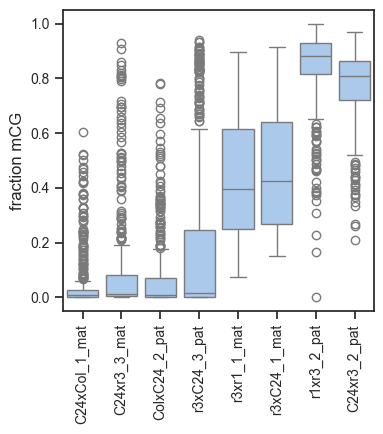

In [251]:
fig,ax=sumby_boxplot(r3_CGr_POI_mCG_allparent, matpat_1rep, 'CG')
fig.set_size_inches(4,4.5)
plt.tight_layout()

plt.savefig(figurepath+'r3_CGr_sumby_matpat1rep_box_CG.pdf', dpi=350)
#plt.savefig(figurepath+'ros1ant_sumby_pat1rep_box_CG.png', dpi=350)


In [419]:
np.std(r3_CGr_POI_mCG_allparent[['C24xr3_1_pat','C24xr3_2_pat','C24xr3_3_pat']])



C24xr3_1_pat    0.134211
C24xr3_2_pat    0.131554
C24xr3_3_pat    0.246157
dtype: float64

In [421]:
np.mean(r3_CGr_POI_mCG_allparent[['C24xr3_1_pat','C24xr3_2_pat','C24xr3_3_pat']])



C24xr3_1_pat    0.795138
C24xr3_2_pat    0.774556
C24xr3_3_pat    0.678906
dtype: float64

In [415]:
np.std(r3_CGr_POI_mCG_allparent['r1xr3_1_pat'])



0.15191002873651774

In [422]:
print(np.std(np.mean(r3_CGr_POI_mCG_allparent[['r1xr3_1_pat','r1xr3_2_pat','r1xr3_3_pat']])))

print(np.mean(r3_CGr_POI_mCG_allparent[['r1xr3_1_pat','r1xr3_2_pat','r1xr3_3_pat']]))



0.0034744389405029666
r1xr3_1_pat    0.836980
r1xr3_2_pat    0.844029
r1xr3_3_pat    0.844635
dtype: float64


In [423]:
print(np.std(np.mean(r3_CGr_POI_mCG_allparent[['C24xr3_1_pat','C24xr3_2_pat','C24xr3_3_pat']])))

print(np.mean(r3_CGr_POI_mCG_allparent[['C24xr3_1_pat','C24xr3_2_pat','C24xr3_3_pat']]))





0.05064290527264165
C24xr3_1_pat    0.795138
C24xr3_2_pat    0.774556
C24xr3_3_pat    0.678906
dtype: float64


In [431]:
print(np.std(np.mean(r3_CGr_POI_mCG_allparent[['r3xr1_1_mat','r3xr1_2_mat','r3xr1_3_mat']])))

print(np.mean(r3_CGr_POI_mCG_allparent[['r3xr1_1_mat','r3xr1_2_mat','r3xr1_3_mat']]))



0.030483372254778453
r3xr1_1_mat    0.438504
r3xr1_2_mat    0.404204
r3xr1_3_mat    0.478792
dtype: float64


In [432]:
print(np.std(np.mean(r3_CGr_POI_mCG_allparent[['r3xC24_1_mat','r3xC24_2_mat','r3xC24_3_mat']])))

print(np.mean(r3_CGr_POI_mCG_allparent[['r3xC24_1_mat','r3xC24_2_mat','r3xC24_3_mat']]))



0.05844983319945567
r3xC24_1_mat    0.461832
r3xC24_2_mat    0.508724
r3xC24_3_mat    0.368126
dtype: float64


In [436]:
print(np.std(np.mean(r3_CGr_POI_mCG_allparent[['C24xCol_1_mat','C24xCol_2_mat','C24xCol_3_mat']])))

print(np.mean(r3_CGr_POI_mCG_allparent[['C24xCol_1_mat','C24xCol_2_mat','C24xCol_3_mat']]))



0.013139474523583638
C24xCol_1_mat    0.050536
C24xCol_2_mat    0.076938
C24xCol_3_mat    0.079678
dtype: float64


In [438]:
print(np.std(np.mean(r3_CGr_POI_mCG_allparent[['C24xr3_1_pat','C24xr3_2_pat','C24xr3_3_pat']])))

print(np.mean(r3_CGr_POI_mCG_allparent[['C24xr3_1_pat','C24xr3_2_pat','C24xr3_3_pat']]))





0.05064290527264165
C24xr3_1_pat    0.795138
C24xr3_2_pat    0.774556
C24xr3_3_pat    0.678906
dtype: float64


Statistics for supplemental fig 19 boxplot

In [447]:
tests=8
#4 mat and 4 pat comparisons not overlapping?)

In [445]:
#C24 pat hmz x r3 pat hmz
t_stat, p_value = stats.ttest_ind(np.mean(r3_CGr_POI_mCG_allparent[['ColxC24_1_pat','ColxC24_2_pat','ColxC24_3_pat']]), np.mean(r3_CGr_POI_mCG_allparent[['r1xr3_1_pat','r1xr3_2_pat','r1xr3_3_pat']]), equal_var=False)
print("T statistic:", t_stat)
print("P-value:", p_value)
bonferonni_p=p_value*tests
print("Bonferonni-p:",bonferonni_p)

T statistic: -53.73893653194444
P-value: 0.00022757745542553725
Bonferonni-p: 0.001820619643404298


In [446]:
#C24 pat hmz x r3 pat het
t_stat, p_value = stats.ttest_ind(np.mean(r3_CGr_POI_mCG_allparent[['ColxC24_1_pat','ColxC24_2_pat','ColxC24_3_pat']]), np.mean(r3_CGr_POI_mCG_allparent[['C24xr3_1_pat','C24xr3_2_pat','C24xr3_3_pat']]), equal_var=False)
print("T statistic:", t_stat)
print("P-value:", p_value)
bonferonni_p=p_value*tests
print("Bonferonni-p:",bonferonni_p)

T statistic: -17.224665658279505
P-value: 0.000980913530854711
Bonferonni-p: 0.007847308246837688


In [441]:
#r3 pat het vs r3 pat hmz
t_stat, p_value = stats.ttest_ind(np.mean(r3_CGr_POI_mCG_allparent[['C24xr3_1_pat','C24xr3_2_pat','C24xr3_3_pat']]), np.mean(r3_CGr_POI_mCG_allparent[['r1xr3_1_pat','r1xr3_2_pat','r1xr3_3_pat']]), equal_var=False)
print("T statistic:", t_stat)
print("P-value:", p_value)
bonferonni_p=p_value*tests
print("Bonferonni-p:",bonferonni_p)

T statistic: -2.572786006978623
P-value: 0.1225208484166402
Bonferonni-p: 0.9801667873331216


In [444]:
#C24 pat het vs C24 pat hmz
t_stat, p_value = stats.ttest_ind(np.mean(r3_CGr_POI_mCG_allparent[['r3xC24_1_pat','r3xC24_2_pat','r3xC24_3_pat']]), np.mean(r3_CGr_POI_mCG_allparent[['ColxC24_1_pat','ColxC24_2_pat','ColxC24_3_pat']]), equal_var=False)
print("T statistic:", t_stat)
print("P-value:", p_value)
bonferonni_p=p_value*tests
print("Bonferonni-p:",bonferonni_p)

T statistic: 7.7684083959782555
P-value: 0.014707115887199468
Bonferonni-p: 0.11765692709759575


In [442]:
#C24 mat het vs C24 mat hmz
t_stat, p_value = stats.ttest_ind(np.mean(r3_CGr_POI_mCG_allparent[['C24xr3_1_mat','C24xr3_2_mat','C24xr3_3_mat']]), np.mean(r3_CGr_POI_mCG_allparent[['C24xCol_1_mat','C24xCol_2_mat','C24xCol_3_mat']]), equal_var=False)
print("T statistic:", t_stat)
print("P-value:", p_value)
bonferonni_p=p_value*tests
print("Bonferonni-p:",bonferonni_p)

T statistic: 2.7728045350322135
P-value: 0.0795229313464156
Bonferonni-p: 0.6361834507713248


In [443]:
#r3 mat het vs r3 mat hmz
t_stat, p_value = stats.ttest_ind(np.mean(r3_CGr_POI_mCG_allparent[['r3xC24_1_mat','r3xC24_2_mat','r3xC24_3_mat']]), np.mean(r3_CGr_POI_mCG_allparent[['r3xr1_1_mat','r3xr1_2_mat','r3xr1_3_mat']]), equal_var=False)
print("T statistic:", t_stat)
print("P-value:", p_value)
bonferonni_p=p_value*tests
print("Bonferonni-p:",bonferonni_p)

T statistic: 0.122872547981488
P-value: 0.9099461619061722
Bonferonni-p: 7.279569295249377


In [451]:
#C24 mat hmz vs r3 mat hmz
t_stat, p_value = stats.ttest_ind(np.mean(r3_CGr_POI_mCG_allparent[['C24xCol_1_mat','C24xCol_2_mat','C24xCol_3_mat']]), np.mean(r3_CGr_POI_mCG_allparent[['r3xr1_1_mat','r3xr1_2_mat','r3xr1_3_mat']]), equal_var=False)
print("T statistic:", t_stat)
print("P-value:", p_value)
bonferonni_p=p_value*tests
print("Bonferonni-p:",bonferonni_p)

T statistic: -15.82513058233064
P-value: 0.0009346397221779772
Bonferonni-p: 0.007477117777423817


In [452]:
#C24 mat hmz vs r3 mat het
t_stat, p_value = stats.ttest_ind(np.mean(r3_CGr_POI_mCG_allparent[['C24xCol_1_mat','C24xCol_2_mat','C24xCol_3_mat']]), np.mean(r3_CGr_POI_mCG_allparent[['r3xC24_1_mat','r3xC24_2_mat','r3xC24_3_mat']]), equal_var=False)
print("T statistic:", t_stat)
print("P-value:", p_value)
bonferonni_p=p_value*tests
print("Bonferonni-p:",bonferonni_p)

T statistic: -8.90372552323596
P-value: 0.009106960671128298
Bonferonni-p: 0.07285568536902638


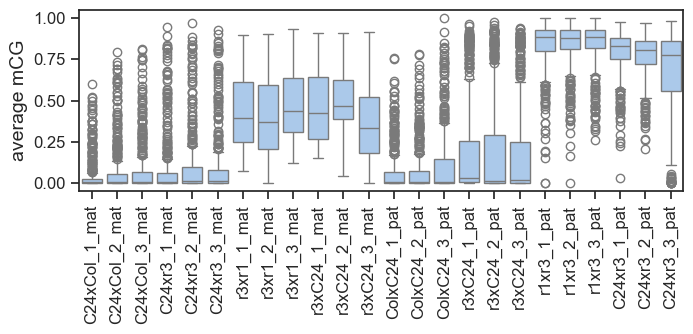

In [449]:
fig,ax=sumby_boxplot(r3_CGr_POI_mCG_allparent, matpat, 'CG')
fig.set_size_inches(7,3.5)

plt.tight_layout()

plt.savefig(figurepath+'r3_CGr_sumby_matpat_box_CG.pdf', dpi=350)
#plt.savefig(figurepath+'ros1ant_sumby_pat1rep_box_CG.png', dpi=350)


## scatterplot with fit line

In [200]:
r3CGr_POI_mCG_avg_mat=makeavgdf_mat(r3_CGr_POI_mCG_allparent)

slope = 0.684414305446839
intercept = 0.32888999208533254
r value =0.7034954428608401
p value =1.109853467981815e-63
plot not saved


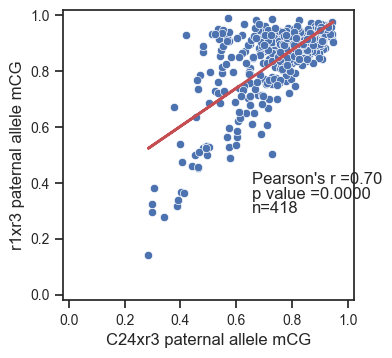

In [211]:
fig,ax=scatter_dmrmatpat(r3CGr_POI_mCG_avg, x="C24xr3_pat", y="r1xr3_pat", xlabel="C24xr3 paternal allele mCG", ylabel="r1xr3 paternal allele mCG", hue=None,correlate=True, left_text=False, 
                         saveas=False, fit_line=True, color_outliers=False)
fig.set_size_inches(4,4)
plt.tight_layout()

plt.savefig(figurepath+"r3pat_F1s_mCG_in_r3_CGr_scatter_fitline.pdf", dpi=350)


Comparing DME regions and ROS1 regions

In [268]:
#histogram of distance between dmr sets
dpath=path+"dmr_targets_new/dme_features/"
close_col=['chrA','startA','endA','DMR','chrB','startB','endB','distance']
close_col2=['chrA','startA','endA','DMR','chrB','startB','endB','DMRB','distance']

ros1allC_closest_dme=pd.read_csv(dpath+"r3allC_closest_dme.bed", sep=tab, header=None, names=close_col2)
ros1allC_closest_dme_15000max=ros1allC_closest_dme[ros1allC_closest_dme['distance']<15000]                           
ros1allC_closest_dme['distance'] = ros1allC_closest_dme['distance'].apply(lambda x: 15001 if x > 15000 else x)

ros1CG_closest_dme=pd.read_csv(dpath+"r3CG_closest_dme.bed", sep=tab, header=None, names=close_col2)
ros1CG_closest_dme_15000max=ros1CG_closest_dme[ros1CG_closest_dme['distance']<15000]                           
ros1CG_closest_dme['distance'] = ros1CG_closest_dme['distance'].apply(lambda x: 15001 if x > 15000 else x)

def distance_histogram(df, title, xtitle):
    plt=sns.histplot(data=df, x="distance", stat="percent", binwidth=500, color="grey")
    plt.set_title(title,fontname="Arial", fontsize=18)
    plt.tick_params(axis='both', which='major', labelsize=16)
    plt.set_xlabel(xtitle, fontname="Arial", fontsize=16);
    plt.set_ylabel('percent', fontname="Arial", fontsize=16);
    plt.set_xlim(-500, 15500)

    return plt


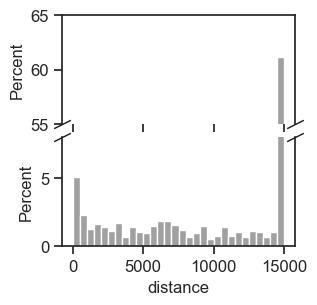

In [267]:
# If we were to simply plot pts, we'd lose most of the interesting
# details due to the outliers. So let's 'break' or 'cut-out' the y-axis
# into two portions - use the top (ax1) for the outliers, and the bottom
# (ax2) for the details of the majority of our data
fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True)
fig.subplots_adjust(hspace=0.12)  # adjust space between Axes

# plot the same data on both Axes
sns.histplot(data=ros1allC_closest_dme, x="distance", stat="percent", binwidth=500, color="grey", ax=ax2)
p=sns.histplot(data=ros1allC_closest_dme, x="distance", stat="percent", binwidth=500, color="grey", ax=ax1)

# zoom-in / limit the view to different portions of the data
ax1.set_ylim(55, 65)  # outliers only
ax2.set_ylim(0, 8)  # most of the data

# hide the spines between ax and ax2
ax1.spines.bottom.set_visible(False)
ax2.spines.top.set_visible(False)
ax1.tick_params(labeltop=False, labelsize=12)  # don't put tick labels at the top
ax2.tick_params(labeltop=False, labelsize=12)  # don't put tick labels at the top

ax2.xaxis.tick_bottom()
ax1.yaxis.tick_left()
ax2.yaxis.tick_left()

# Now, let's turn towards the cut-out slanted lines.
# We create line objects in axes coordinates, in which (0,0), (0,1),
# (1,0), and (1,1) are the four corners of the Axes.
# The slanted lines themselves are markers at those locations, such that the
# lines keep their angle and position, independent of the Axes size or scale
# Finally, we need to disable clipping.

d = .5  # proportion of vertical to horizontal extent of the slanted line
kwargs = dict(marker=[(-1, -d), (1, d)], markersize=12,
              linestyle="none", color='k', mec='k', mew=1, clip_on=False)
ax1.plot([0, 1], [0, 0], transform=ax1.transAxes, **kwargs)
ax2.plot([0, 1], [1, 1], transform=ax2.transAxes, **kwargs)

fig.set_size_inches(3,3)

plt.savefig(figurepath+'ros1allC_closest_dme_histo.pdf', dpi=350)


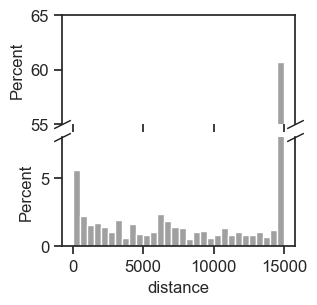

In [269]:
# If we were to simply plot pts, we'd lose most of the interesting
# details due to the outliers. So let's 'break' or 'cut-out' the y-axis
# into two portions - use the top (ax1) for the outliers, and the bottom
# (ax2) for the details of the majority of our data
fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True)
fig.subplots_adjust(hspace=0.12)  # adjust space between Axes

# plot the same data on both Axes
sns.histplot(data=ros1CG_closest_dme, x="distance", stat="percent", binwidth=500, color="grey", ax=ax2)
p=sns.histplot(data=ros1CG_closest_dme, x="distance", stat="percent", binwidth=500, color="grey", ax=ax1)

# zoom-in / limit the view to different portions of the data
ax1.set_ylim(55, 65)  # outliers only
ax2.set_ylim(0, 8)  # most of the data

# hide the spines between ax and ax2
ax1.spines.bottom.set_visible(False)
ax2.spines.top.set_visible(False)
ax1.tick_params(labeltop=False, labelsize=12)  # don't put tick labels at the top
ax2.tick_params(labeltop=False, labelsize=12)  # don't put tick labels at the top

ax2.xaxis.tick_bottom()
ax1.yaxis.tick_left()
ax2.yaxis.tick_left()

# Now, let's turn towards the cut-out slanted lines.
# We create line objects in axes coordinates, in which (0,0), (0,1),
# (1,0), and (1,1) are the four corners of the Axes.
# The slanted lines themselves are markers at those locations, such that the
# lines keep their angle and position, independent of the Axes size or scale
# Finally, we need to disable clipping.

d = .5  # proportion of vertical to horizontal extent of the slanted line
kwargs = dict(marker=[(-1, -d), (1, d)], markersize=12,
              linestyle="none", color='k', mec='k', mew=1, clip_on=False)
ax1.plot([0, 1], [0, 0], transform=ax1.transAxes, **kwargs)
ax2.plot([0, 1], [1, 1], transform=ax2.transAxes, **kwargs)

fig.set_size_inches(3,3)

plt.savefig(figurepath+'ros1CGr_closest_dme_histo.pdf', dpi=350)


DME TEs (1kb or int) ends

In [476]:
dmeends=path+"dmr_targets_new/dme_TE_ends/"
dme_TEs_CG=read_ends_data(dmeends+'dme_tes_CG_in2kbout2kb_average_counts_filt.txt')
dme_TEs_CHG=read_ends_data(dmeends+'dme_tes_CHG_in2kbout2kb_average_counts_filt.txt')
#dme_TEs_CHH=read_ends_data(dmeends+'dme_tes_CHH_in2kbout2kb_average_counts_filt.txt')


#allelic r3 TEs
endsTEs='/lab/solexa_gehring/elizabeth/ros1_endo_review_analysis/ends_TEs/'
r3_TEs_CG=read_ends_data(endsTEs+'r3_1kb_tes_CG_in2kbout2kb_average_counts_filt.txt')
r3_TEs_CHG=read_ends_data(dmeends+'dme_tes_CHG_in2kbout2kb_average_counts_filt.txt')
#dme_TEs_CHH=read_ends_data(dmeends+'dme_tes_CHH_in2kbout2kb_average_counts_filt.txt')


/tmp/ipykernel_3065292/1823453308.py:5: FutureWarning: The default value of regex will change from True to False in a future version.
  df['sample'] = df['sample'].str.replace('.bed', '')


CG


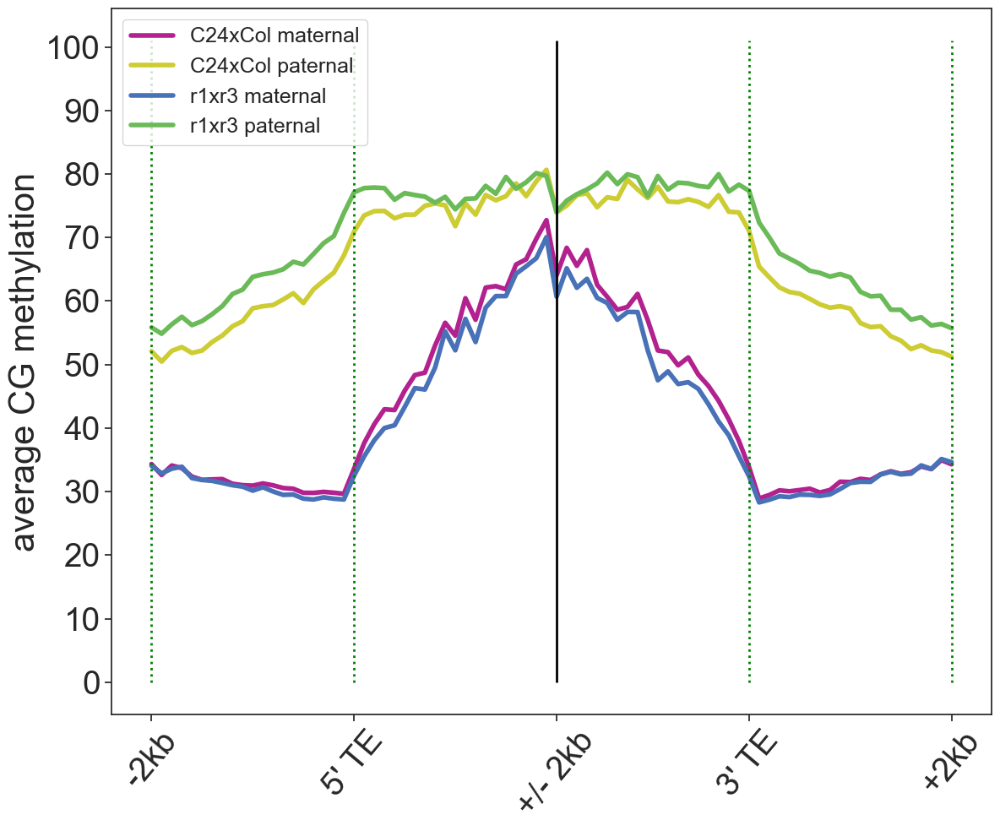

In [331]:
methylends_format(dme_TEs_CG, 'col1rep', '', matpatlegend, in2000_out2000_100bp_ticks, in2000_out2000_100bp_tick_labels_TE,
                  in2000_out2000_100bp_vlines, in2000_out2000_100bp_vlines_center, 0, 101, 10, context='CG')
#plt.tight_layout()
plt.savefig(figurepath+'dme_TEs_matpatCol_CG_ends.pdf', dpi=350)


CG


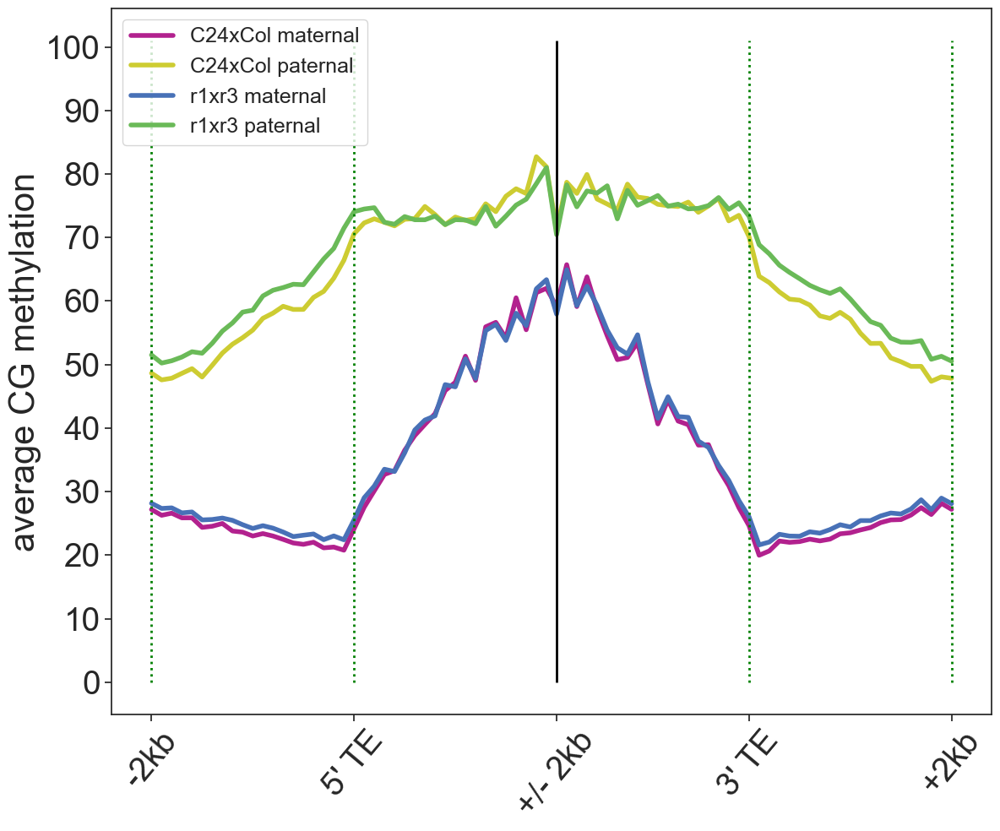

In [332]:
methylends_format(dme_TEs_CG, 'c241rep', '', matpatlegend, in2000_out2000_100bp_ticks, in2000_out2000_100bp_tick_labels_TE,
                  in2000_out2000_100bp_vlines, in2000_out2000_100bp_vlines_center, 0, 101, 10, context='CG')
#plt.tight_layout()
plt.savefig(figurepath+'dme_TEs_matpatC24_CG_ends.pdf', dpi=350)


CG


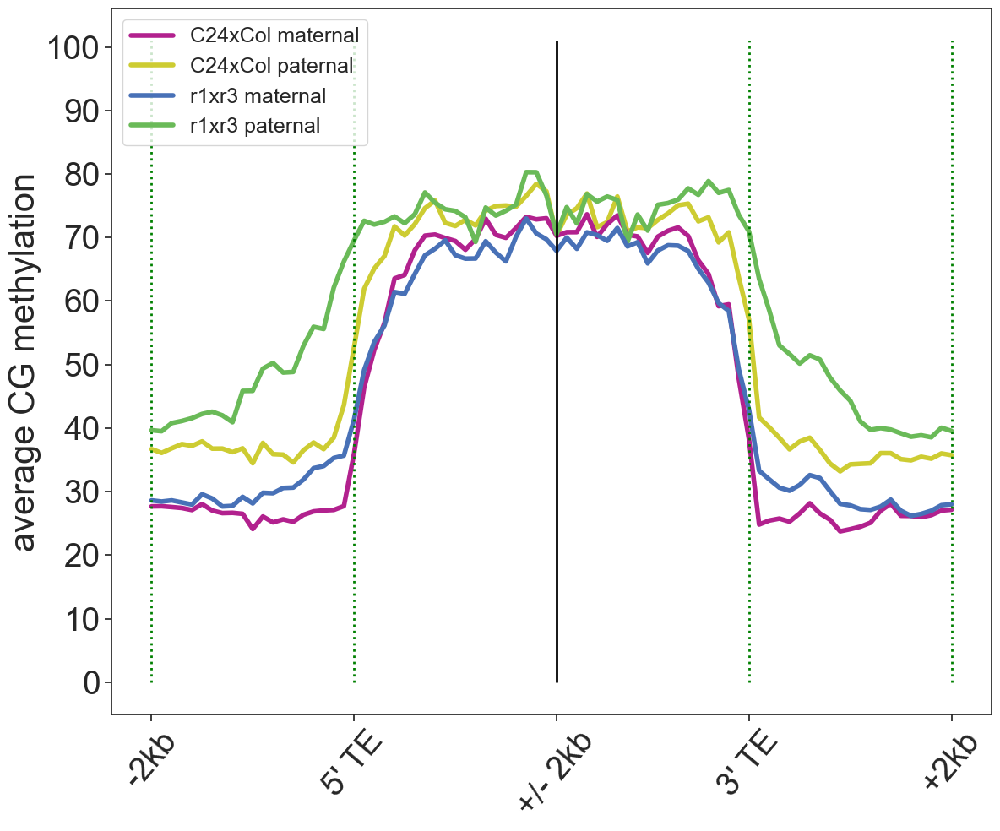

In [478]:
methylends_format(r3_TEs_CG, 'col1rep', '', matpatlegend, in2000_out2000_100bp_ticks, in2000_out2000_100bp_tick_labels_TE,
                  in2000_out2000_100bp_vlines, in2000_out2000_100bp_vlines_center, 0, 101, 10, context='CG')
#plt.tight_layout()
plt.savefig(figurepath+'r3_TEs_matpatCol_CG_ends.pdf', dpi=350)


DMR ends

In [292]:
dmrends=path+'dmr_targets_new/DMR_ends/'
r3_CGr_CG_ends=read_ends_data(dmrends+"r3_CG_CG_in200out1kb_average_counts_filt.txt")
r3_allC_CG_ends=read_ends_data(dmrends+"r3_allC_CG_in200out1kb_average_counts_filt.txt")
dme_CG_ends=read_ends_data(dmrends+"dme_CG_in400out1kb_average_counts_filt.txt")


/tmp/ipykernel_3065292/1823453308.py:5: FutureWarning: The default value of regex will change from True to False in a future version.
  df['sample'] = df['sample'].str.replace('.bed', '')


In [293]:
# lines for smaller x axis from bigger ends data
in200_out1000_50bp_ticks=[1, 20, 24.5, 29, 48]

in200_out1000_50bp_ticks_DMR_labels=['-1kb', "5' DMR", '+/- 200bp', "3' DMR", '+1kb']
in200_out1000_50bp_ticks_DSR_labels=['-1kb', "5' DSR", '+/- 200bp', "3' DSR", '+1kb']

in200_out1000_50bp_vlines=[1, 20, 29, 48]
in200_out1000_50bp_vlines_center =[24.5]

# lines for smaller x axis from bigger ends data
in400_out1000_50bp_ticks=[1, 20, 28, 36, 56]

in400_out1000_50bp_ticks_labels=['-1kb', "5' DMR", '+/- 400bp', "3' DMR", '+1kb']

in400_out1000_50bp_vlines=[1, 20, 36, 56]
in400_out1000_50bp_vlines_center =[28]



CG


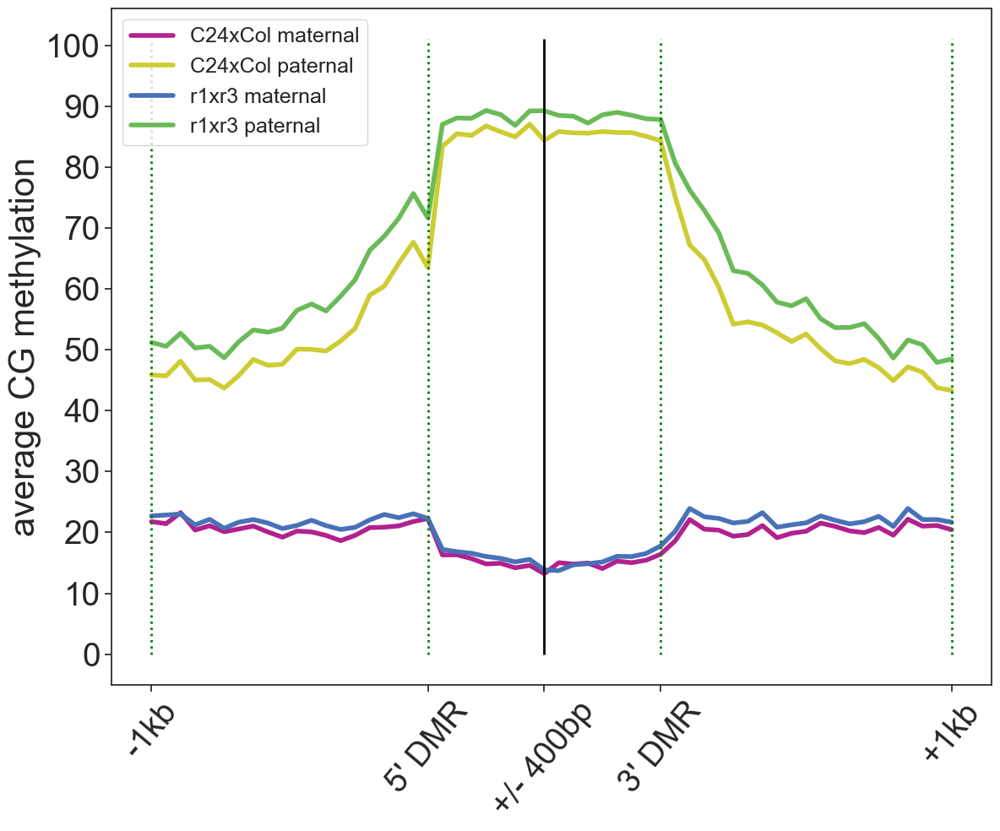

In [306]:
methylends_format(dme_CG_ends, 'matpat1rep', '', matpatlegend, in400_out1000_50bp_ticks, in400_out1000_50bp_ticks_labels,
                  in400_out1000_50bp_vlines, in400_out1000_50bp_vlines_center, 0, 101, 10, context='CG', sRNA=False)
plt.savefig(figurepath+'dme_allC_CG_matpat_ends.pdf', dpi=350)



CG


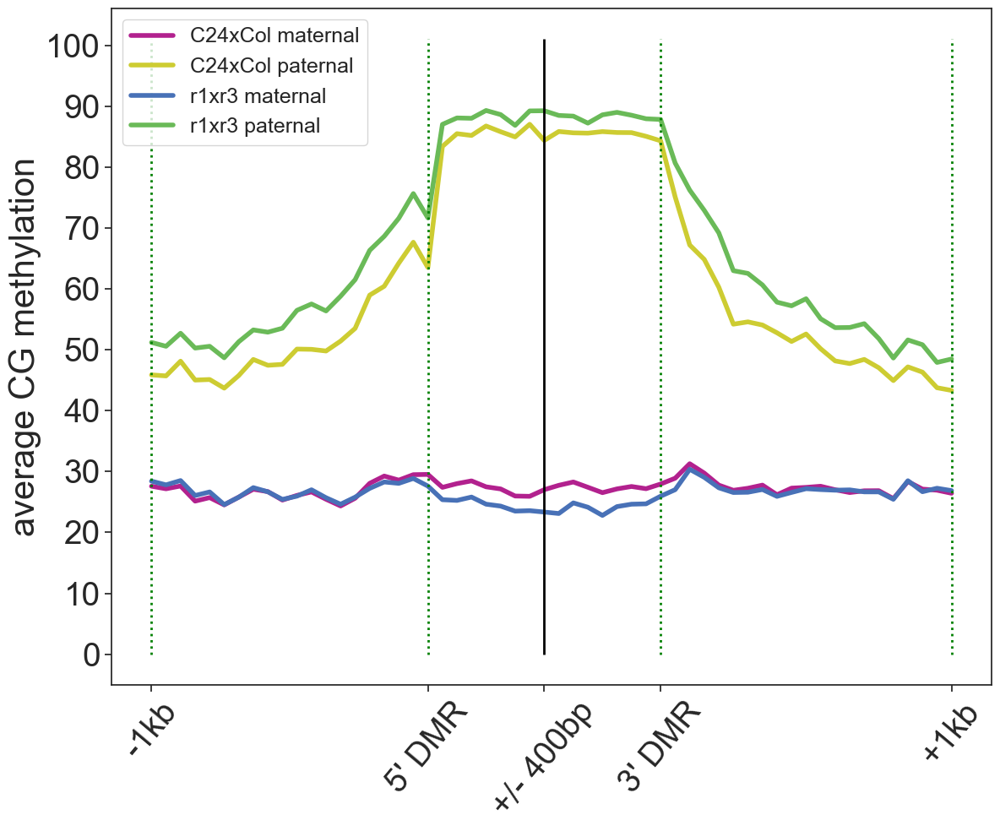

In [333]:
methylends_format(dme_CG_ends, 'col1rep', '', matpatlegend, in400_out1000_50bp_ticks, in400_out1000_50bp_ticks_labels,
                  in400_out1000_50bp_vlines, in400_out1000_50bp_vlines_center, 0, 101, 10, context='CG', sRNA=False)
plt.savefig(figurepath+'dme_allC_CG_matpatCol_ends.pdf', dpi=350)



CG


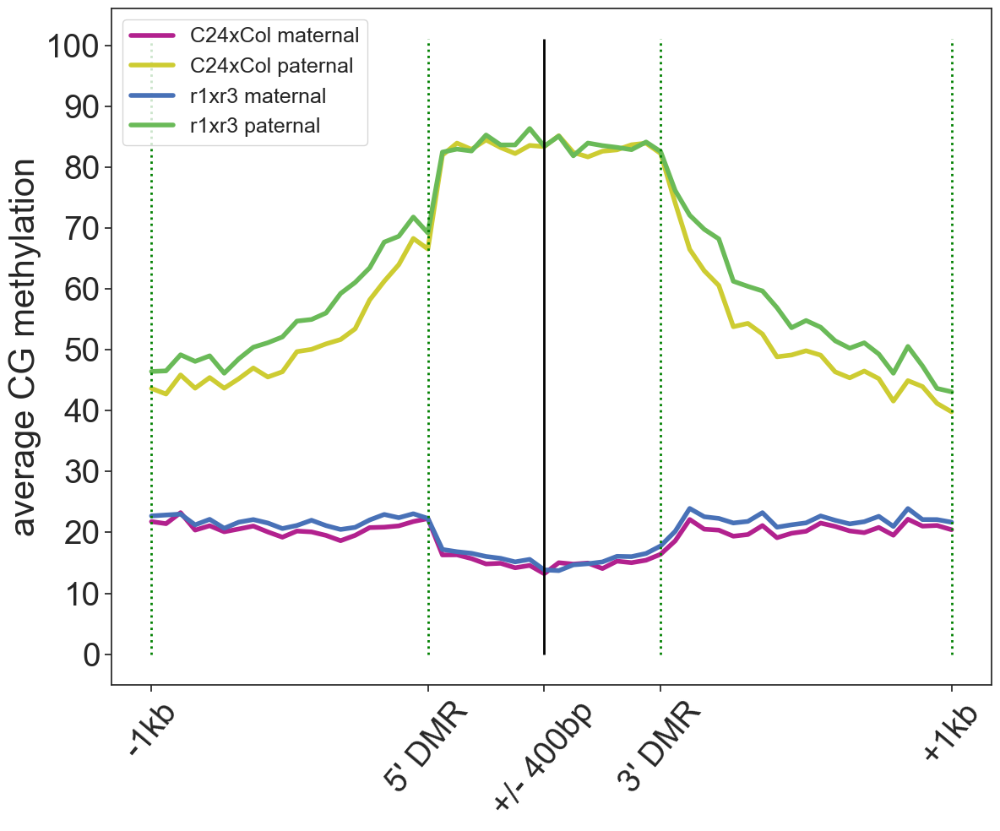

In [334]:
methylends_format(dme_CG_ends, 'c241rep', '', matpatlegend, in400_out1000_50bp_ticks, in400_out1000_50bp_ticks_labels,
                  in400_out1000_50bp_vlines, in400_out1000_50bp_vlines_center, 0, 101, 10, context='CG', sRNA=False)
plt.savefig(figurepath+'dme_allC_CG_matpatC24_ends.pdf', dpi=350)



CG


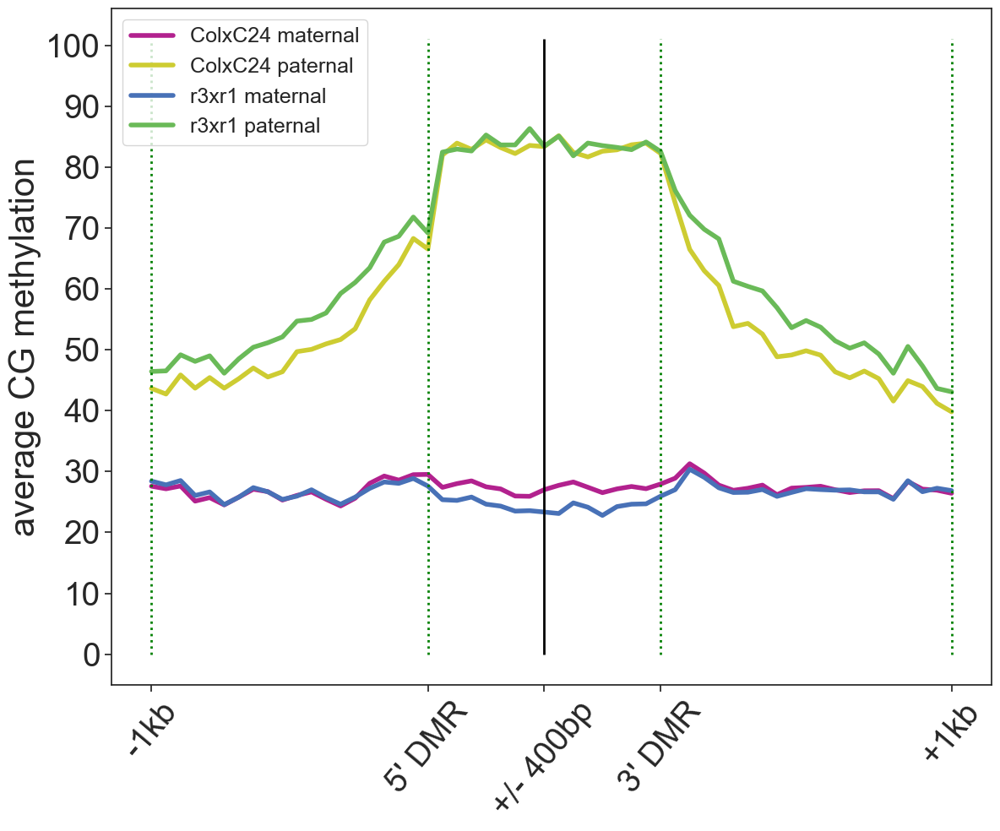

In [317]:
methylends_format(dme_CG_ends, 'matpatrecip', '', matpatreciplegend, in400_out1000_50bp_ticks, in400_out1000_50bp_ticks_labels,
                  in400_out1000_50bp_vlines, in400_out1000_50bp_vlines_center, 0, 101, 10, context='CG', sRNA=False)
plt.savefig(figurepath+'dme_allC_CG_matpatrecip_ends.pdf', dpi=350)



CG


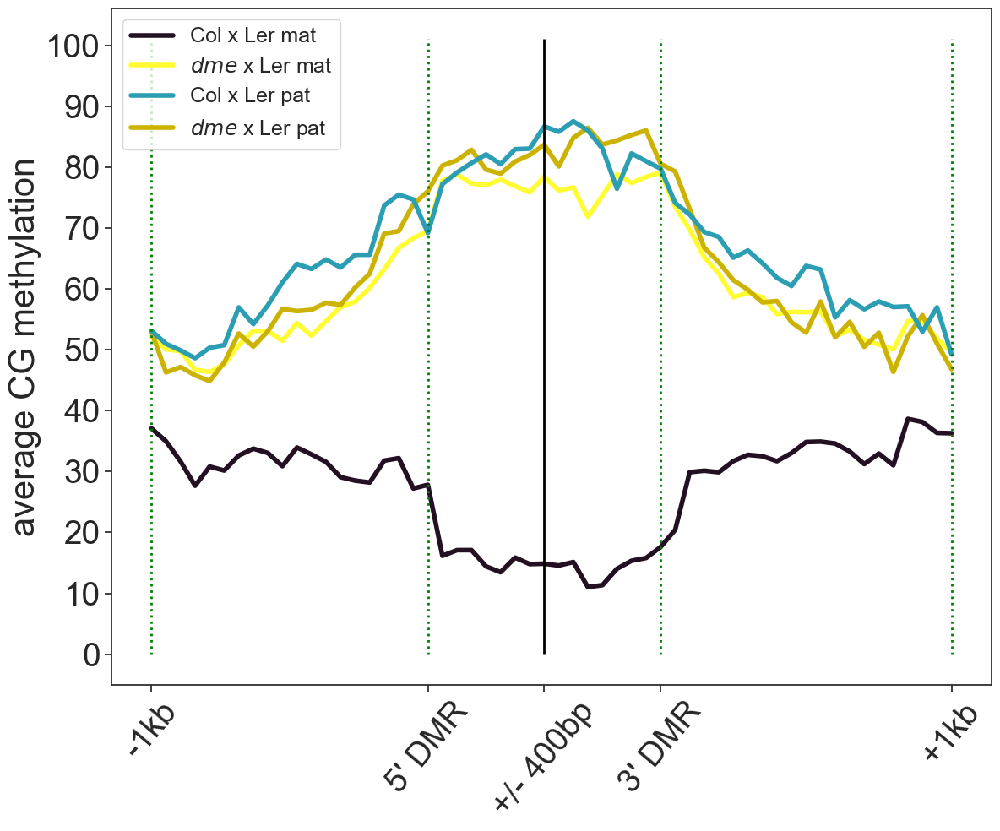

In [305]:
methylends_format(dme_CG_ends, 'ibarra', '', ibarra_legend, in400_out1000_50bp_ticks, in400_out1000_50bp_ticks_labels,
                  in400_out1000_50bp_vlines, in400_out1000_50bp_vlines_center, 0, 101, 10, context='CG', sRNA=False)
plt.savefig(figurepath+'dme_allC_CG_ibarra_ends.pdf', dpi=350)



CG


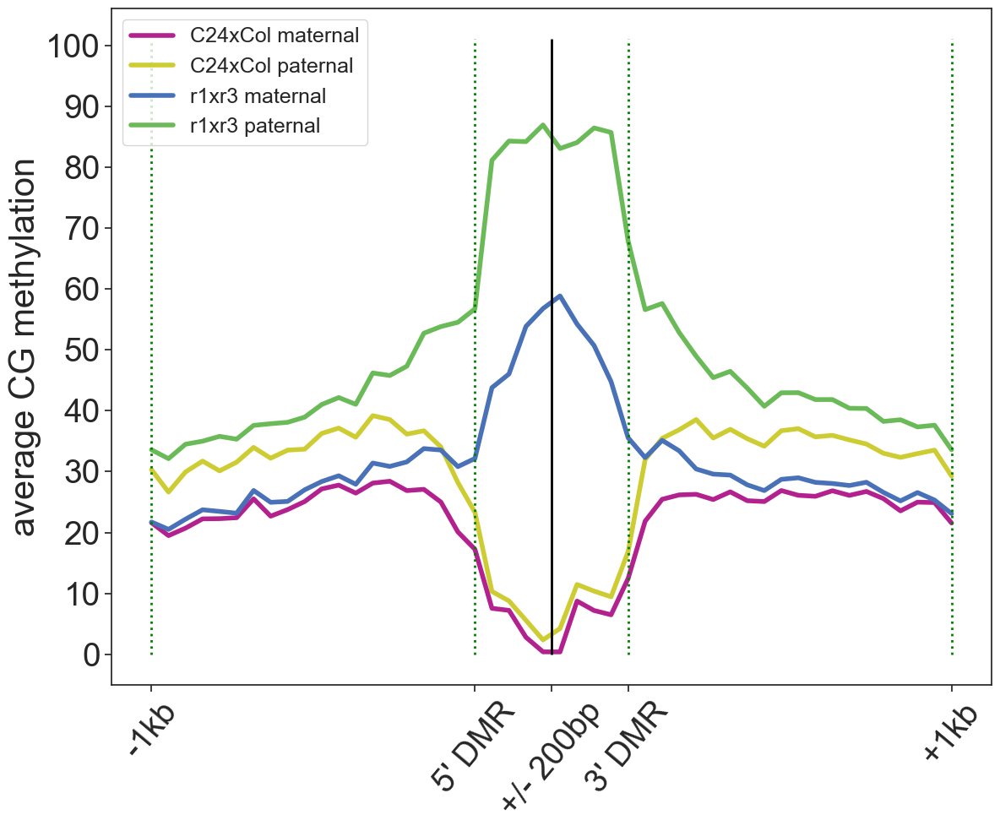

In [336]:
methylends_format(r3_allC_CG_ends, 'col1rep', '', matpatlegend, in200_out1000_50bp_ticks, in200_out1000_50bp_ticks_DMR_labels,
                  in200_out1000_50bp_vlines, in200_out1000_50bp_vlines_center, 0, 101, 10, context='CG', sRNA=False)
plt.savefig(figurepath+'r3_allC_CG_matpatCol_ends.pdf', dpi=350)

